In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import matplotlib
from matplotlib import colors,colorbar
import matplotlib
%matplotlib inline
import csv 
import math
import bq
import time
import cPickle 
from scipy import stats

to generate the mmsi:

```
SELECT
  a.shiptype_text shiptype_text,
  a.mmsi mmsi,
  a.number number_of_points
FROM (
  SELECT
    mmsi,
    shiptype_text,
    COUNT(*) number
  FROM
    TABLE_DATE_RANGE([type5and24messages.], TIMESTAMP('2015-01-01'), TIMESTAMP('2016-03-31'))
  GROUP BY
    mmsi,
    shiptype_text) a
JOIN (
  SELECT
    mmsi,
    COUNT(*) COUNT
  FROM
    TABLE_DATE_RANGE([pipeline_classify.], TIMESTAMP('2015-01-01'), TIMESTAMP('2016-03-31'))
  WHERE
    lon > 145
    AND lon < 155
    AND lat > -5
    AND lat <-2
    AND speed < 5
  GROUP BY
    mmsi
  HAVING
    COUNT >= 10)b
ON
  a.mmsi = b.mmsi
WHERE
  a.number > 20
  AND a.mmsi > 99999999
  AND shiptype_text NOT IN ("",
    "Sailing",
    "Fishing",
    "Law Enforcement",
    "Military ops",
    "Pleasure Craft",
    "Tanker, all ships of this type",
    "Tanker, Hazardous category A",
    "Tanker, Hazardous category B",
    "Tanker, No additional information",
    "Tanker, Reserved for future use",
    "Wing in ground (WIG), Reserved for future use")
```


Now create a table:

```
SELECT
  mmsi,
  timestamp,
  lat,
  lon,
  speed
FROM
  TABLE_DATE_RANGE([pipeline_classify.], TIMESTAMP('2015-01-01'), TIMESTAMP('2016-03-31'))
WHERE
  lon > 145
  AND lon < 155
  AND lat > -5
  AND lat <-2
  and mmsi in (412203740,440014000,564165000,371364000,636090267,440123000,372030000,441822000,548003500,431686000,311000205,553111690,353656000,371685000,636014031,355709000,576285000,373615000,353656000,235070716,477435100,553111764,353180000,355813000,416237500,412322280,440014000,355813000,553111757,235060306,553111592,561003000,356483000,548906000,553111688,533000000,211512000,538005430,538003218,477739500,477059000,311019700,477950800,477852600,533000000,440214000,354426000,440552000,212031000,477066300,352366000,444080710,477440400,525025072,353656000,376227000,529739000,477060000,431602240,636015895,305212000,533795000,576277000,477173300,304303000,538090164,503492000,441837000,357020000,553111712,636014031,371198000,339300780,351413000,477549000,525025072,553111697,553111742,227222000,477860000,357687000,235070716,309913000,357910000,564856000,371337000,477903200,564583000,416241500,564042000,477440400,636092331,477860000,477454400,440575000,355133000,371685000,311019700,503359400,477897800,235113823,477476100,525015960,416221900,235070716,310625000,477083300,553111722,533000000,477062000,373349000,227222000,353563000,477938400,564861000,431700030,477059000,354246000,370966000,477061000,553111628,352206000,529605000,249672000,548352100,548305000,553111341,256524000,371198000,636090267,351178000,310465000,548092100,341834000,352586000,357020000,576277000,215737000,235060306,553111564,565758000,529086000,353242000,305212000,553111802,553111713,553111764,273457210,553111110,440095000,538090164,304303000,511011033,357203000,477542800,564190000,311019700,351943000,477296500,355966000,533170143,477440400,636014031,355813000,576397000,553111735,548924000,372594000,356065000,373371000,636012294,636090756,525025072,209828000,477059000,553111110,477795600,416238700,212169000,525021304,431704110,477440300,553111765,538005430,538004048,354246000,511011000,372381000,352778000,211512000,477066300,351260000,441429000,441034000,412439607,477060000,311021600,553111637,576277000,529739000,564260000,553111110,477860000,304303000,235060306,370887000,477549000,432470000,357091000,518393000,371198000,441675000,440450000,372580000,477158200,416411000,441923000,357050000,567046600,636090756,353923000,372865000,355230000,370927000,564856000,305051000,356591000,440222000,372613000,477852600,357154000,441166000,441822000,416411000,372907000,477062000,374148000,305212000,416243700,432969000,357203000,553111367,553111677,636092476,477739500,416171700,538003563,353563000,235100519,529604000,441493000,553111696,477061000,352085000,209828000,553111716,548446000,305051000,566613000,440196000,338090743,357146000,565967000,477947600,477440300,209828000,352796000,538090164,477250800,533000000,356889000,564943000,352533000,354746000,548092100,431671000,355430000,553111747,477261700,352181000,553111485,477066300,311000205,477066300,477440300,441240000,538003835,477062000,357910000,374230000,477110800,310465000,538090164,503486000,229016000,353496000,574442000,477060000,440113000,371319000,371529000,548487100,553111630,372580000,432957000,431310000,576277000,440257000,412330910,566533000,553111534,309955000,353628000,565967000,533000000,416241500,533000000,371319000,440481000,565236000,235073854,636015895,373462000,564856000,477852500,477685500,542185110,215737000,235059368,477351500,457648000,553111757,538090164,431587000,553111712,553111170,440123000,564042000,553111698,553111747,416171700,477435100,538003563,235059368,431167000,432744000,416043800,341834000,477454400,357055000,431006105,310465000,412420919,529586000,477947600,227222000,564943000,374315000,553111643,477860000,576276000,212031000,356158000,511011000,548895000,431167000,431308000,416003632,304303000,351589000,215222000,440195000,563010260,477163700,357154000,236273000,413278000,636092331,564683000,353069000,431294000,374148000,553111765)
```

saved in  [scratch_david.Papua_DSM_Test] 

In [3]:
client = bq.Client.Get()
def Query(q):
    t0 = time.time()
    answer = client.ReadTableRows(client.Query(q)['configuration']['query']['destinationTable'])
    print 'Query time: ' + str(time.time() - t0) + ' seconds.'
    return answer


In [6]:
mmsi = [412203740,440014000,564165000,371364000,636090267,440123000,372030000,441822000,548003500,431686000,311000205,553111690,353656000,371685000,636014031,355709000,576285000,373615000,353656000,235070716,477435100,553111764,353180000,355813000,416237500,412322280,440014000,355813000,553111757,235060306,553111592,561003000,356483000,548906000,553111688,533000000,211512000,538005430,538003218,477739500,477059000,311019700,477950800,477852600,533000000,440214000,354426000,440552000,212031000,477066300,352366000,444080710,477440400,525025072,353656000,376227000,529739000,477060000,431602240,636015895,305212000,533795000,576277000,477173300,304303000,538090164,503492000,441837000,357020000,553111712,636014031,371198000,339300780,351413000,477549000,525025072,553111697,553111742,227222000,477860000,357687000,235070716,309913000,357910000,564856000,371337000,477903200,564583000,416241500,564042000,477440400,636092331,477860000,477454400,440575000,355133000,371685000,311019700,503359400,477897800,235113823,477476100,525015960,416221900,235070716,310625000,477083300,553111722,533000000,477062000,373349000,227222000,353563000,477938400,564861000,431700030,477059000,354246000,370966000,477061000,553111628,352206000,529605000,249672000,548352100,548305000,553111341,256524000,371198000,636090267,351178000,310465000,548092100,341834000,352586000,357020000,576277000,215737000,235060306,553111564,565758000,529086000,353242000,305212000,553111802,553111713,553111764,273457210,553111110,440095000,538090164,304303000,511011033,357203000,477542800,564190000,311019700,351943000,477296500,355966000,533170143,477440400,636014031,355813000,576397000,553111735,548924000,372594000,356065000,373371000,636012294,636090756,525025072,209828000,477059000,553111110,477795600,416238700,212169000,525021304,431704110,477440300,553111765,538005430,538004048,354246000,511011000,372381000,352778000,211512000,477066300,351260000,441429000,441034000,412439607,477060000,311021600,553111637,576277000,529739000,564260000,553111110,477860000,304303000,235060306,370887000,477549000,432470000,357091000,518393000,371198000,441675000,440450000,372580000,477158200,416411000,441923000,357050000,567046600,636090756,353923000,372865000,355230000,370927000,564856000,305051000,356591000,440222000,372613000,477852600,357154000,441166000,441822000,416411000,372907000,477062000,374148000,305212000,416243700,432969000,357203000,553111367,553111677,636092476,477739500,416171700,538003563,353563000,235100519,529604000,441493000,553111696,477061000,352085000,209828000,553111716,548446000,305051000,566613000,440196000,338090743,357146000,565967000,477947600,477440300,209828000,352796000,538090164,477250800,533000000,356889000,564943000,352533000,354746000,548092100,431671000,355430000,553111747,477261700,352181000,553111485,477066300,311000205,477066300,477440300,441240000,538003835,477062000,357910000,374230000,477110800,310465000,538090164,503486000,229016000,353496000,574442000,477060000,440113000,371319000,371529000,548487100,553111630,372580000,432957000,431310000,576277000,440257000,412330910,566533000,553111534,309955000,353628000,565967000,533000000,416241500,533000000,371319000,440481000,565236000,235073854,636015895,373462000,564856000,477852500,477685500,542185110,215737000,235059368,477351500,457648000,553111757,538090164,431587000,553111712,553111170,440123000,564042000,553111698,553111747,416171700,477435100,538003563,235059368,431167000,432744000,416043800,341834000,477454400,357055000,431006105,310465000,412420919,529586000,477947600,227222000,564943000,374315000,553111643,477860000,576276000,212031000,356158000,511011000,548895000,431167000,431308000,416003632,304303000,351589000,215222000,440195000,563010260,477163700,357154000,236273000,413278000,636092331,564683000,353069000,431294000,374148000,553111765]   

In [9]:
plt.rcParams["figure.figsize"] = [12,7]

Waiting on bqjob_r1e1ceaeabae6d841_000001545040ef19_17 ... (0s) Current status: DONE   
Query time: 1.39055299759 seconds.


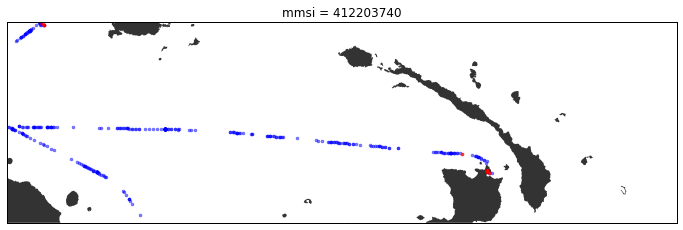

Waiting on bqjob_r1f66c0f45deb3300_000001545040fc1a_18 ... (0s) Current status: DONE   
Query time: 2.22958087921 seconds.


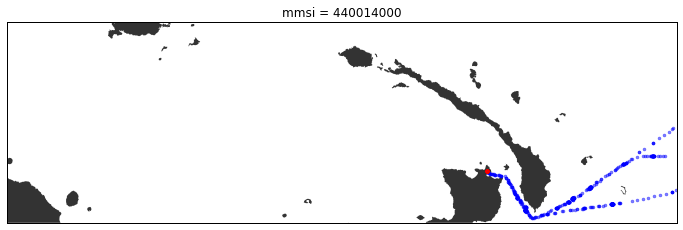

Waiting on bqjob_r2a0378525d50f40c_0000015450410c8a_19 ... (0s) Current status: DONE   
Query time: 2.40501594543 seconds.


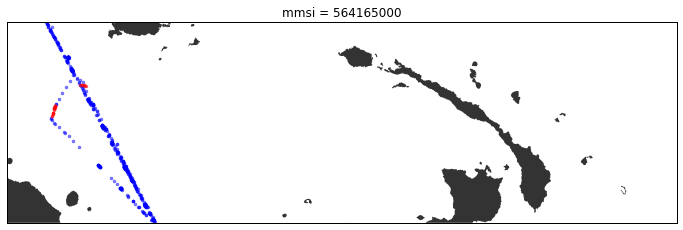

Waiting on bqjob_r637e2380e56d888a_0000015450411d87_20 ... (0s) Current status: DONE   
Query time: 2.13940620422 seconds.


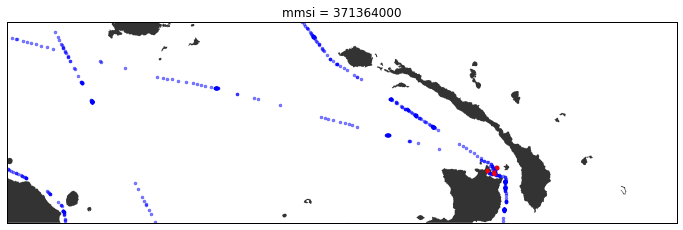

Waiting on bqjob_r1c08b570e0099765_0000015450412da0_21 ... (0s) Current status: DONE   
Query time: 2.76844620705 seconds.


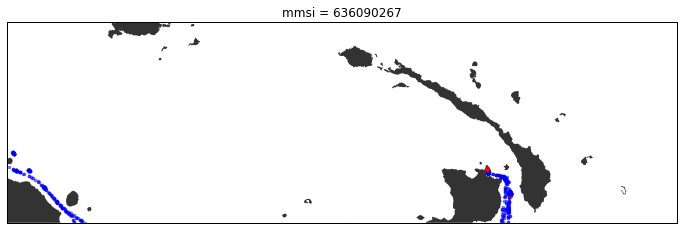

Waiting on bqjob_rb32856dcccb5ca3_0000015450414049_22 ... (0s) Current status: DONE   
Query time: 3.16139817238 seconds.


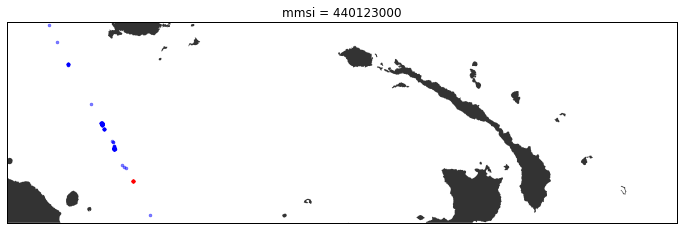

Waiting on bqjob_r5a0a2e8361d31d2c_0000015450415431_23 ... (0s) Current status: DONE   
Query time: 2.18921899796 seconds.


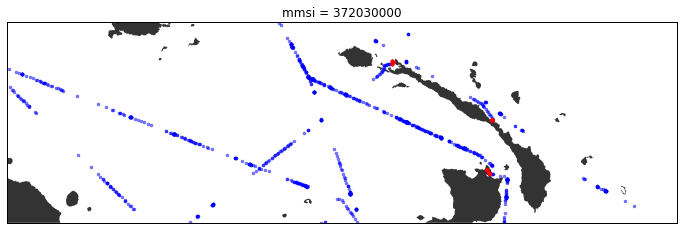

Waiting on bqjob_r1d3bd04d20053866_0000015450416420_24 ... (0s) Current status: DONE   
Query time: 2.26534199715 seconds.


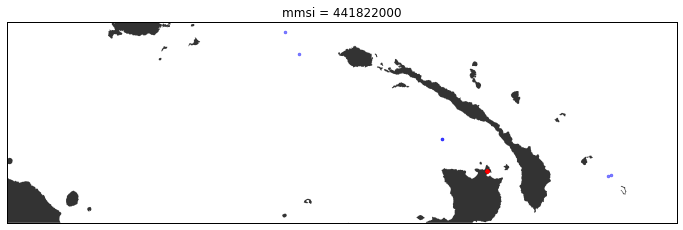

Waiting on bqjob_r7a2c9e1d85edd5e0_0000015450417588_25 ... (0s) Current status: DONE   
Query time: 2.39636111259 seconds.


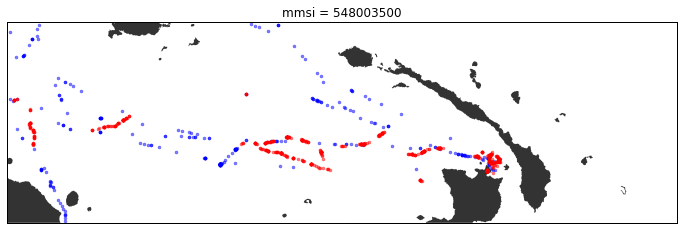

Waiting on bqjob_r4c47f0bc8f0def24_00000154504186ef_26 ... (0s) Current status: DONE   
Query time: 2.08804011345 seconds.


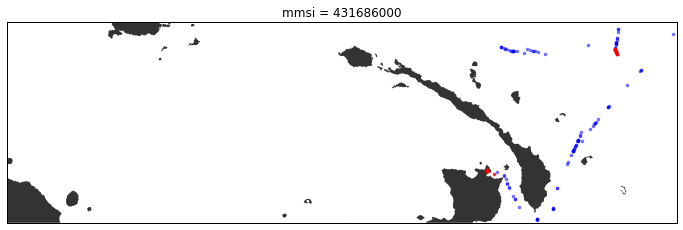

Waiting on bqjob_r349f662abe69fac7_000001545041977f_27 ... (0s) Current status: DONE   
Query time: 2.26037693024 seconds.


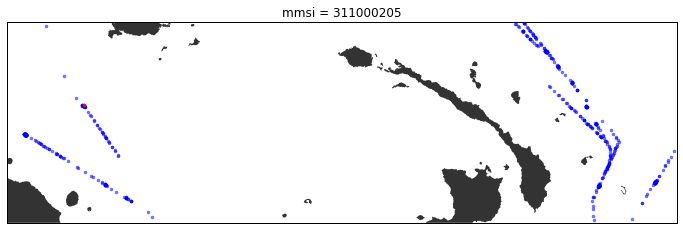

Waiting on bqjob_r61d9f98ba9325bae_000001545041aa52_28 ... (0s) Current status: DONE   
Query time: 2.02539181709 seconds.


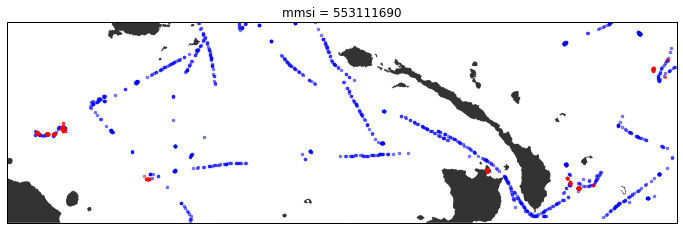

Waiting on bqjob_r48b797d42b597429_000001545041b9a9_29 ... (0s) Current status: DONE   
Query time: 1.98135209084 seconds.


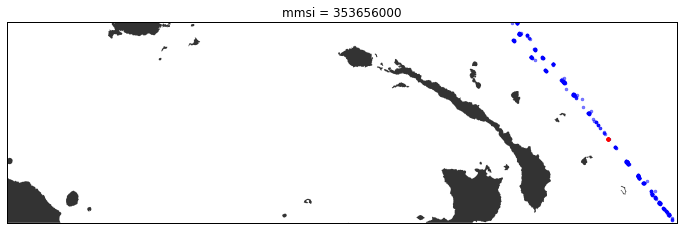

Waiting on bqjob_r59f253b7ef3f0357_000001545041c8d8_30 ... (0s) Current status: DONE   
Query time: 2.10888791084 seconds.


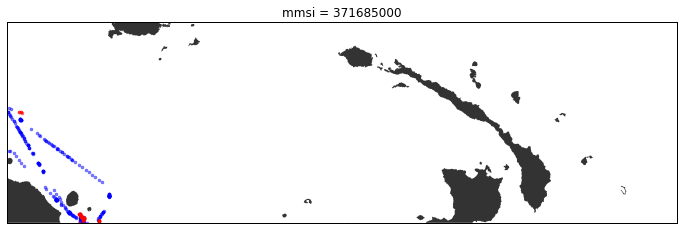

Waiting on bqjob_r41638297360d6c30_000001545041d879_31 ... (0s) Current status: DONE   
Query time: 1.69374895096 seconds.


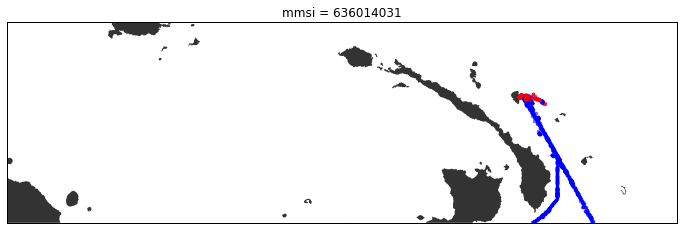

Waiting on bqjob_r754fae810df3d985_000001545041e69d_32 ... (0s) Current status: DONE   
Query time: 1.96400403976 seconds.


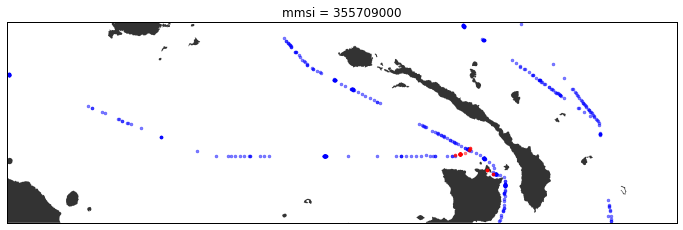

Waiting on bqjob_r71bcc295b6b107f0_000001545041f5bb_33 ... (0s) Current status: DONE   
Query time: 1.54815602303 seconds.


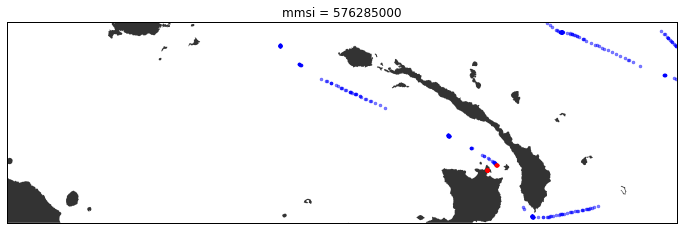

Waiting on bqjob_r4c35c2fd72b4072_0000015450420386_34 ... (0s) Current status: DONE   
Query time: 2.1469771862 seconds.


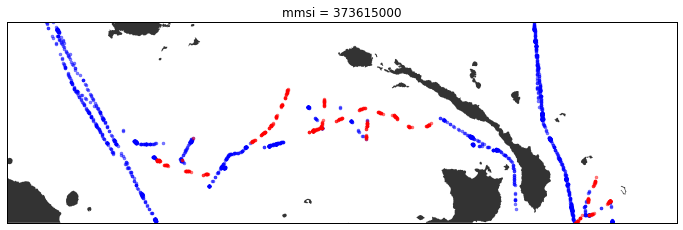

Waiting on bqjob_r2537a6137ac31743_0000015450421354_35 ... (0s) Current status: DONE   
Query time: 0.998203992844 seconds.


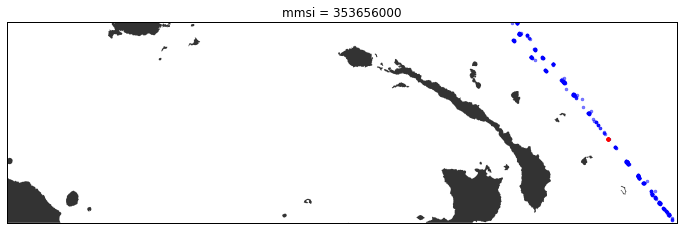

Waiting on bqjob_r44956ba1561a7485_0000015450421ea1_36 ... (0s) Current status: DONE   
Query time: 1.97738099098 seconds.


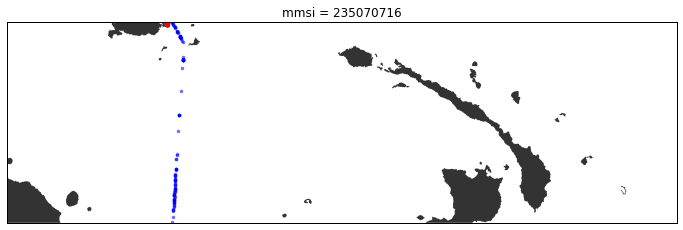

Waiting on bqjob_r56d63d267de509e7_0000015450422dc4_37 ... (0s) Current status: DONE   
Query time: 2.04462885857 seconds.


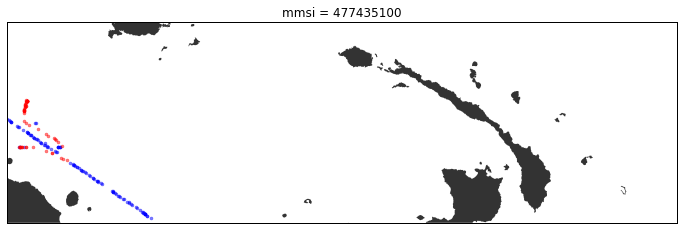

Waiting on bqjob_r71170e5a72002429_0000015450423d1d_38 ... (0s) Current status: DONE   
Query time: 1.28854990005 seconds.


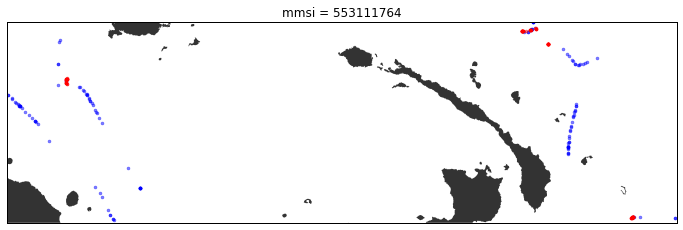

Waiting on bqjob_r56f01c8134157e24_00000154504249cf_39 ... (0s) Current status: DONE   
Query time: 2.22828102112 seconds.


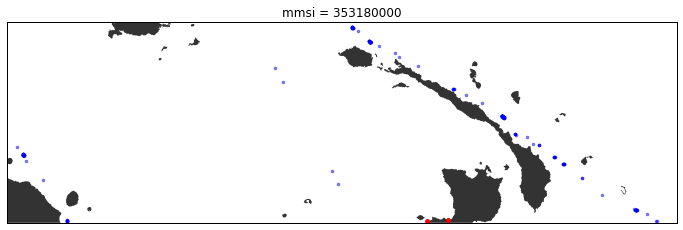

Waiting on bqjob_r213a54f74d838b35_0000015450425a44_40 ... (0s) Current status: DONE   
Query time: 2.03393483162 seconds.


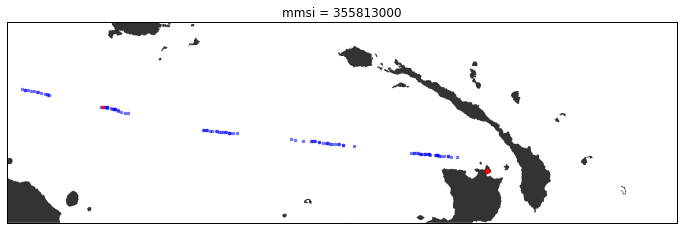

Waiting on bqjob_r19bdf5e46a1bba96_0000015450426a4d_41 ... (0s) Current status: DONE   
Query time: 2.22299480438 seconds.


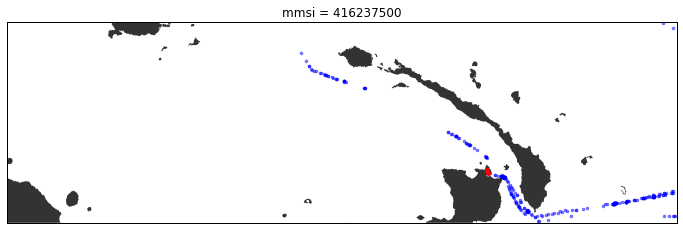

Waiting on bqjob_r27cf5b1bfeff56ed_0000015450427b05_42 ... (0s) Current status: DONE   
Query time: 2.17086601257 seconds.


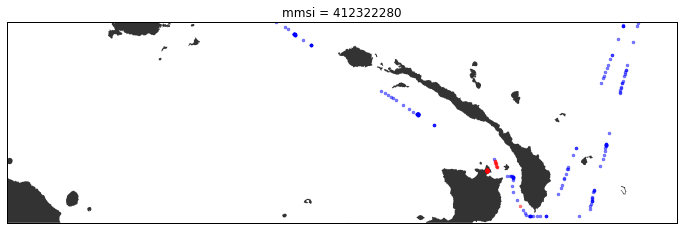

Waiting on bqjob_r30279ae9a6679552_0000015450428b2d_43 ... (0s) Current status: DONE   
Query time: 1.5160908699 seconds.


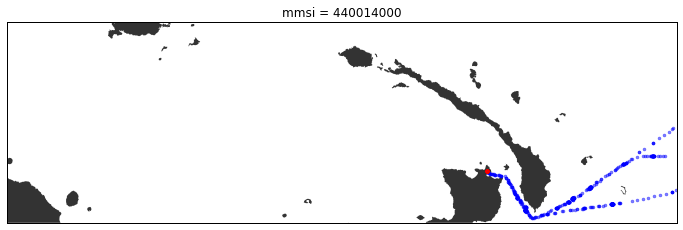

Waiting on bqjob_rd2c7dd894c5523a_000001545042992f_44 ... (0s) Current status: DONE   
Query time: 0.925652980804 seconds.


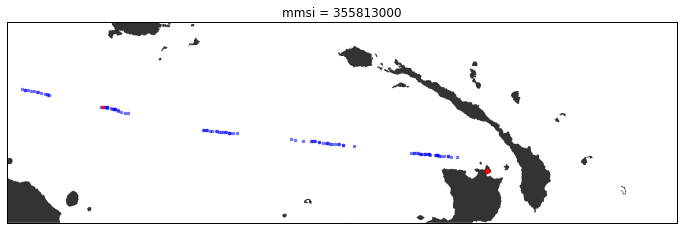

Waiting on bqjob_r39ed982d6bc009ad_000001545042a488_45 ... (0s) Current status: DONE   
Query time: 1.9969060421 seconds.


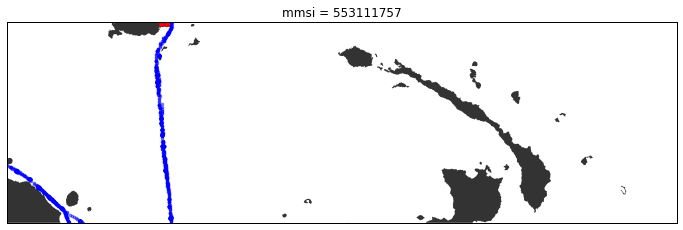

Waiting on bqjob_r41af7ef0ee6ee5c_000001545042b3c6_46 ... (0s) Current status: DONE   
Query time: 1.85555195808 seconds.


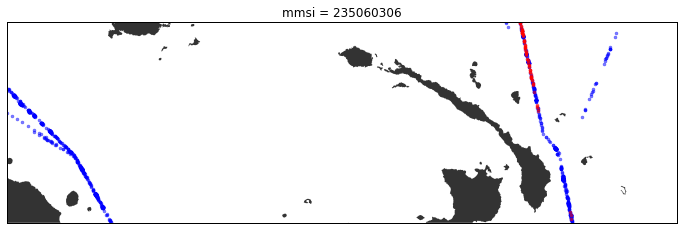

Waiting on bqjob_re2d38b45f427e9f_000001545042c272_47 ... (0s) Current status: DONE   
Query time: 3.6671359539 seconds.


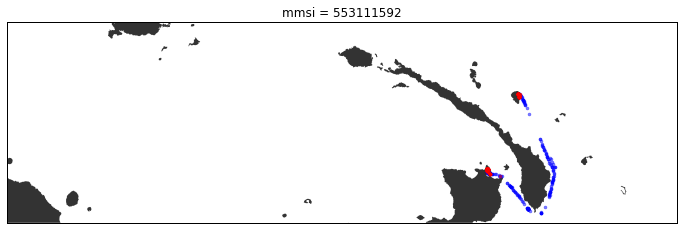

Waiting on bqjob_r4e690d591971f0e1_000001545042d860_48 ... (0s) Current status: DONE   
Query time: 2.14605712891 seconds.


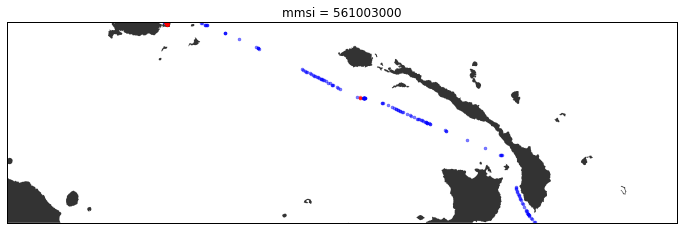

Waiting on bqjob_r4d00a38cfeece1f6_000001545042e841_49 ... (0s) Current status: DONE   
Query time: 2.02586698532 seconds.


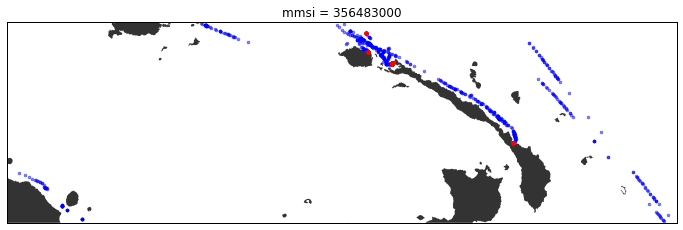

Waiting on bqjob_r72ef3332ff281fd7_000001545042f7b0_50 ... (0s) Current status: DONE   
Query time: 1.4975271225 seconds.


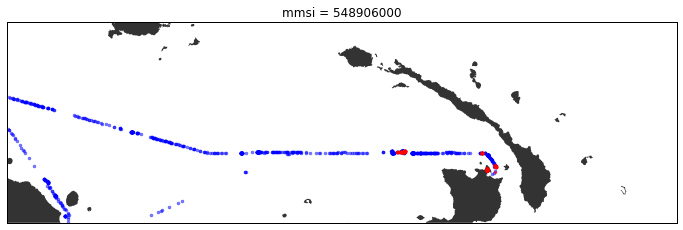

Waiting on bqjob_r4862cbfd4c4f8ac_00000154504304f4_51 ... (0s) Current status: DONE   
Query time: 2.39399981499 seconds.


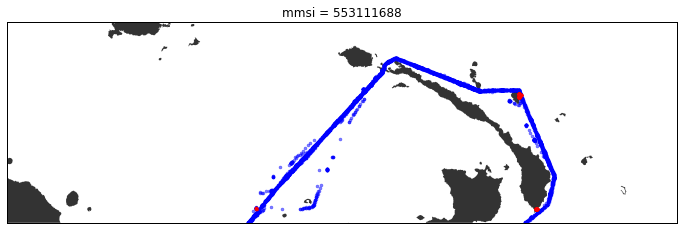

Waiting on bqjob_r4b1cd56ca9b52493_00000154504315c9_52 ... (0s) Current status: DONE   
Query time: 1.09475183487 seconds.


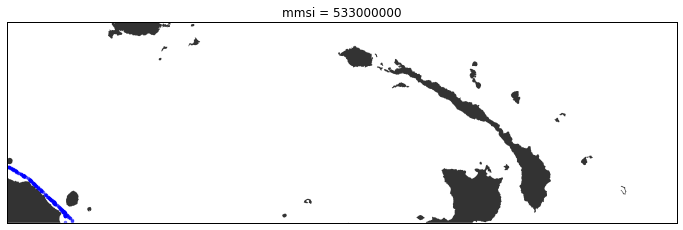

Waiting on bqjob_r75b7113ecdce5bc8_0000015450432167_53 ... (0s) Current status: DONE   
Query time: 1.98689198494 seconds.


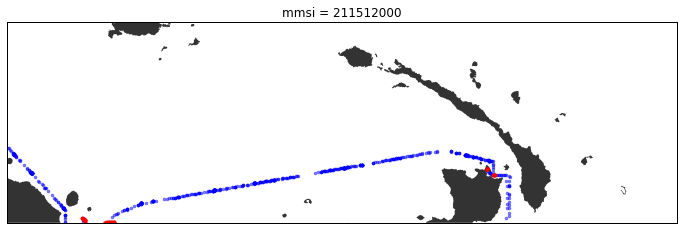

Waiting on bqjob_r251de7bd250237b5_00000154504330a6_54 ... (0s) Current status: DONE   
Query time: 1.99826192856 seconds.


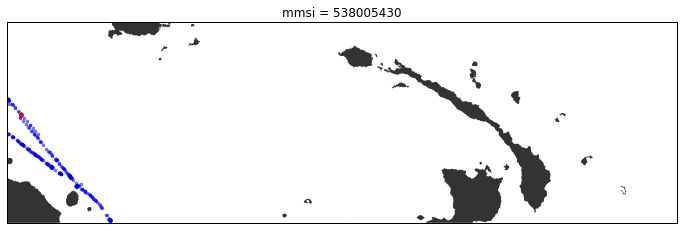

Waiting on bqjob_r11ab2c1343fd89bd_0000015450433fd4_55 ... (0s) Current status: DONE   
Query time: 2.07674980164 seconds.


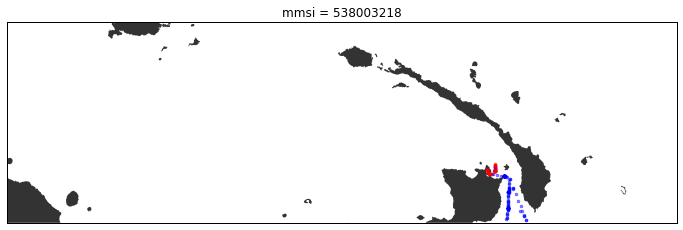

Waiting on bqjob_r4ddfcabc5195b00b_0000015450434fd2_56 ... (0s) Current status: DONE   
Query time: 2.54855298996 seconds.


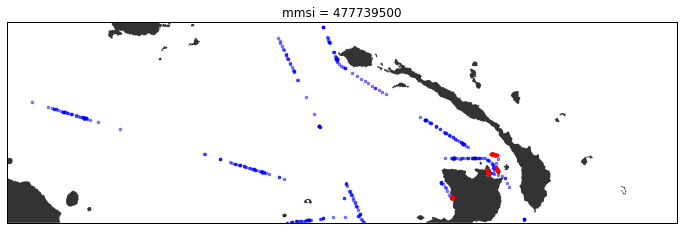

Waiting on bqjob_r2fe1d563db9876df_0000015450436190_57 ... (0s) Current status: DONE   
Query time: 1.83206701279 seconds.


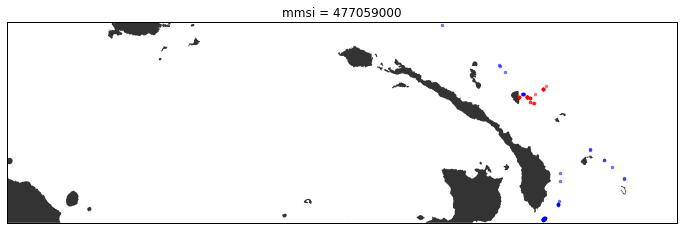

Waiting on bqjob_r7b245b249fda714d_00000154504370c8_58 ... (0s) Current status: DONE   
Query time: 2.41303992271 seconds.


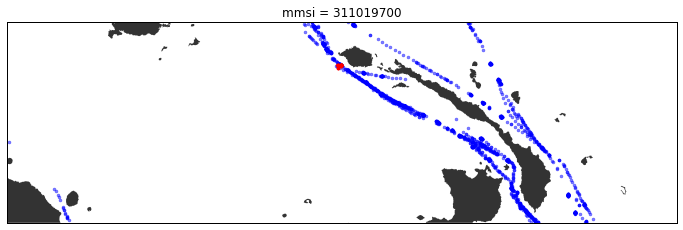

Waiting on bqjob_r3680be6859b692e8_0000015450438228_59 ... (0s) Current status: DONE   
Query time: 2.04367184639 seconds.


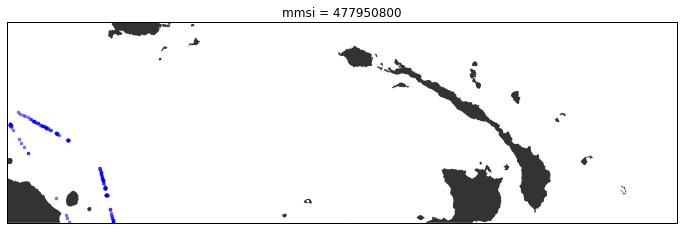

Waiting on bqjob_ra3ecf4271f50291_00000154504391ce_60 ... (0s) Current status: DONE   
Query time: 2.10034799576 seconds.


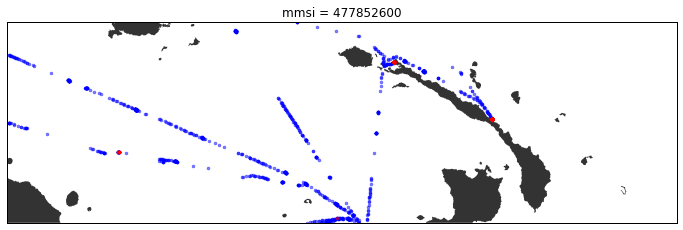

Waiting on bqjob_r3c8c5581e62a3770_000001545043a1e2_61 ... (0s) Current status: DONE   
Query time: 0.984661817551 seconds.


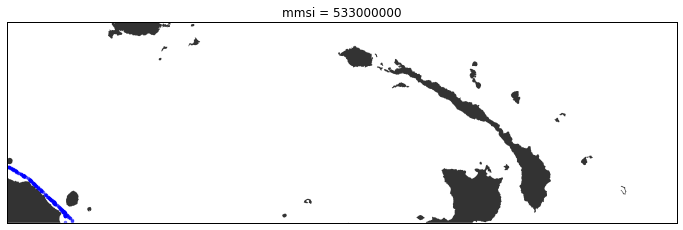

Waiting on bqjob_r3e53589dd11fc711_000001545043ad56_62 ... (0s) Current status: DONE   
Query time: 1.97142004967 seconds.


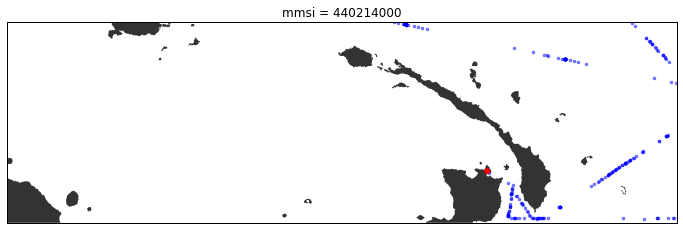

Waiting on bqjob_r4a88f809a5a6801d_000001545043bc7a_63 ... (0s) Current status: DONE   
Query time: 1.80767893791 seconds.


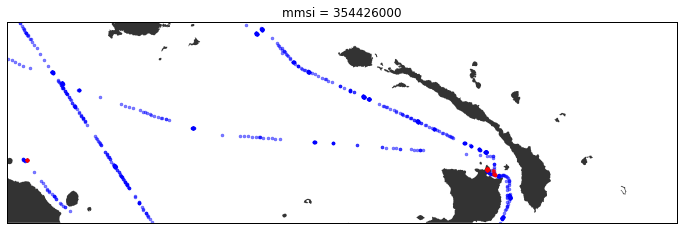

Waiting on bqjob_r749a1c191e77fc58_000001545043caea_64 ... (0s) Current status: DONE   
Query time: 1.160145998 seconds.


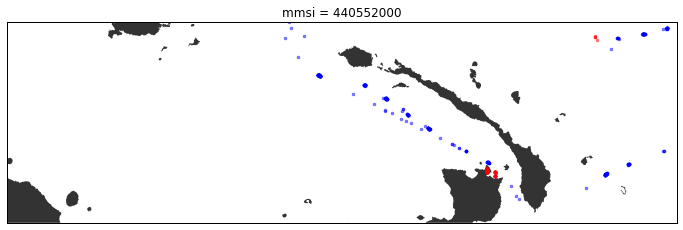

Waiting on bqjob_r76eae1e179bac17f_000001545043d71a_65 ... (0s) Current status: DONE   
Query time: 2.05467486382 seconds.


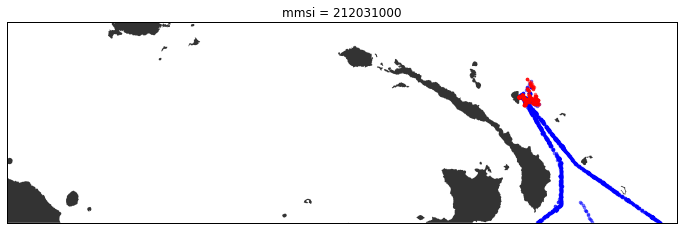

Waiting on bqjob_r2c8010a8a08a00d9_000001545043e70e_66 ... (0s) Current status: DONE   
Query time: 1.41546916962 seconds.


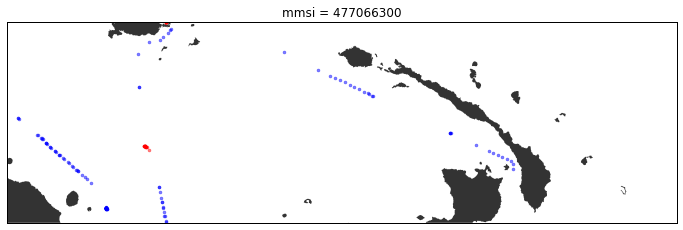

Waiting on bqjob_r581b66cd9d90a53b_000001545043f45f_67 ... (0s) Current status: DONE   
Query time: 2.42162013054 seconds.


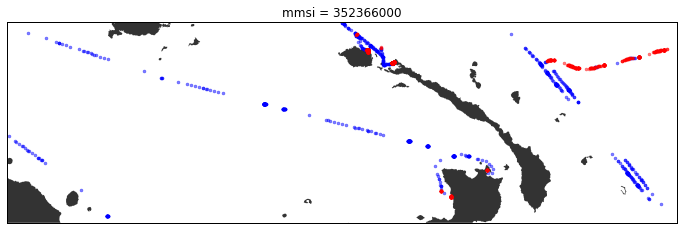

Waiting on bqjob_r79f33a6f9ba8c068_00000154504405e9_68 ... (0s) Current status: DONE   
Query time: 2.13705396652 seconds.


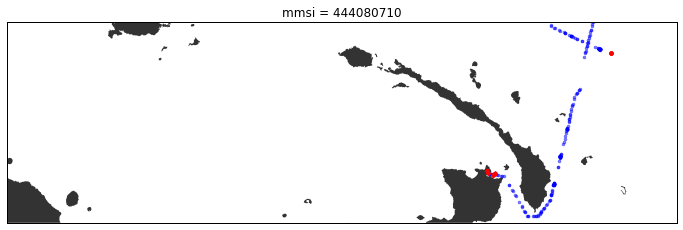

Waiting on bqjob_r7a7262376d5667cc_00000154504415d0_69 ... (0s) Current status: DONE   
Query time: 1.99169802666 seconds.


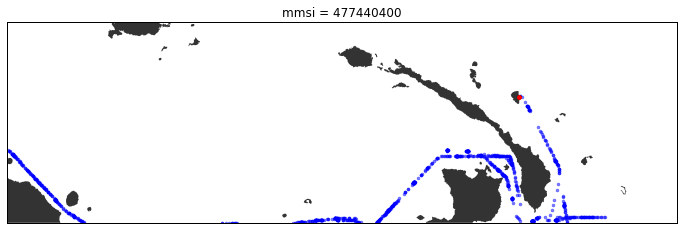

Waiting on bqjob_r2a639159de083869_00000154504424fa_70 ... (0s) Current status: DONE   
Query time: 1.98807311058 seconds.


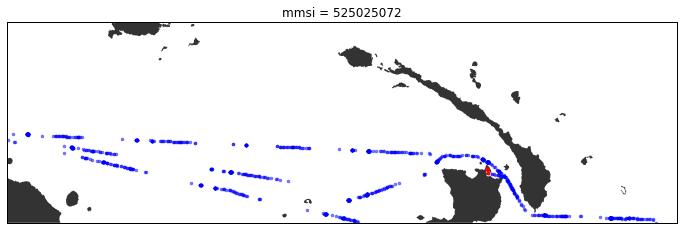

Waiting on bqjob_r1d3baae6be3e3ab9_0000015450443427_71 ... (0s) Current status: DONE   
Query time: 1.16690707207 seconds.


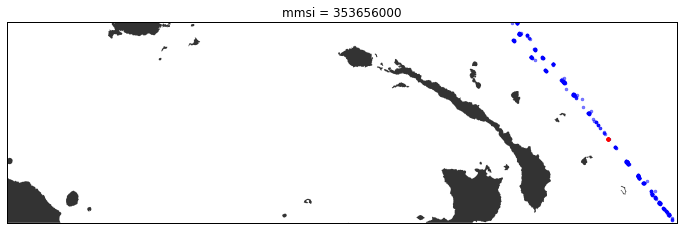

Waiting on bqjob_r393ec592e4b681ff_0000015450444033_72 ... (0s) Current status: DONE   
Query time: 2.30017399788 seconds.


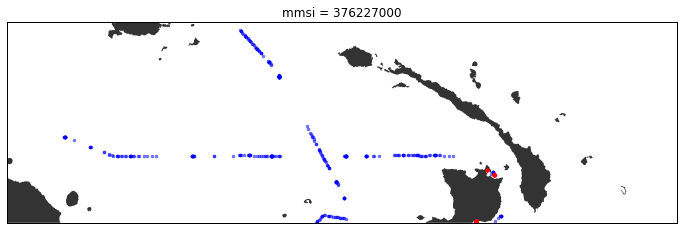

Waiting on bqjob_r4fd3438d284a2a0a_0000015450445086_73 ... (0s) Current status: DONE   
Query time: 1.49986791611 seconds.


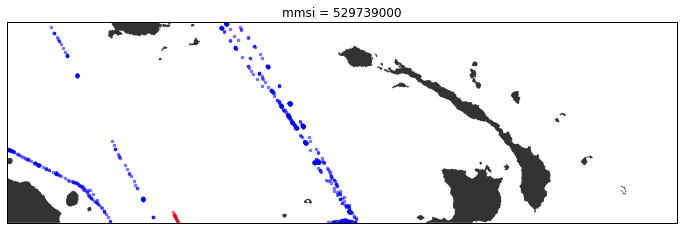

Waiting on bqjob_r2507f472b7dfbfdf_0000015450445e12_74 ... (0s) Current status: DONE   
Query time: 2.7084941864 seconds.


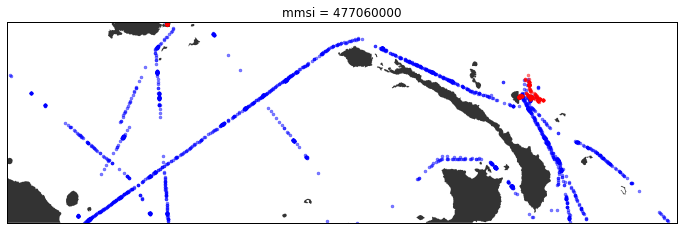

Waiting on bqjob_r7b60581f3d69919e_0000015450447018_75 ... (0s) Current status: DONE   
Query time: 2.32428193092 seconds.


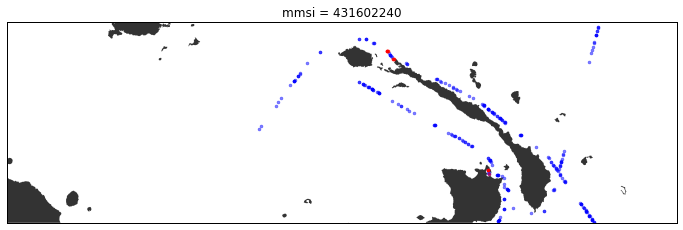

Waiting on bqjob_r4535c3da31bf5e65_000001545044817e_76 ... (0s) Current status: DONE   
Query time: 1.68604207039 seconds.


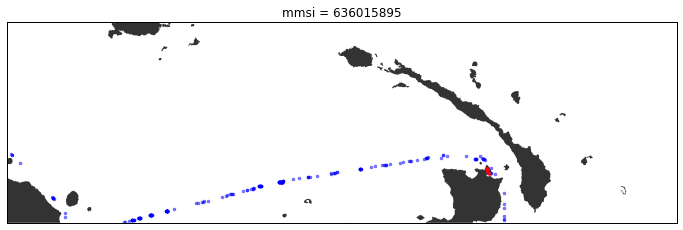

Waiting on bqjob_r3927cacc7cd44231_0000015450449042_77 ... (0s) Current status: DONE   
Query time: 1.96426200867 seconds.


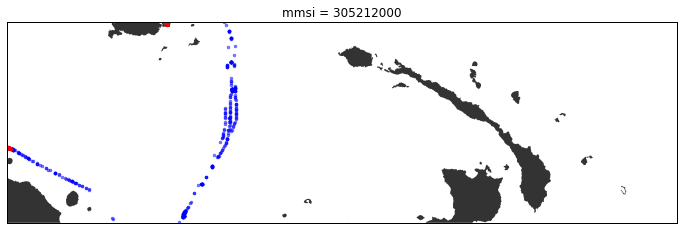

Waiting on bqjob_r2dbe284b1069aa31_0000015450449ffe_78 ... (0s) Current status: DONE   
Query time: 2.17317795753 seconds.


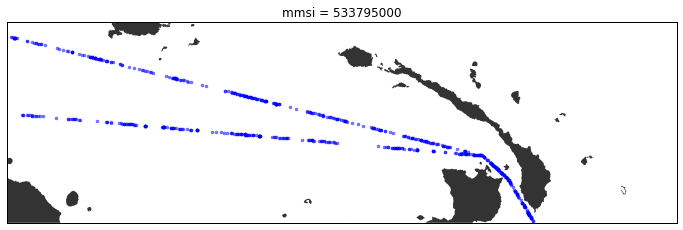

Waiting on bqjob_r74f8e19003785946_000001545044b069_79 ... (0s) Current status: DONE   
Query time: 2.36827683449 seconds.


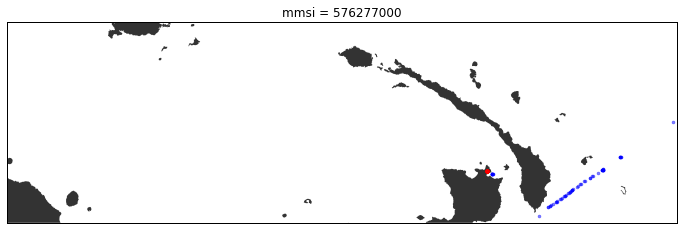

Waiting on bqjob_r7f40e590ca3fbf7c_000001545044c12f_80 ... (0s) Current status: DONE   
Query time: 1.8974609375 seconds.


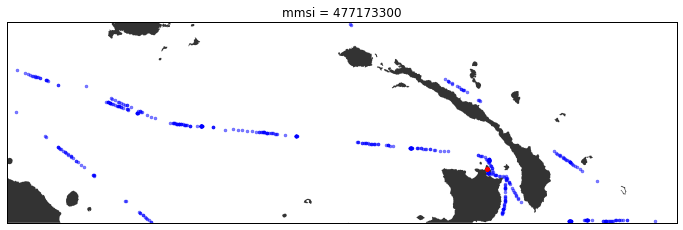

Waiting on bqjob_r974daadc97203f1_000001545044d07d_81 ... (0s) Current status: DONE   
Query time: 1.81921696663 seconds.


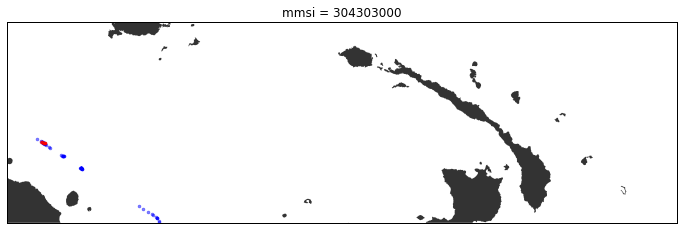

Waiting on bqjob_r72978fa037b17d1a_000001545044df83_82 ... (0s) Current status: DONE   
Query time: 1.88709592819 seconds.


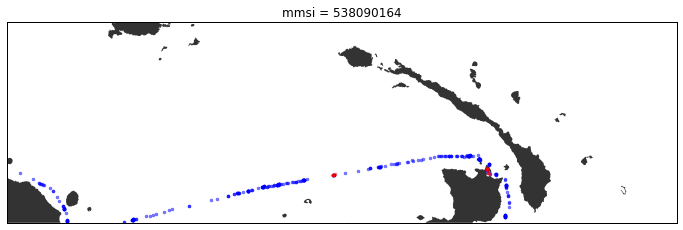

Waiting on bqjob_r1fe8441306bf7310_000001545044eeb7_83 ... (0s) Current status: DONE   
Query time: 1.96363401413 seconds.


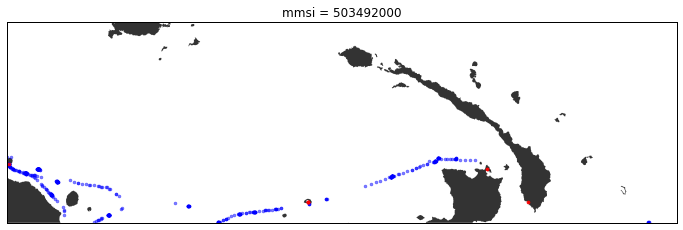

Waiting on bqjob_r4af43e98fdbb4746_000001545044fe49_84 ... (0s) Current status: DONE   
Query time: 2.01266312599 seconds.


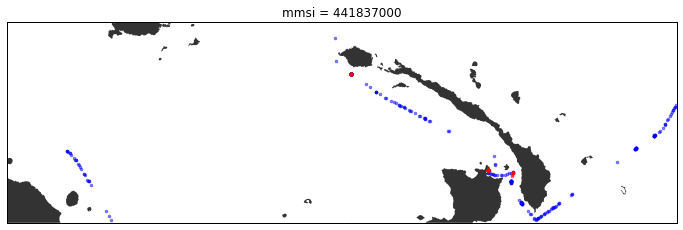

Waiting on bqjob_r2f40dea420c972a1_0000015450450e21_85 ... (0s) Current status: DONE   
Query time: 2.23361611366 seconds.


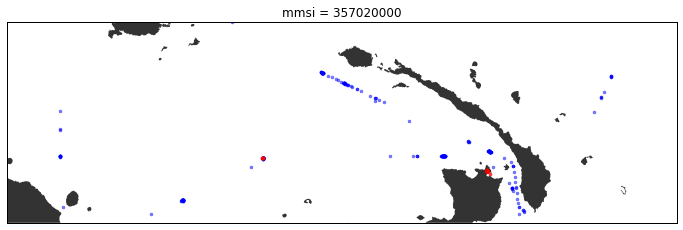

Waiting on bqjob_r185f344c055dee95_0000015450451e86_86 ... (0s) Current status: DONE   
Query time: 2.09778094292 seconds.


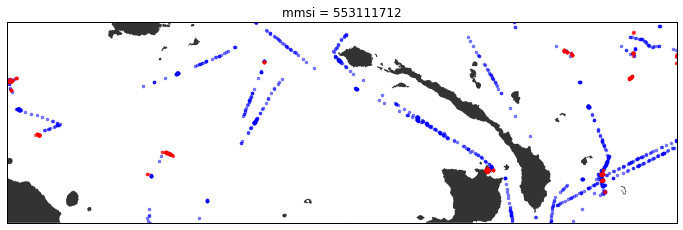

Waiting on bqjob_r563e4df86190dd90_0000015450452ea6_87 ... (0s) Current status: DONE   
Query time: 0.995734930038 seconds.


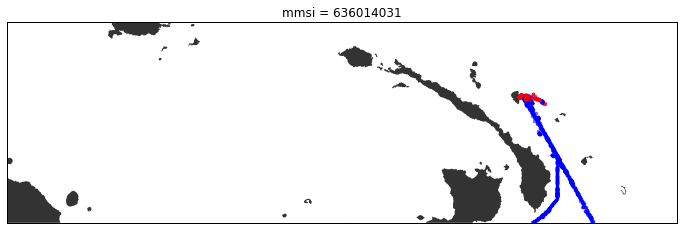

Waiting on bqjob_r716edce528cd7cc9_0000015450453a8a_88 ... (0s) Current status: DONE   
Query time: 2.75641107559 seconds.


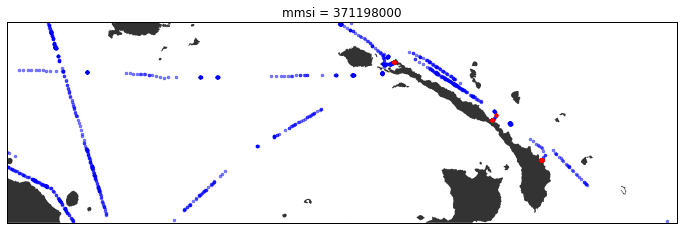

Waiting on bqjob_r65b779da4c33a2d7_0000015450454d88_89 ... (0s) Current status: DONE   
Query time: 1.30846810341 seconds.


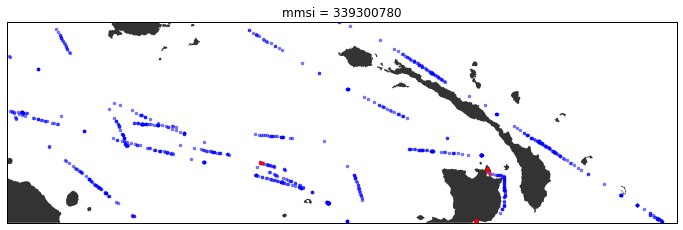

Waiting on bqjob_r26a98682bef590c_0000015450455a87_90 ... (0s) Current status: DONE   
Query time: 1.87306308746 seconds.


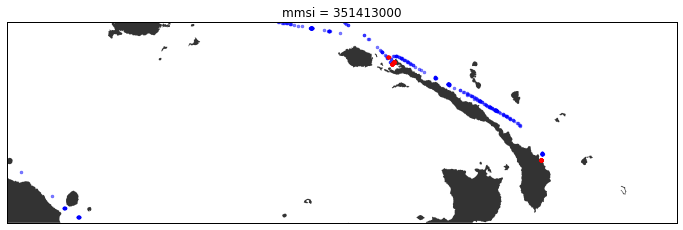

Waiting on bqjob_r3dcd80ac00beed6_0000015450456989_91 ... (0s) Current status: DONE   
Query time: 2.1264090538 seconds.


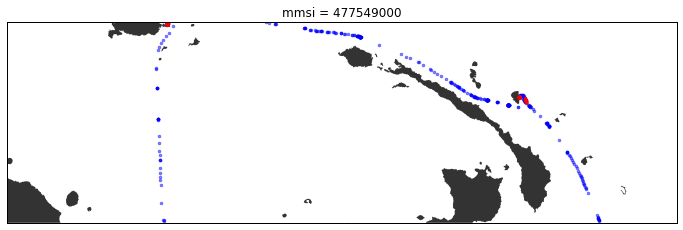

Waiting on bqjob_r266256c227414983_0000015450457a03_92 ... (0s) Current status: DONE   
Query time: 1.12416505814 seconds.


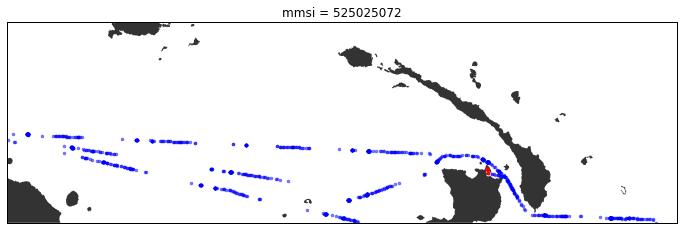

Waiting on bqjob_r2673f79257746dd1_000001545045867b_93 ... (0s) Current status: DONE   
Query time: 2.46482396126 seconds.


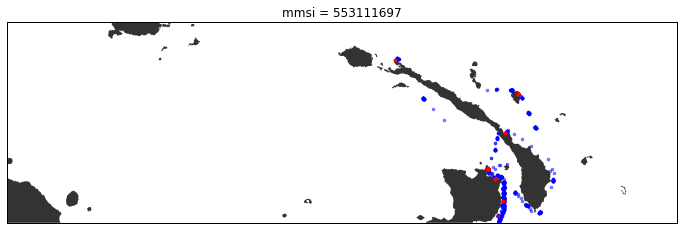

Waiting on bqjob_r5e99980ca1a643db_00000154504597a3_94 ... (0s) Current status: DONE   
Query time: 3.91939783096 seconds.


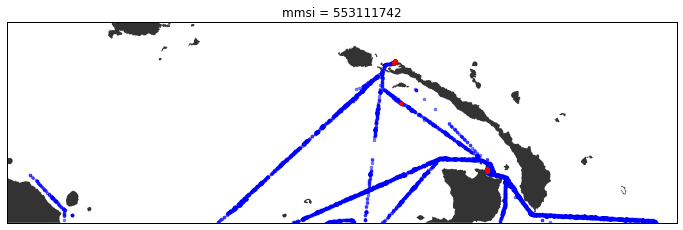

Waiting on bqjob_r5a11f770032f9125_000001545045af14_95 ... (0s) Current status: DONE   
Query time: 2.30131196976 seconds.


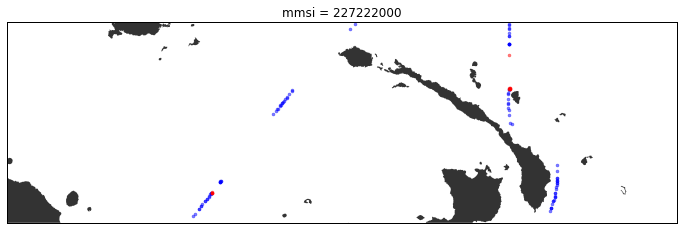

Waiting on bqjob_r5bfed5fba824521f_000001545045bfd3_96 ... (0s) Current status: DONE   
Query time: 2.12499308586 seconds.


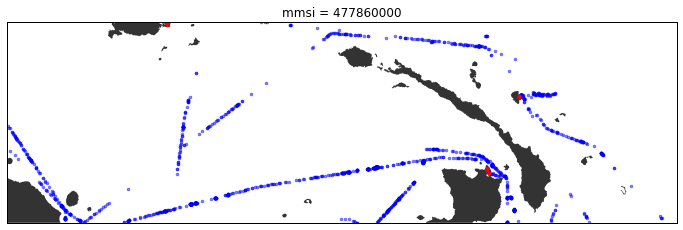

Waiting on bqjob_r5d92e2d962c2e9fe_000001545045cfe3_97 ... (0s) Current status: DONE   
Query time: 3.16112995148 seconds.


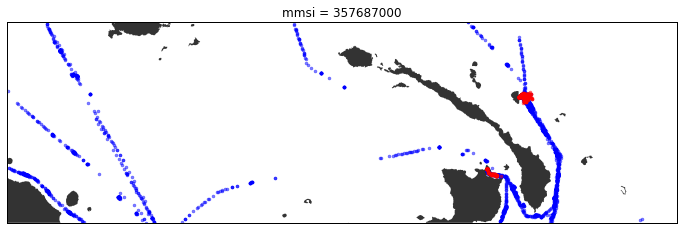

Waiting on bqjob_r3a9112488ebcfd4e_000001545045e3ec_98 ... (0s) Current status: DONE   
Query time: 0.979717969894 seconds.


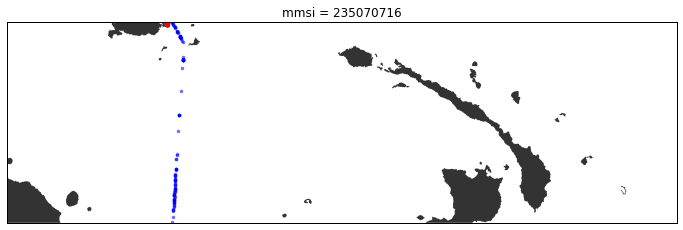

Waiting on bqjob_rc31b06222288ea9_000001545045ef72_99 ... (0s) Current status: DONE   
Query time: 1.94447803497 seconds.


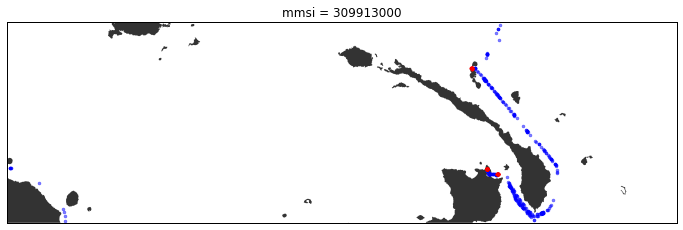

Waiting on bqjob_r5f47d58e525b4303_000001545045fef1_100 ... (0s) Current status: DONE   
Query time: 2.08387899399 seconds.


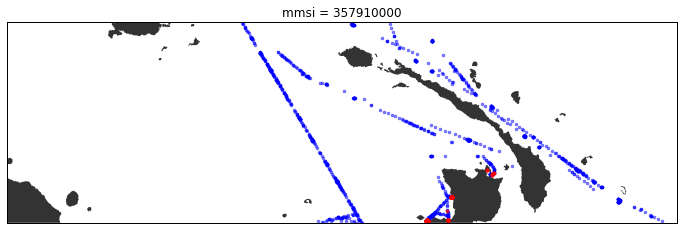

Waiting on bqjob_r3d15d1a06a49acc7_0000015450460eb8_101 ... (0s) Current status: DONE   
Query time: 2.0119740963 seconds.


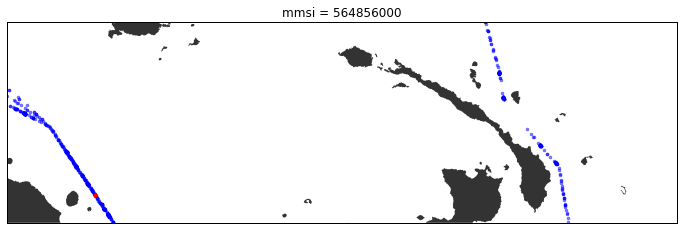

Waiting on bqjob_r2e6a95d9eeaf7c6c_0000015450461e28_102 ... (0s) Current status: DONE   
Query time: 2.17758083344 seconds.


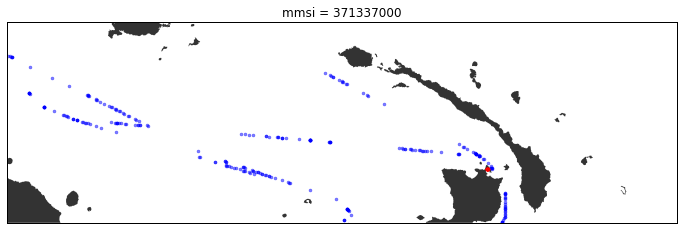

Waiting on bqjob_r3af43586f1c3de88_0000015450462e4a_103 ... (0s) Current status: DONE   
Query time: 1.9139289856 seconds.


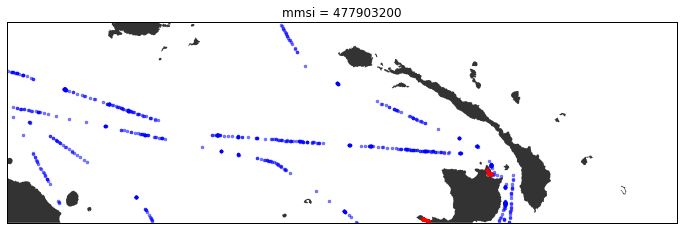

Waiting on bqjob_r4d145a67a9728f9_0000015450463df4_104 ... (0s) Current status: DONE   
Query time: 2.18102002144 seconds.


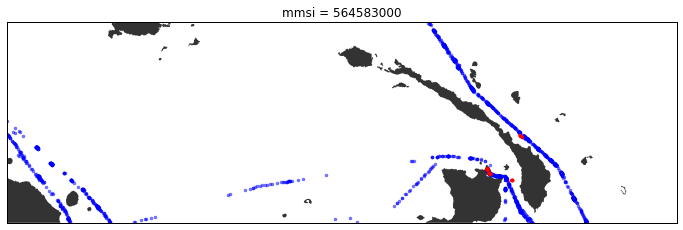

Waiting on bqjob_r7e3eb8b4c462187f_0000015450464e4a_105 ... (0s) Current status: DONE   
Query time: 1.88185095787 seconds.


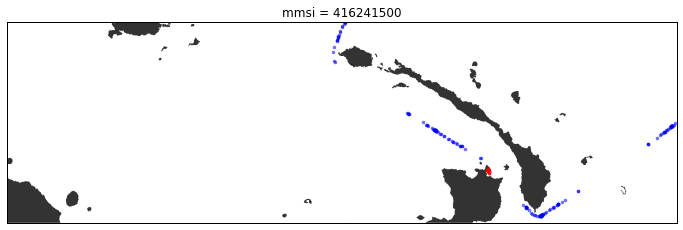

Waiting on bqjob_r33ae58564d1c844f_0000015450465dce_106 ... (0s) Current status: DONE   
Query time: 2.02506422997 seconds.


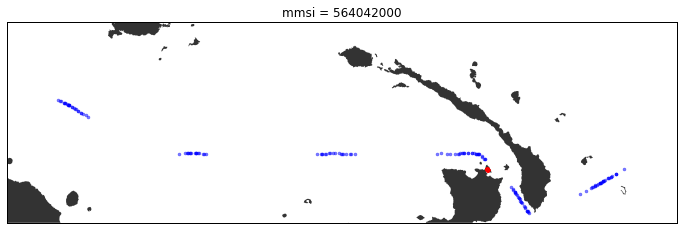

Waiting on bqjob_r52de49af80af6815_0000015450466db3_107 ... (0s) Current status: DONE   
Query time: 0.909520864487 seconds.


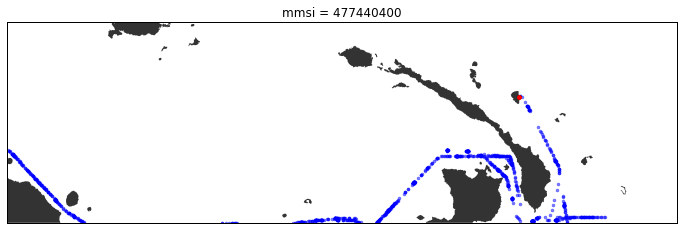

Waiting on bqjob_r3d0e4d5069fcd192_000001545046793d_108 ... (0s) Current status: DONE   
Query time: 1.79005885124 seconds.


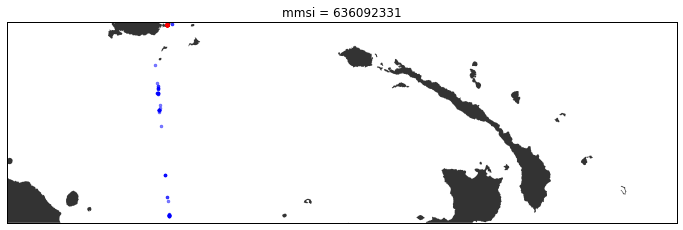

Waiting on bqjob_r4605e952076575a6_0000015450468796_109 ... (0s) Current status: DONE   
Query time: 1.18546509743 seconds.


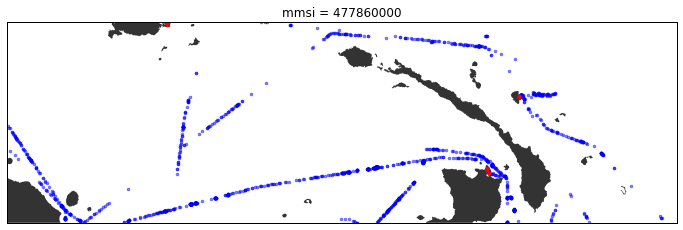

Waiting on bqjob_r1c7d57c21d0214f7_0000015450469422_110 ... (0s) Current status: DONE   
Query time: 2.15959191322 seconds.


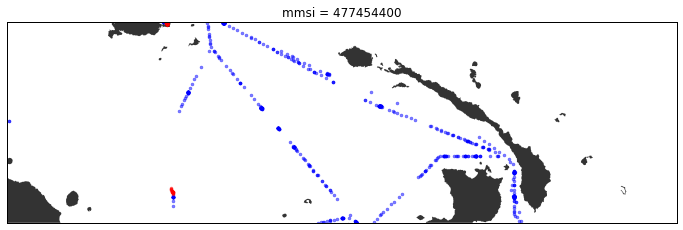

Waiting on bqjob_r7f07cb34def33c3d_000001545046a43b_111 ... (0s) Current status: DONE   
Query time: 2.0912539959 seconds.


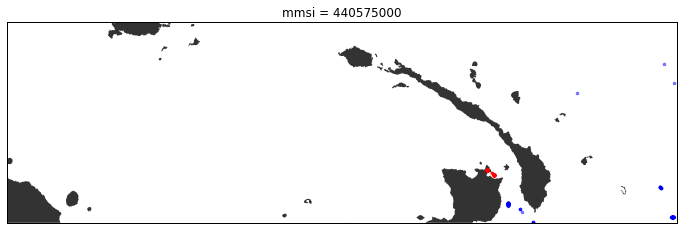

Waiting on bqjob_r712468fe77b35284_000001545046b403_112 ... (0s) Current status: DONE   
Query time: 2.21732091904 seconds.


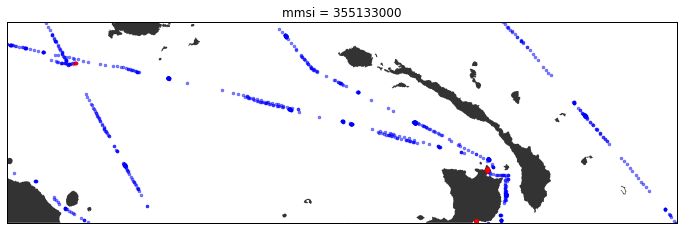

Waiting on bqjob_r243cddda2ef3e18d_000001545046c46c_113 ... (0s) Current status: DONE   
Query time: 1.20349216461 seconds.


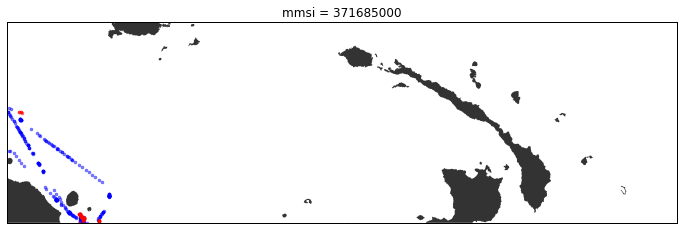

Waiting on bqjob_r347d9cf82ae1763e_000001545046d0e6_114 ... (0s) Current status: DONE   
Query time: 0.789069890976 seconds.


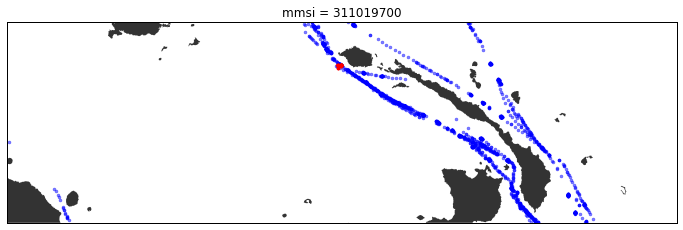

Waiting on bqjob_r7de882c9c60f3615_000001545046dba4_115 ... (0s) Current status: DONE   
Query time: 1.97636318207 seconds.


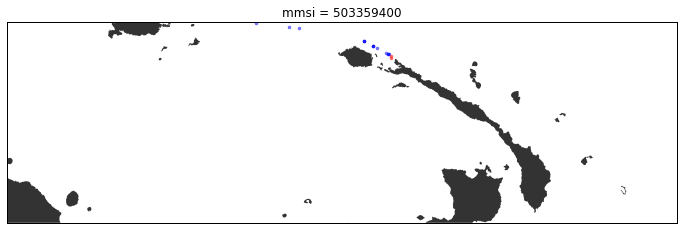

Waiting on bqjob_r4d9afa9591c80dd8_000001545046eaf6_116 ... (0s) Current status: DONE   
Query time: 2.89440798759 seconds.


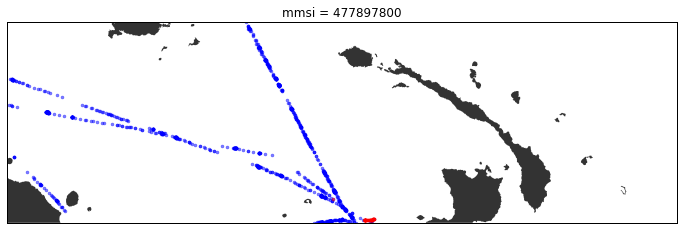

Waiting on bqjob_r673bc60397449bf2_000001545046fdbf_117 ... (0s) Current status: DONE   
Query time: 2.09632396698 seconds.


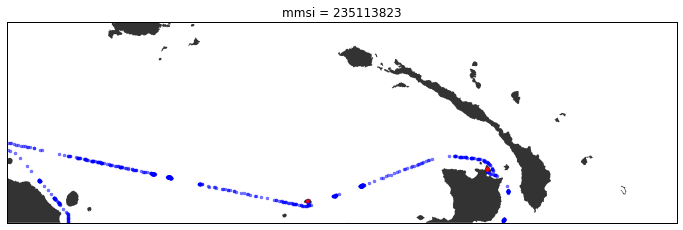

Waiting on bqjob_r643922af597481aa_0000015450470d50_118 ... (0s) Current status: DONE   
Query time: 2.19749212265 seconds.


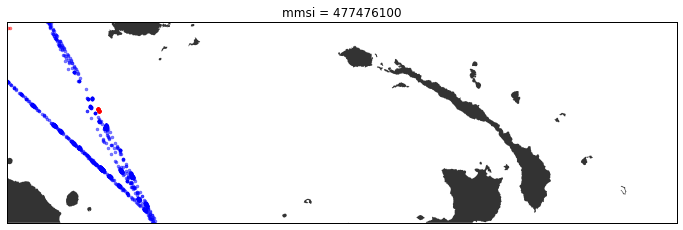

Waiting on bqjob_r748c08807eb2b414_0000015450471d7c_119 ... (0s) Current status: DONE   
Query time: 1.93545198441 seconds.


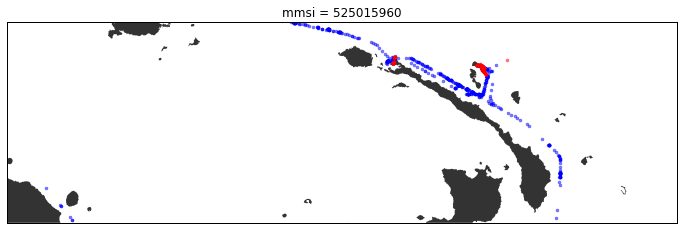

Waiting on bqjob_r58fe77427a8cb2a6_0000015450472caf_120 ... (0s) Current status: DONE   
Query time: 2.06324505806 seconds.


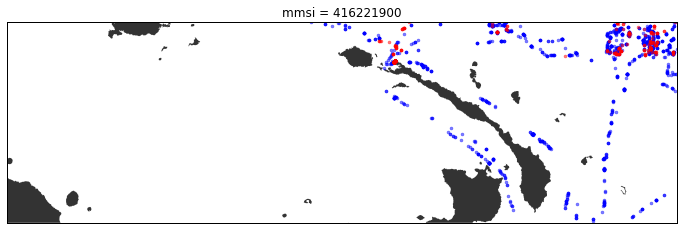

Waiting on bqjob_r214466a8c5f493f8_0000015450473cb8_121 ... (0s) Current status: DONE   
Query time: 1.22047591209 seconds.


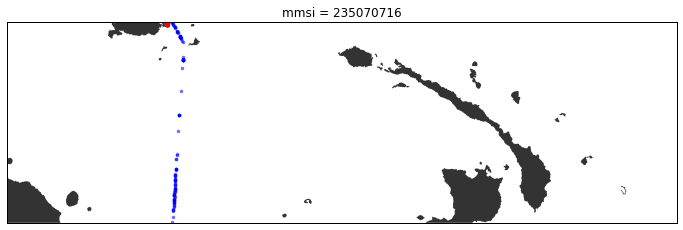

Waiting on bqjob_r260c96be9055d287_0000015450474995_122 ... (0s) Current status: DONE   
Query time: 2.20264816284 seconds.


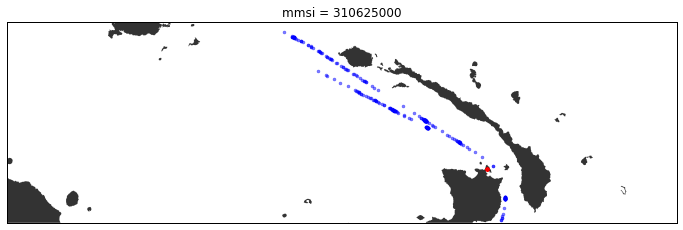

Waiting on bqjob_r77d2c3bdf27cfd67_00000154504759dd_123 ... (0s) Current status: DONE   
Query time: 2.33819317818 seconds.


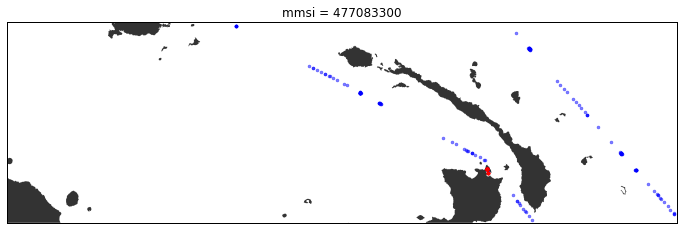

Waiting on bqjob_r6969f51d834d67ef_0000015450476ada_124 ... (0s) Current status: DONE   
Query time: 3.85074901581 seconds.


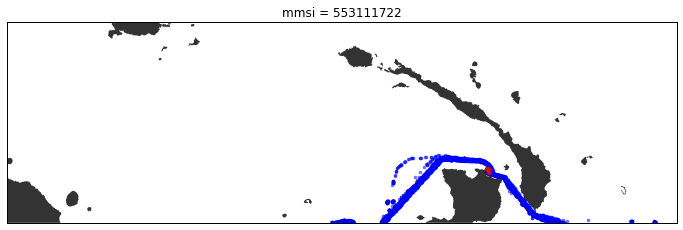

Waiting on bqjob_r1a1ffc6d99f60308_0000015450478215_125 ... (0s) Current status: DONE   
Query time: 1.10476589203 seconds.


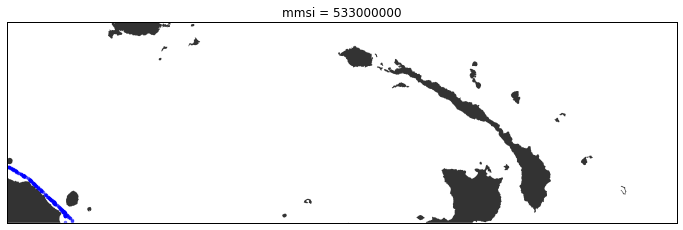

Waiting on bqjob_r113ae924f9f693e0_0000015450478e10_126 ... (0s) Current status: DONE   
Query time: 2.39257693291 seconds.


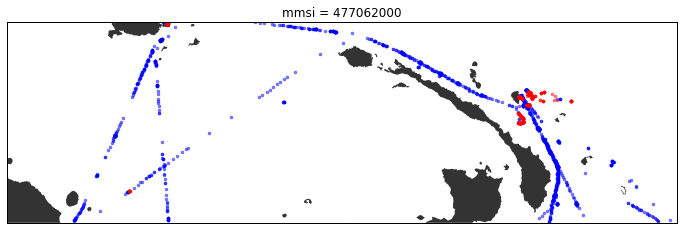

Waiting on bqjob_r6d871ef42100b5b4_0000015450479fa0_127 ... (0s) Current status: DONE   
Query time: 1.84293103218 seconds.


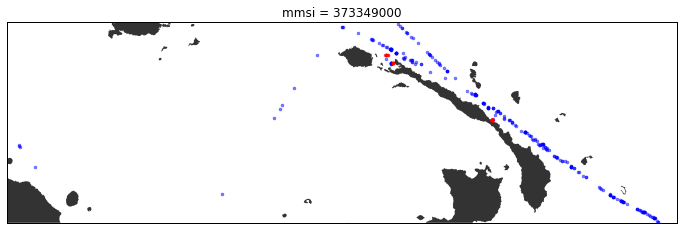

Waiting on bqjob_r58a336aa11110aad_000001545047ae6f_128 ... (0s) Current status: DONE   
Query time: 0.762267112732 seconds.


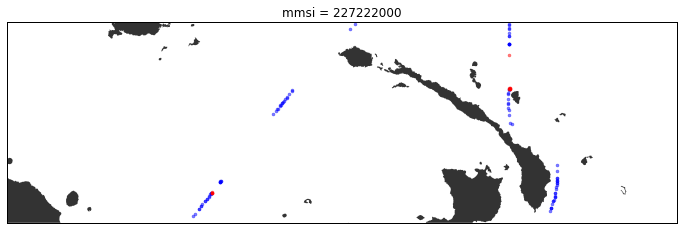

Waiting on bqjob_r27b8fc00f29b82cf_000001545047b94c_129 ... (0s) Current status: DONE   
Query time: 1.41093587875 seconds.


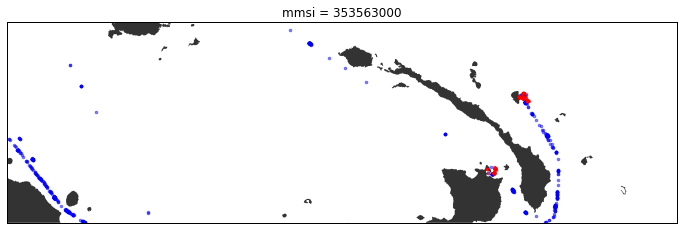

Waiting on bqjob_r42d6fa8da85c1ce0_000001545047c749_130 ... (0s) Current status: DONE   
Query time: 1.78606987 seconds.


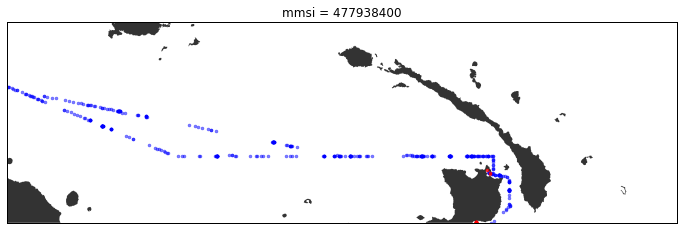

Waiting on bqjob_r5dca62a6a4f515c2_000001545047d684_131 ... (0s) Current status: DONE   
Query time: 1.86978387833 seconds.


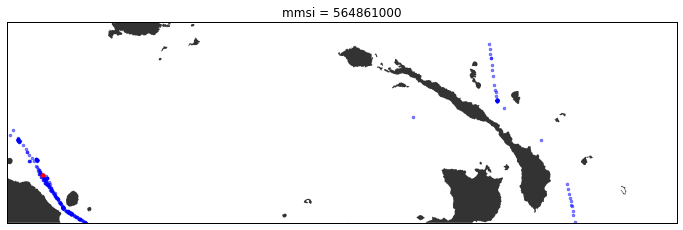

Waiting on bqjob_r2b7b9d0798a47edb_000001545047e5ac_132 ... (0s) Current status: DONE   
Query time: 2.41455483437 seconds.


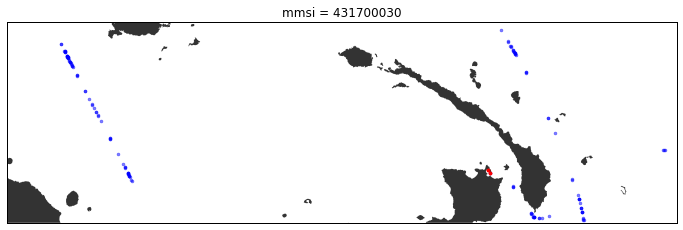

Waiting on bqjob_r4bf2fd19050e269b_000001545047f6b0_133 ... (0s) Current status: DONE   
Query time: 1.29966688156 seconds.


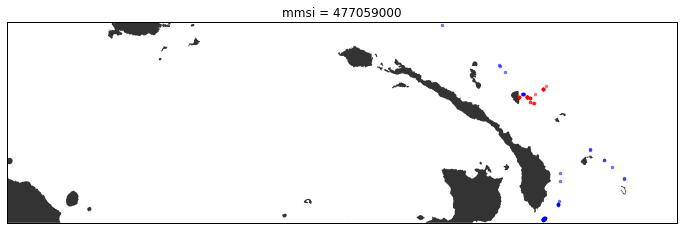

Waiting on bqjob_r10577910e2cccd25_000001545048032b_134 ... (0s) Current status: DONE   
Query time: 1.39956188202 seconds.


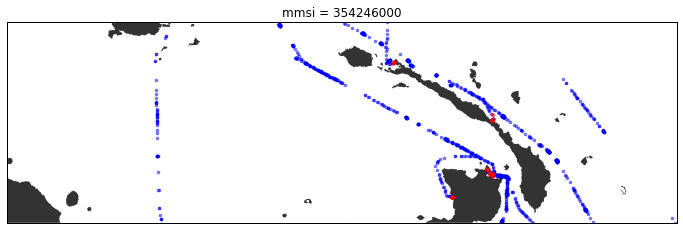

Waiting on bqjob_r71b834c32802bc16_000001545048103a_135 ... (0s) Current status: DONE   
Query time: 2.75488996506 seconds.


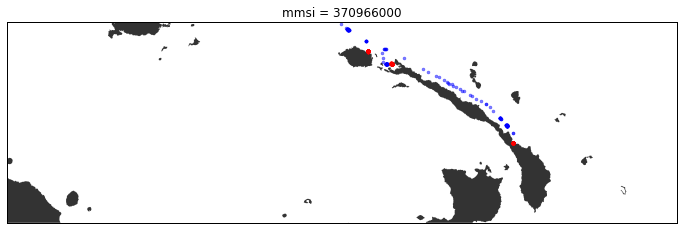

Waiting on bqjob_r2190b418c1913c8b_0000015450482293_136 ... (0s) Current status: DONE   
Query time: 1.39813089371 seconds.


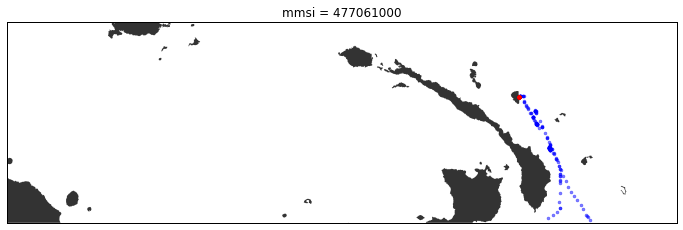

Waiting on bqjob_r14c36aee7d89bc1d_0000015450482f69_137 ... (0s) Current status: DONE   
Query time: 2.75840210915 seconds.


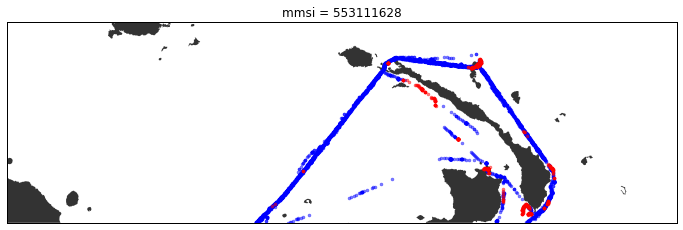

Waiting on bqjob_r79836a567e912df5_000001545048423b_138 ... (0s) Current status: DONE   
Query time: 2.21992015839 seconds.


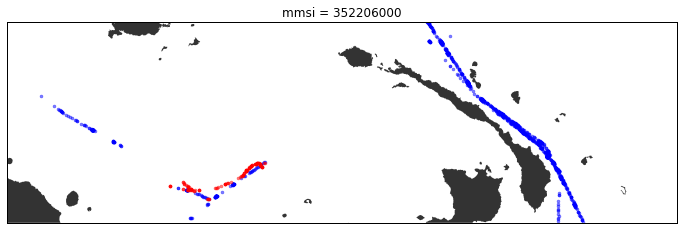

Waiting on bqjob_r1c553ed7642b4df_000001545048526c_139 ... (0s) Current status: DONE   
Query time: 2.87920618057 seconds.


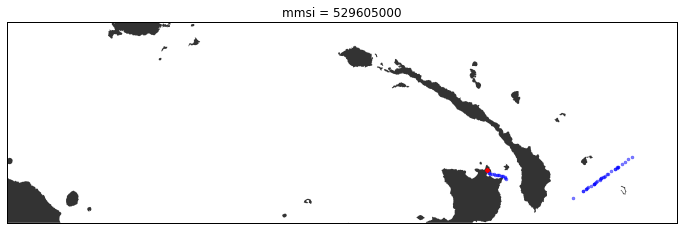

Waiting on bqjob_r1575e709f50447a_000001545048654f_140 ... (0s) Current status: DONE   
Query time: 2.00483798981 seconds.


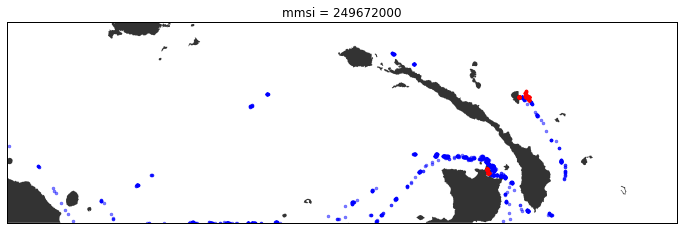

Waiting on bqjob_r29e32a85b920e4eb_00000154504874a6_141 ... (0s) Current status: DONE   
Query time: 3.39436197281 seconds.


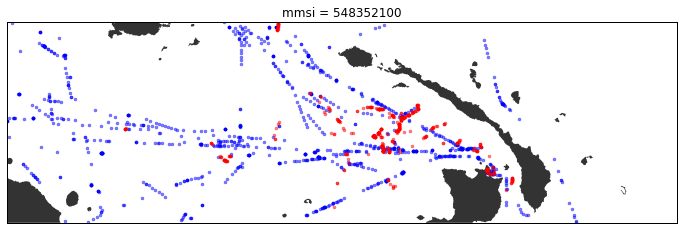

Waiting on bqjob_r5684092555b679aa_0000015450488980_142 ... (0s) Current status: DONE   
Query time: 1.92986011505 seconds.


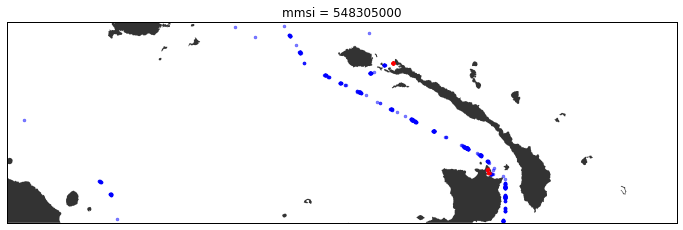

Waiting on bqjob_r7536272a11a71025_000001545048989c_143 ... (0s) Current status: DONE   
Query time: 1.43366479874 seconds.


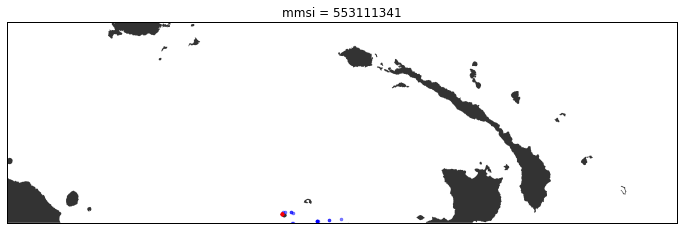

Waiting on bqjob_r78a6ff27007332a0_000001545048a59c_144 ... (0s) Current status: DONE   
Query time: 2.33930301666 seconds.


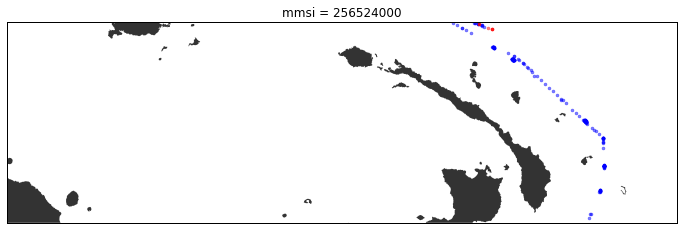

Waiting on bqjob_r4f075a80616767e6_000001545048b63a_145 ... (0s) Current status: DONE   
Query time: 1.49049520493 seconds.


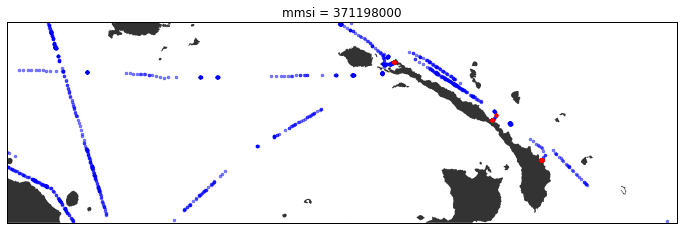

Waiting on bqjob_r73db0b7a771d25c0_000001545048c379_146 ... (0s) Current status: DONE   
Query time: 1.16663789749 seconds.


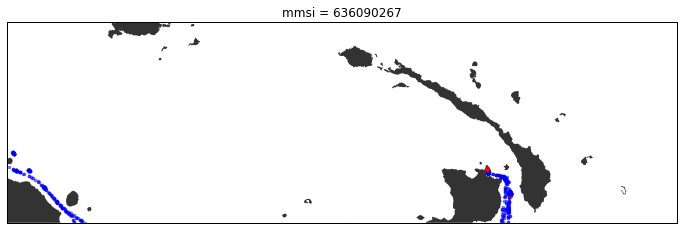

Waiting on bqjob_r4aa9105911eec4fe_000001545048cf95_147 ... (0s) Current status: DONE   
Query time: 2.23585295677 seconds.


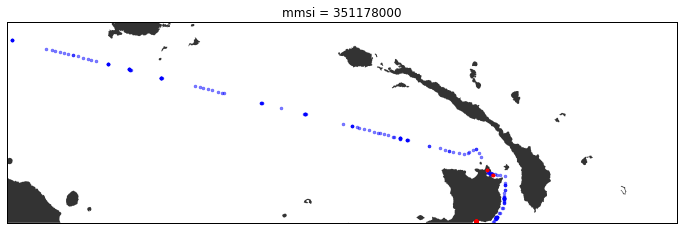

Waiting on bqjob_rc38bedb10386d43_000001545048dfbb_148 ... (0s) Current status: DONE   
Query time: 1.39376497269 seconds.


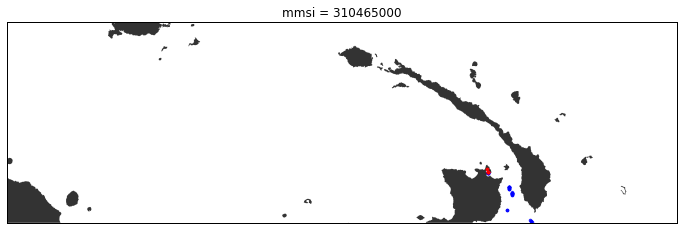

Waiting on bqjob_r5494299507b8f917_000001545048ec97_149 ... (0s) Current status: DONE   
Query time: 1.30732607841 seconds.


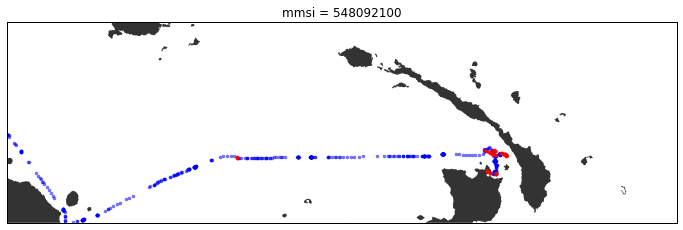

Waiting on bqjob_r5d5f34230b22c6d2_000001545048f92b_150 ... (0s) Current status: DONE   
Query time: 1.16161704063 seconds.


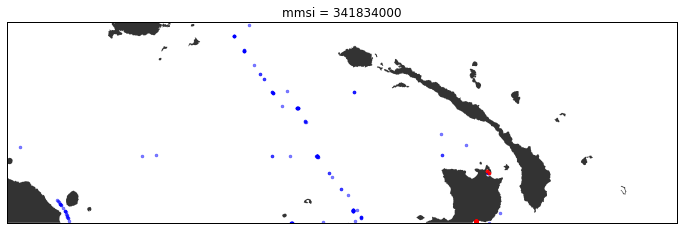

Waiting on bqjob_r4e108400460f1a6c_000001545049052d_151 ... (0s) Current status: DONE   
Query time: 1.23702216148 seconds.


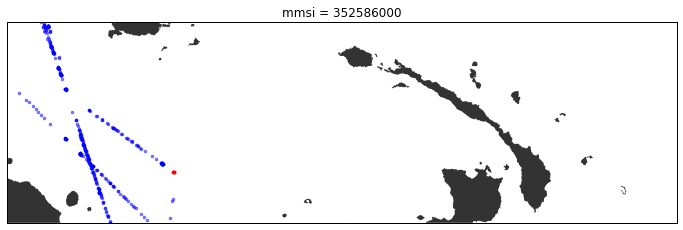

Waiting on bqjob_r2b5255538ba2840_00000154504911ac_152 ... (0s) Current status: DONE   
Query time: 1.21797394753 seconds.


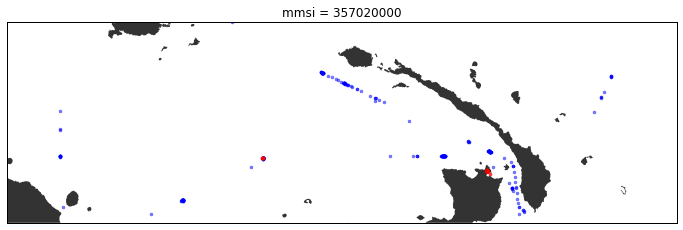

Waiting on bqjob_r791f4089c5a8be23_0000015450491dd5_153 ... (0s) Current status: DONE   
Query time: 1.22493004799 seconds.


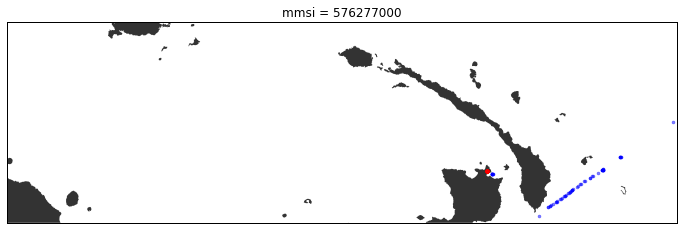

Waiting on bqjob_r63d2c00d1b16086b_0000015450492a0d_154 ... (0s) Current status: DONE   
Query time: 1.31225800514 seconds.


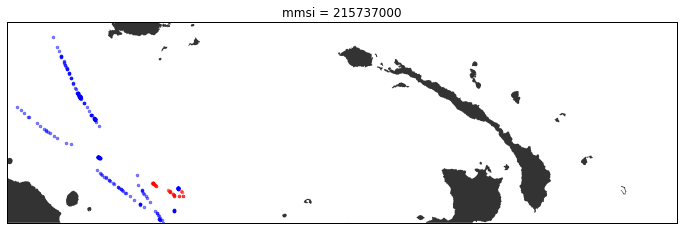

Waiting on bqjob_r11b7c6c94ca73061_0000015450493725_155 ... (0s) Current status: DONE   
Query time: 0.827559947968 seconds.


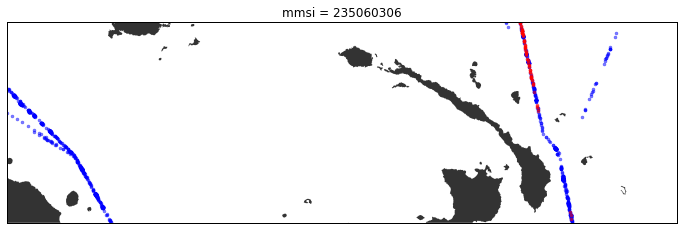

Waiting on bqjob_r4ac170d353f3f746_0000015450494245_156 ... (0s) Current status: DONE   
Query time: 2.13122797012 seconds.


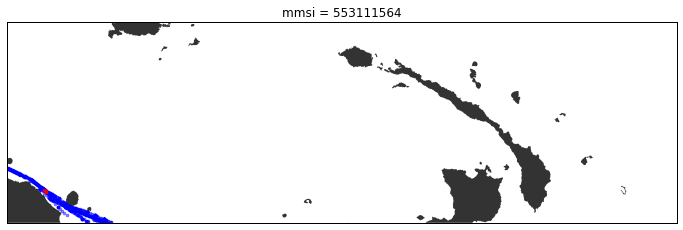

Waiting on bqjob_r7e0f418ebcee01e0_000001545049524e_157 ... (0s) Current status: DONE   
Query time: 2.13246917725 seconds.


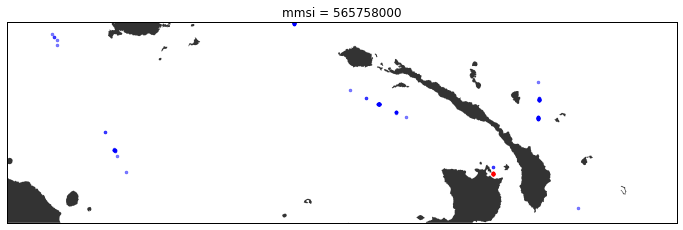

Waiting on bqjob_r3ede63aaf0bfacc5_0000015450496219_158 ... (0s) Current status: DONE   
Query time: 1.22857713699 seconds.


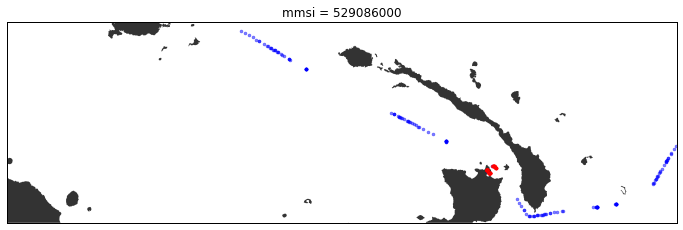

Waiting on bqjob_r4f462945ce8c1701_0000015450496e4d_159 ... (0s) Current status: DONE   
Query time: 2.10524201393 seconds.


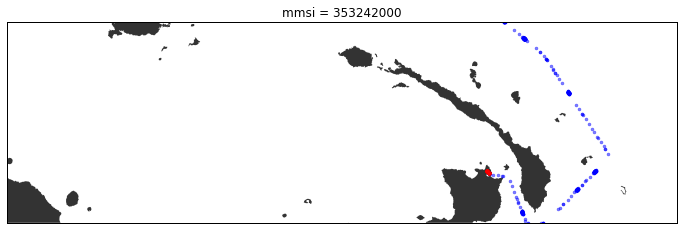

Waiting on bqjob_r74c7322e13938d63_0000015450497ded_160 ... (0s) Current status: DONE   
Query time: 1.05130696297 seconds.


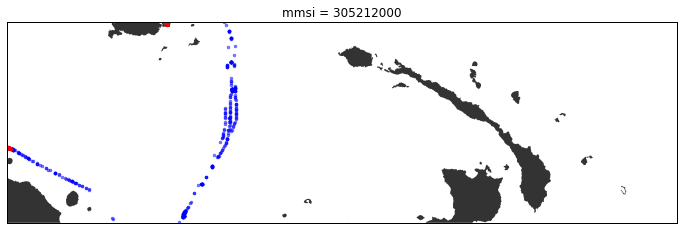

Waiting on bqjob_r3a57263a40048917_0000015450498990_161 ... (0s) Current status: DONE   
Query time: 2.52051091194 seconds.


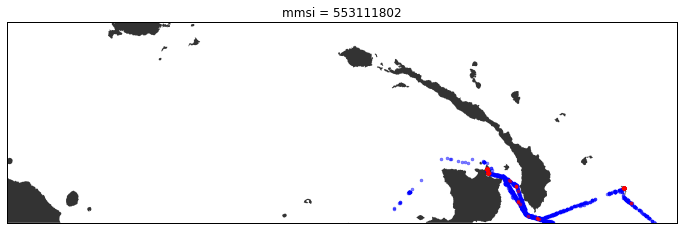

Waiting on bqjob_r45e48e59f5e7ca76_0000015450499ac8_162 ... (0s) Current status: DONE   
Query time: 2.18262696266 seconds.


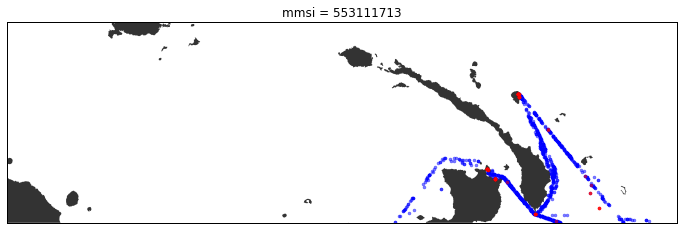

Waiting on bqjob_r593ccc7eac863856_000001545049ab2c_163 ... (0s) Current status: DONE   
Query time: 0.861322164536 seconds.


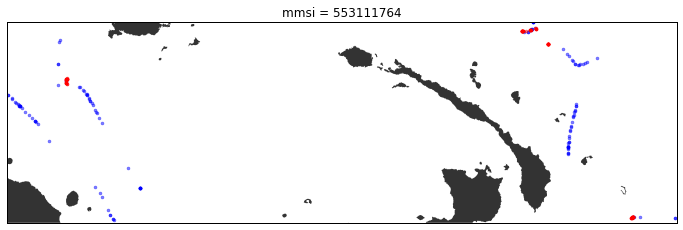

Waiting on bqjob_r3202602fa9051dd5_000001545049b682_164 ... (0s) Current status: DONE   
Query time: 1.88035082817 seconds.


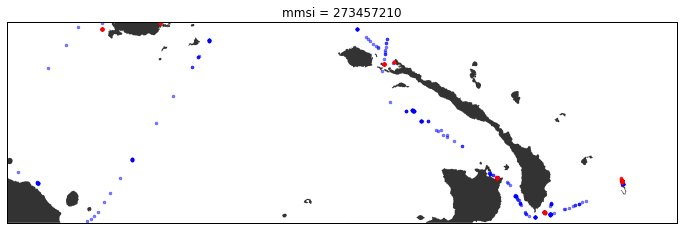

Waiting on bqjob_r14f68077052a68f0_000001545049c592_165 ... (0s) Current status: DONE   
Query time: 2.16033387184 seconds.


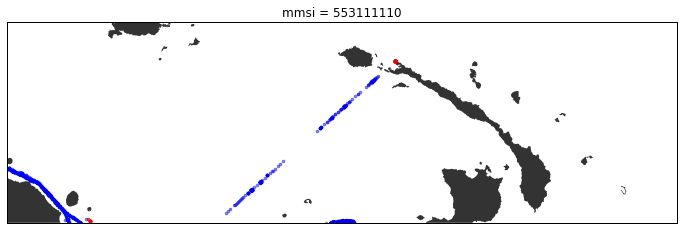

Waiting on bqjob_r513abfccaa424129_000001545049d5bd_166 ... (0s) Current status: DONE   
Query time: 2.3700170517 seconds.


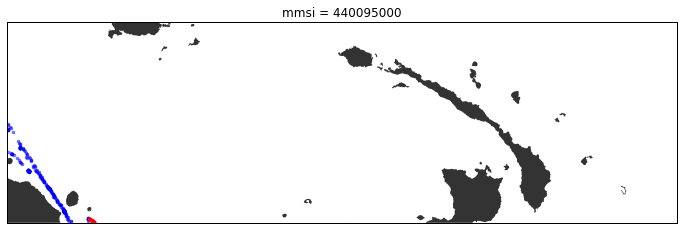

Waiting on bqjob_r2b96c7ea15b6ea9f_000001545049e6c5_167 ... (0s) Current status: DONE   
Query time: 2.24428105354 seconds.


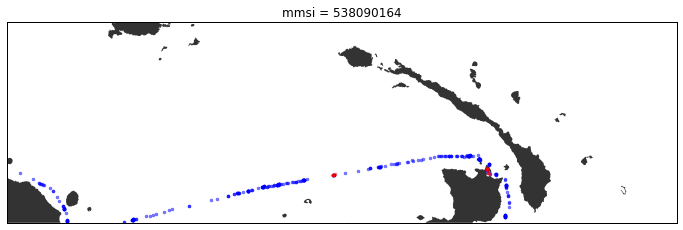

Waiting on bqjob_r79cc23d48e21a3b5_000001545049f758_168 ... (0s) Current status: DONE   
Query time: 1.15719199181 seconds.


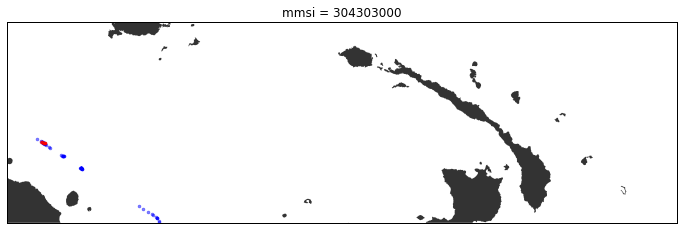

Waiting on bqjob_r68894ccbec035cf1_00000154504a03c2_169 ... (0s) Current status: DONE   
Query time: 1.77730607986 seconds.


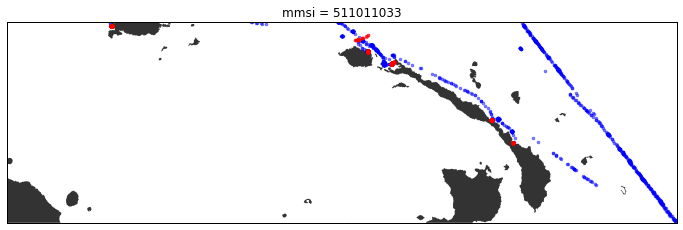

Waiting on bqjob_r675d381a7c0a0bbd_00000154504a12ea_170 ... (0s) Current status: DONE   
Query time: 2.34160614014 seconds.


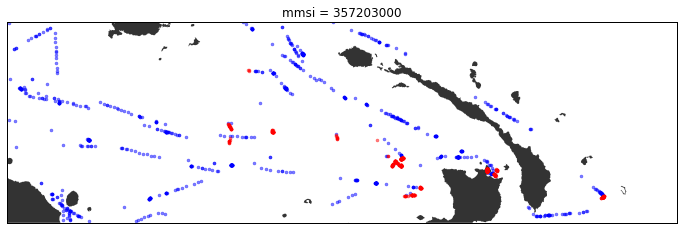

Waiting on bqjob_r6844bef342f71bb6_00000154504a23fe_171 ... (0s) Current status: DONE   
Query time: 2.09646320343 seconds.


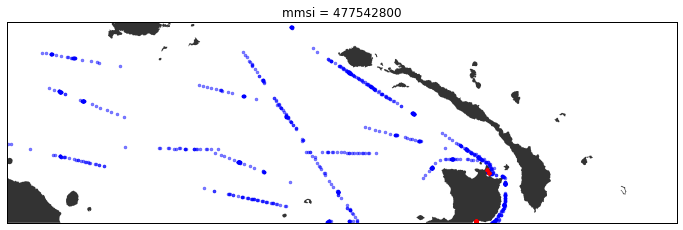

Waiting on bqjob_r139a06292b1539eb_00000154504a3458_172 ... (0s) Current status: DONE   
Query time: 1.78116893768 seconds.


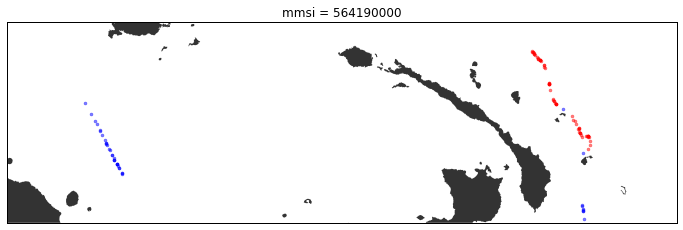

Waiting on bqjob_r4de446511d5f4401_00000154504a4326_173 ... (0s) Current status: DONE   
Query time: 1.68341803551 seconds.


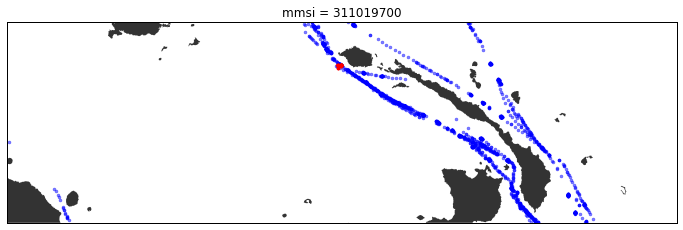

Waiting on bqjob_r2aa55c432c53800b_00000154504a513c_174 ... (0s) Current status: DONE   
Query time: 1.87456607819 seconds.


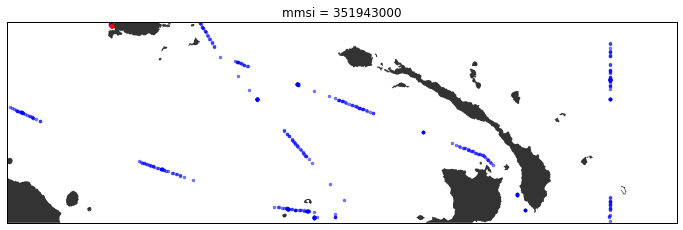

Waiting on bqjob_r718e42ff48c5cb9a_00000154504a5ff1_175 ... (0s) Current status: DONE   
Query time: 2.35740804672 seconds.


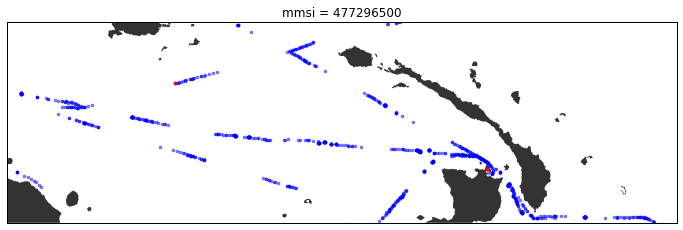

Waiting on bqjob_r567b50eff4a35e3f_00000154504a7091_176 ... (0s) Current status: DONE   
Query time: 2.21602106094 seconds.


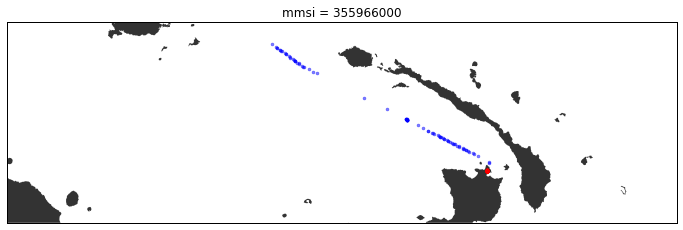

Waiting on bqjob_r6e1b2b427f4f6cd3_00000154504a80cb_177 ... (0s) Current status: DONE   
Query time: 1.84906792641 seconds.


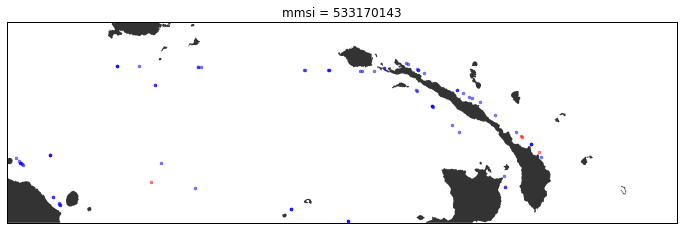

Waiting on bqjob_r19ab683eaea9588a_00000154504a8ffb_178 ... (0s) Current status: DONE   
Query time: 1.29918479919 seconds.


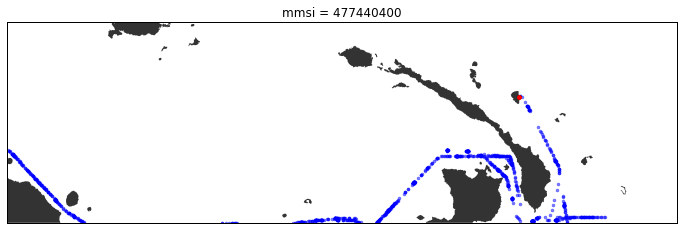

Waiting on bqjob_r36a57167384bc6a0_00000154504a9cdc_179 ... (0s) Current status: DONE   
Query time: 1.30720210075 seconds.


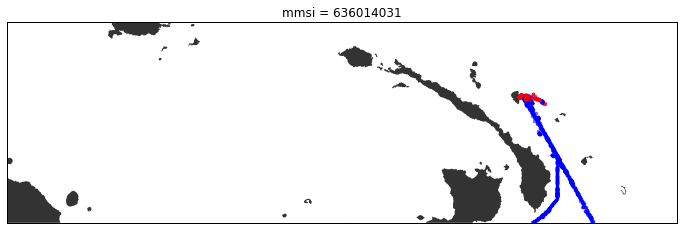

Waiting on bqjob_r525383815379a8cb_00000154504aa9f0_180 ... (0s) Current status: DONE   
Query time: 0.856067895889 seconds.


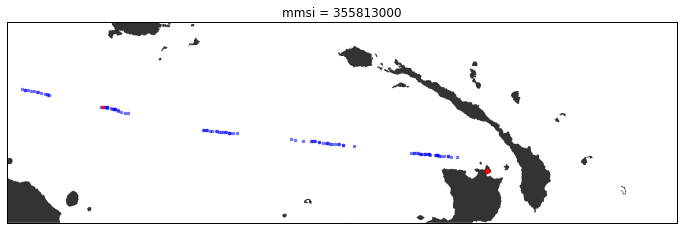

Waiting on bqjob_r10ffed3d9cf1a02b_00000154504ab527_181 ... (0s) Current status: DONE   
Query time: 3.30447602272 seconds.


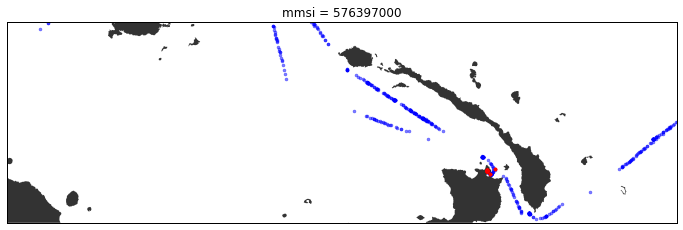

Waiting on bqjob_raeaf9c192c31d68_00000154504ac9ca_182 ... (0s) Current status: DONE   
Query time: 2.00867795944 seconds.


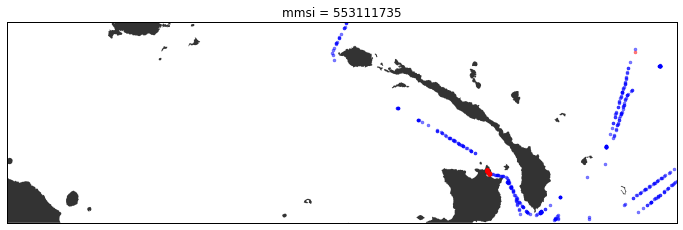

Waiting on bqjob_r4aacdd1f4d38e63c_00000154504ad94e_183 ... (0s) Current status: DONE   
Query time: 2.62241601944 seconds.


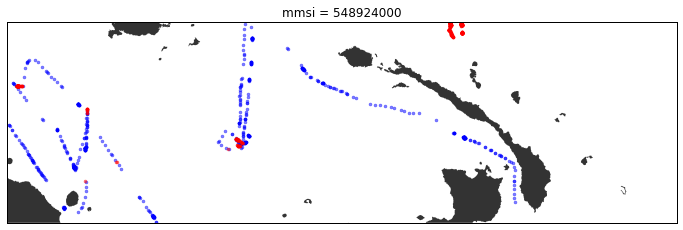

Waiting on bqjob_r2f06b131da626f9c_00000154504aeb03_184 ... (0s) Current status: DONE   
Query time: 2.12109899521 seconds.


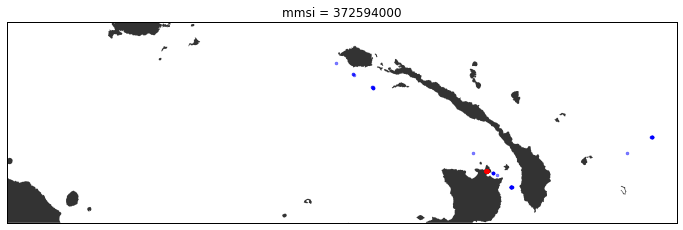

Waiting on bqjob_r7a607aa5c24879eb_00000154504afb3b_185 ... (0s) Current status: DONE   
Query time: 1.83217000961 seconds.


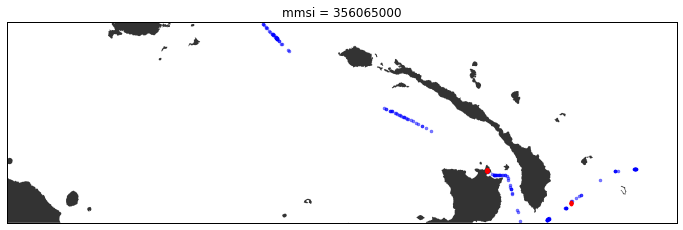

Waiting on bqjob_r68a590f57e4bcdac_00000154504b09d8_186 ... (0s) Current status: DONE   
Query time: 1.40062785149 seconds.


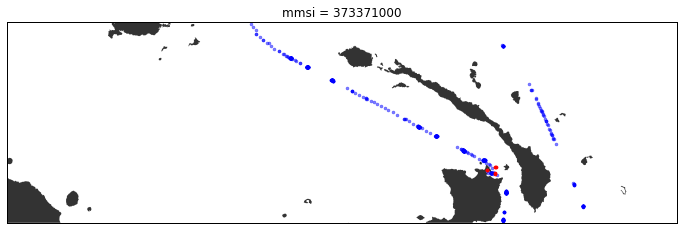

Waiting on bqjob_r615916a93d44c380_00000154504b16c0_187 ... (0s) Current status: DONE   
Query time: 2.06586003304 seconds.


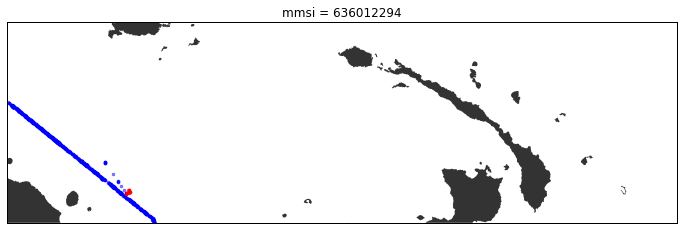

Waiting on bqjob_r7afffe99e6d6ae2c_00000154504b2660_188 ... (0s) Current status: DONE   
Query time: 1.94777703285 seconds.


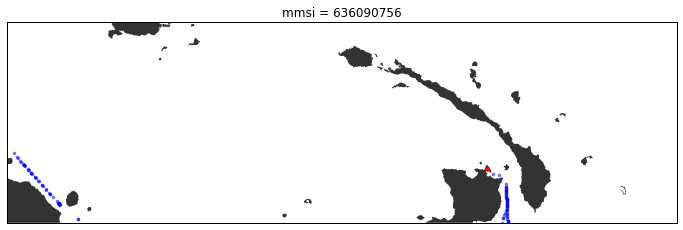

Waiting on bqjob_r725d56b76c8727a7_00000154504b3577_189 ... (0s) Current status: DONE   
Query time: 0.86722612381 seconds.


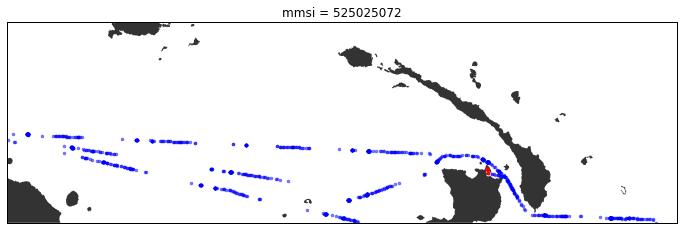

Waiting on bqjob_r70ee145120b3b662_00000154504b409b_190 ... (0s) Current status: DONE   
Query time: 1.30310416222 seconds.


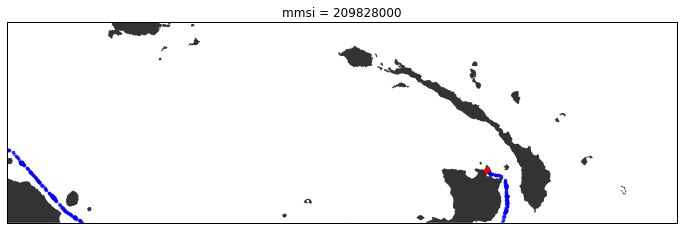

Waiting on bqjob_r1156717a5d83d6ba_00000154504b4dbc_191 ... (0s) Current status: DONE   
Query time: 0.792487859726 seconds.


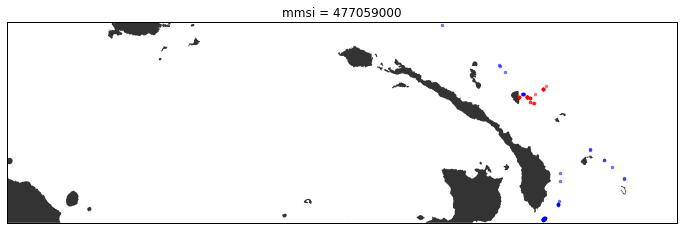

Waiting on bqjob_rbf6d43c8e0b7611_00000154504b58a8_192 ... (0s) Current status: DONE   
Query time: 1.33243107796 seconds.


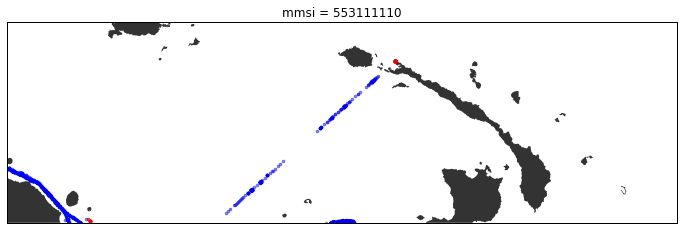

Waiting on bqjob_r20c03509dfc01f80_00000154504b6570_193 ... (0s) Current status: DONE   
Query time: 2.05060815811 seconds.


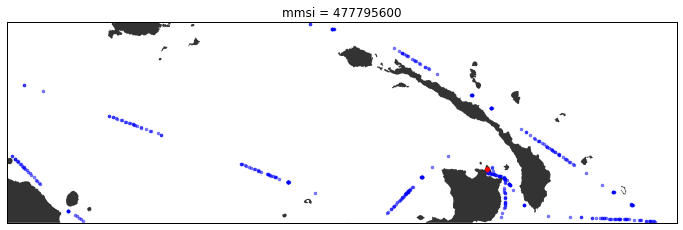

Waiting on bqjob_r23ec1924861e99dd_00000154504b7527_194 ... (0s) Current status: DONE   
Query time: 2.62603497505 seconds.


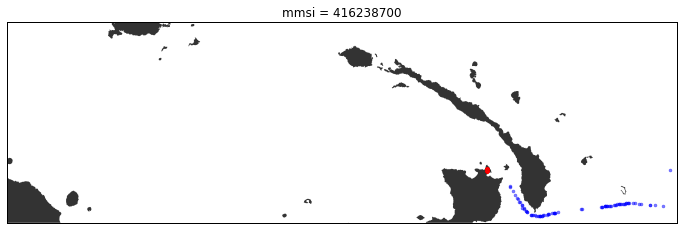

Waiting on bqjob_r3be71d49c03f3776_00000154504b8737_195 ... (0s) Current status: DONE   
Query time: 1.82119894028 seconds.


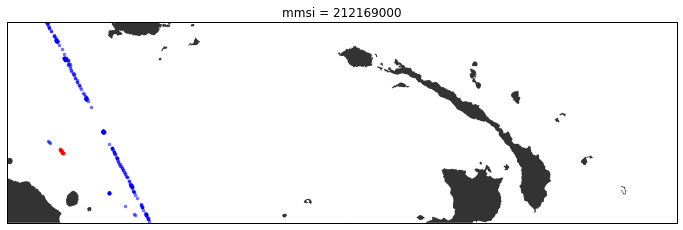

Waiting on bqjob_r6d2558534413698d_00000154504b95e5_196 ... (0s) Current status: DONE   
Query time: 1.96797585487 seconds.


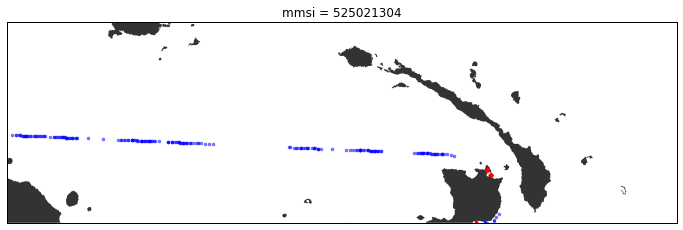

Waiting on bqjob_r78ef2c9669dda284_00000154504ba526_197 ... (0s) Current status: DONE   
Query time: 3.14393091202 seconds.


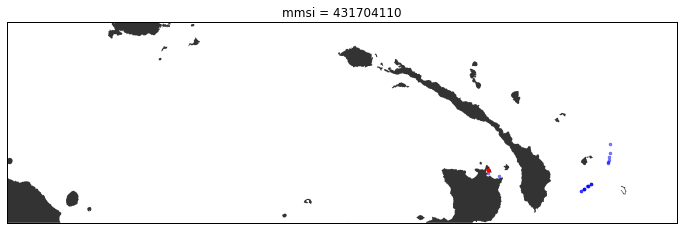

Waiting on bqjob_r114bd335346881f3_00000154504bb947_198 ... (0s) Current status: DONE   
Query time: 1.86953806877 seconds.


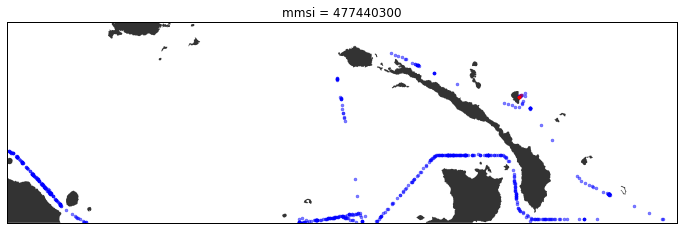

Waiting on bqjob_r3f3214df2cc3227d_00000154504bc83c_199 ... (0s) Current status: DONE   
Query time: 2.1763689518 seconds.


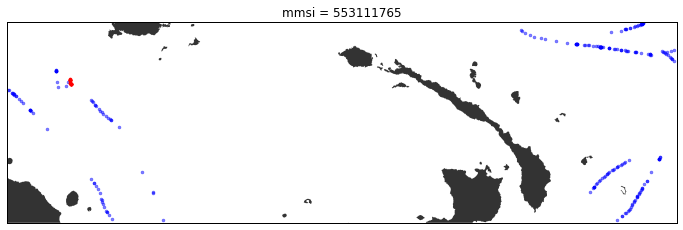

Waiting on bqjob_r6c8bb079ae5b320f_00000154504bd81e_200 ... (0s) Current status: DONE   
Query time: 1.39604878426 seconds.


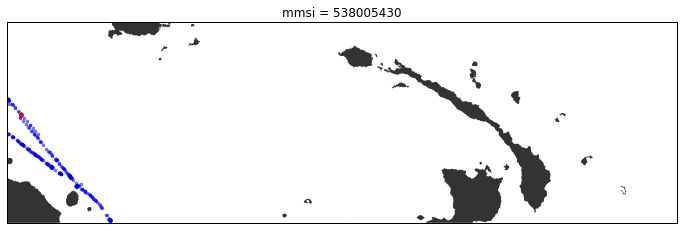

Waiting on bqjob_r53a9bdb817a05a01_00000154504be52b_201 ... (0s) Current status: DONE   
Query time: 2.02387309074 seconds.


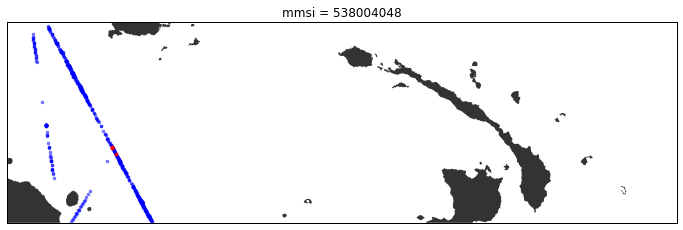

Waiting on bqjob_r24eba02b2db6eb_00000154504bf4eb_202 ... (0s) Current status: DONE   
Query time: 0.982847213745 seconds.


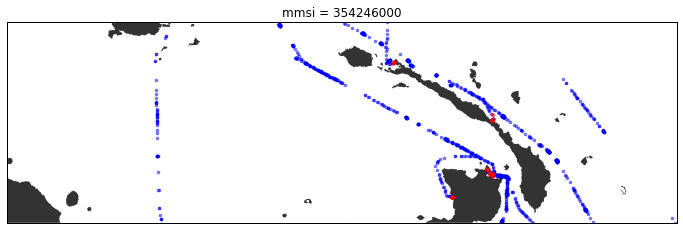

Waiting on bqjob_r63928a732bad4fef_00000154504c00a2_203 ... (0s) Current status: DONE   
Query time: 2.07860612869 seconds.


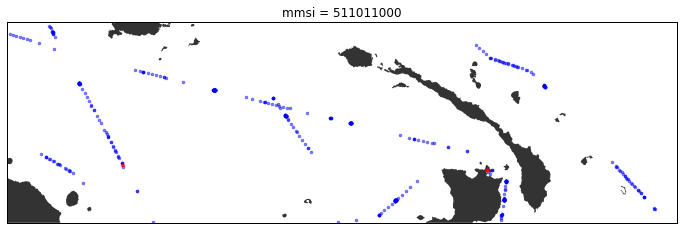

Waiting on bqjob_r27c5e4893bc4e2f3_00000154504c1093_204 ... (0s) Current status: DONE   
Query time: 2.51334190369 seconds.


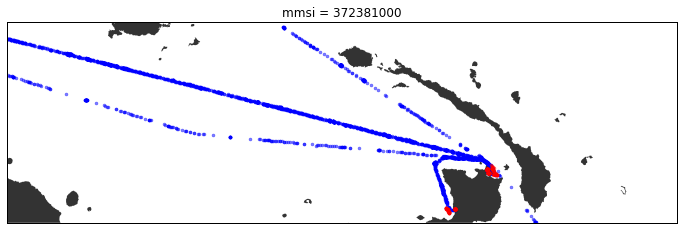

Waiting on bqjob_r208d0b82057b27fb_00000154504c21f9_205 ... (0s) Current status: DONE   
Query time: 1.94763803482 seconds.


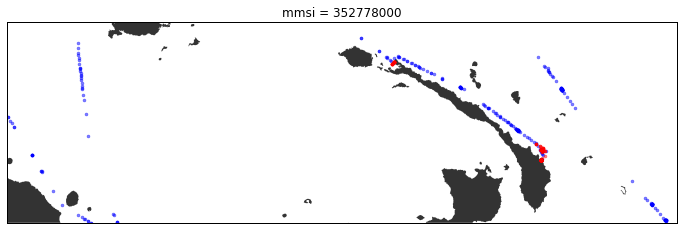

Waiting on bqjob_r4d1d38ba251ae8be_00000154504c3115_206 ... (0s) Current status: DONE   
Query time: 0.84614109993 seconds.


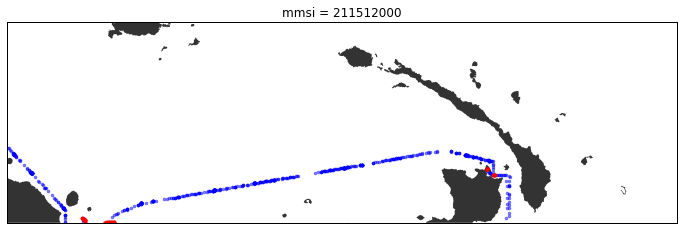

Waiting on bqjob_r63c892b7833b5652_00000154504c3be4_207 ... (0s) Current status: DONE   
Query time: 1.68801808357 seconds.


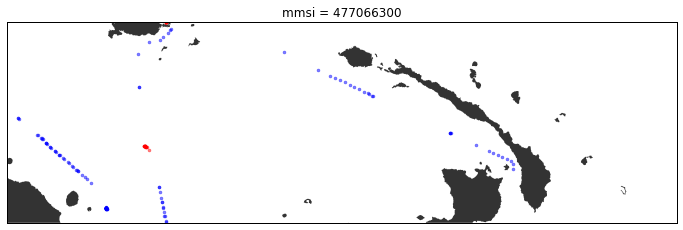

Waiting on bqjob_rc2ee905fa14d0b9_00000154504c4a02_208 ... (0s) Current status: DONE   
Query time: 2.41442704201 seconds.


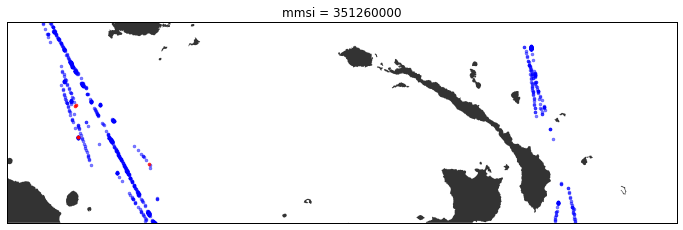

Waiting on bqjob_r510da36268daaf56_00000154504c5b70_209 ... (0s) Current status: DONE   
Query time: 2.03411602974 seconds.


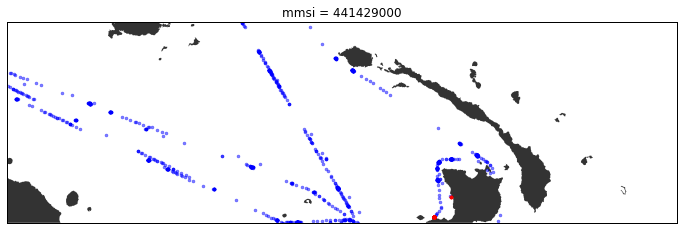

Waiting on bqjob_r39c21fef9bb5b098_00000154504c6b63_210 ... (0s) Current status: DONE   
Query time: 1.4972949028 seconds.


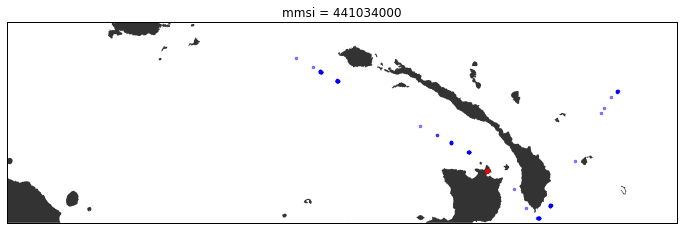

Waiting on bqjob_r4051112e72652f8b_00000154504c7923_211 ... (0s) Current status: DONE   
Query time: 2.54270410538 seconds.


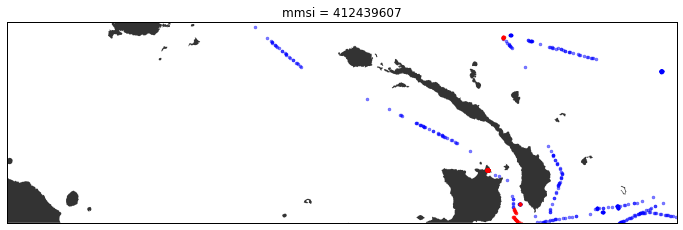

Waiting on bqjob_r3c01c89cb4d23de1_00000154504c8ac5_212 ... (0s) Current status: DONE   
Query time: 1.08579611778 seconds.


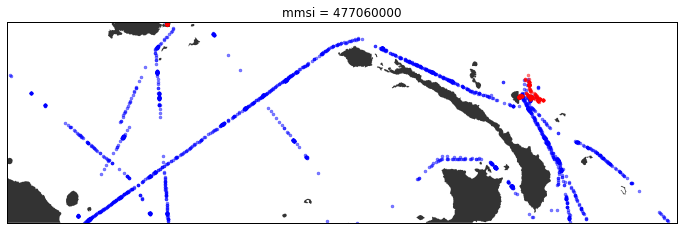

Waiting on bqjob_r1c88ef5042b04626_00000154504c971c_213 ... (0s) Current status: DONE   
Query time: 1.87109494209 seconds.


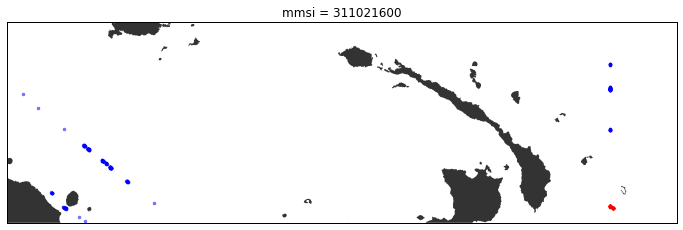

Waiting on bqjob_r5497abac4dcdeeb4_00000154504ca5f5_214 ... (0s) Current status: DONE   
Query time: 2.25712299347 seconds.


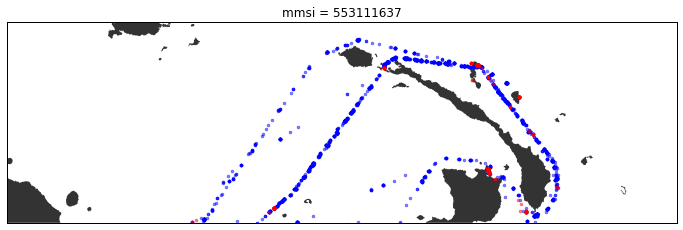

Waiting on bqjob_r619acd89d9f5ad7a_00000154504cb63a_215 ... (0s) Current status: DONE   
Query time: 0.850090026855 seconds.


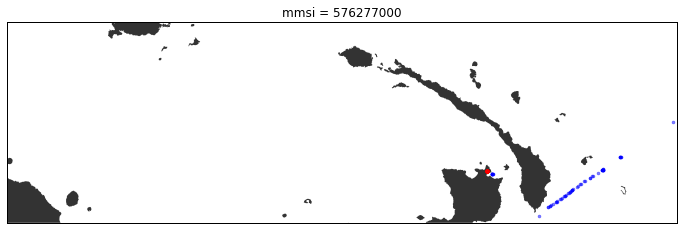

Waiting on bqjob_r60b7fcd515b16079_00000154504cc132_216 ... (0s) Current status: DONE   
Query time: 0.960994958878 seconds.


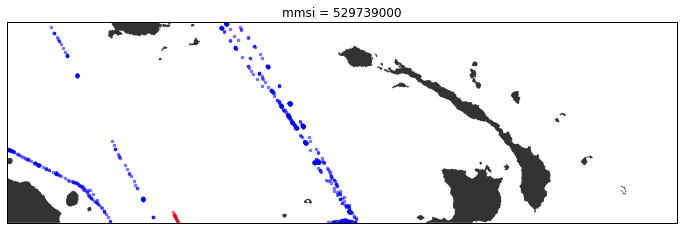

Waiting on bqjob_rbe7e7ee60fbc28f_00000154504cccab_217 ... (0s) Current status: DONE   
Query time: 2.0009868145 seconds.


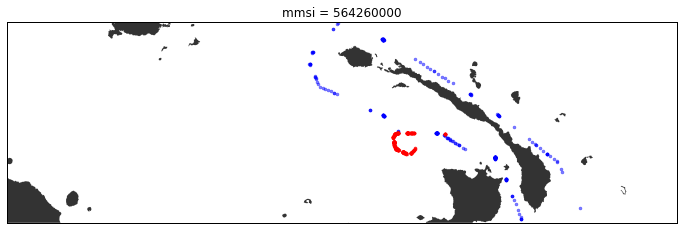

Waiting on bqjob_r2d3a532199666bcf_00000154504cdc0d_218 ... (0s) Current status: DONE   
Query time: 0.893905162811 seconds.


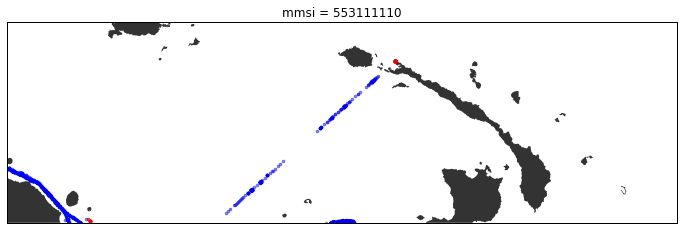

Waiting on bqjob_r5199807eac168434_00000154504ce774_219 ... (0s) Current status: DONE   
Query time: 1.32638883591 seconds.


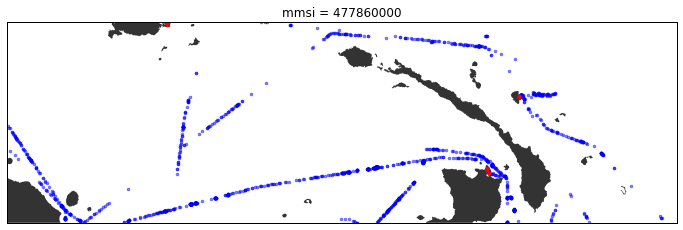

Waiting on bqjob_r2801464bfdbd1216_00000154504cf443_220 ... (0s) Current status: DONE   
Query time: 0.986394882202 seconds.


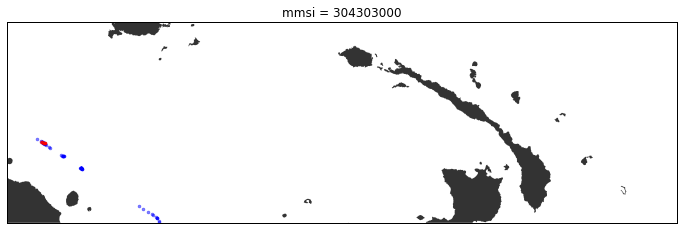

Waiting on bqjob_r5dcc119384d9fe45_00000154504cffae_221 ... (0s) Current status: DONE   
Query time: 1.32696914673 seconds.


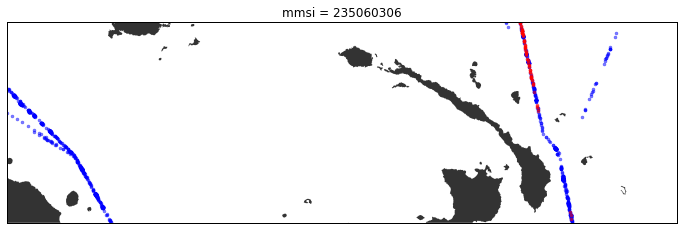

Waiting on bqjob_r733a449d4c9f65be_00000154504d0c9b_222 ... (0s) Current status: DONE   
Query time: 2.57566404343 seconds.


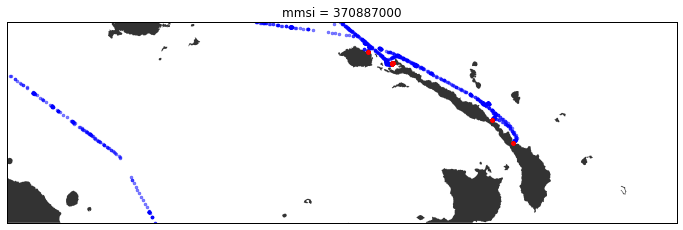

Waiting on bqjob_r63fe2dd123ab85d_00000154504d1e53_223 ... (0s) Current status: DONE   
Query time: 0.820492982864 seconds.


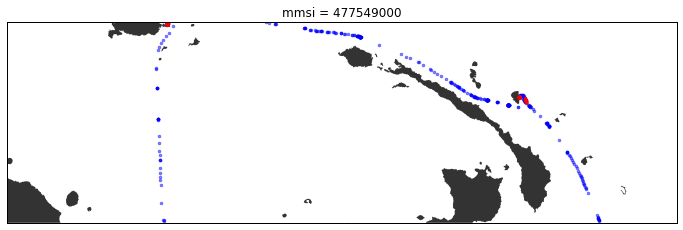

Waiting on bqjob_r5b6393146e86373_00000154504d2952_224 ... (0s) Current status: DONE   
Query time: 2.15272307396 seconds.


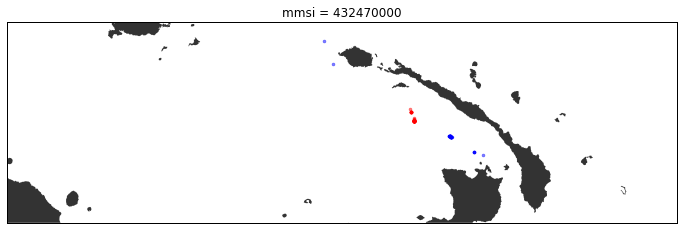

Waiting on bqjob_r7c259a706623c43_00000154504d3921_225 ... (0s) Current status: DONE   
Query time: 1.99479699135 seconds.


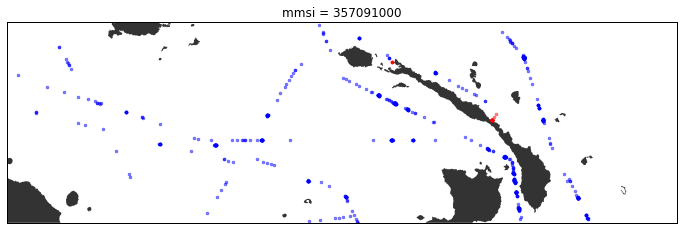

Waiting on bqjob_r25029751c3b5c619_00000154504d48d1_226 ... (0s) Current status: DONE   
Query time: 2.19487690926 seconds.


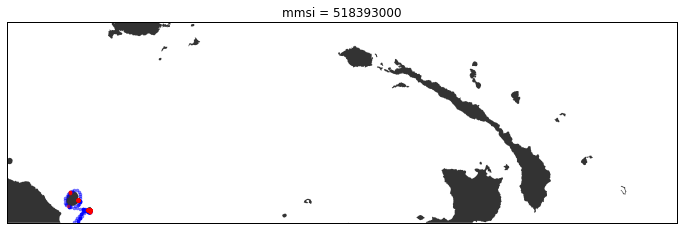

Waiting on bqjob_r6bfb59d8a2290e1a_00000154504d59a5_227 ... (0s) Current status: DONE   
Query time: 1.01306295395 seconds.


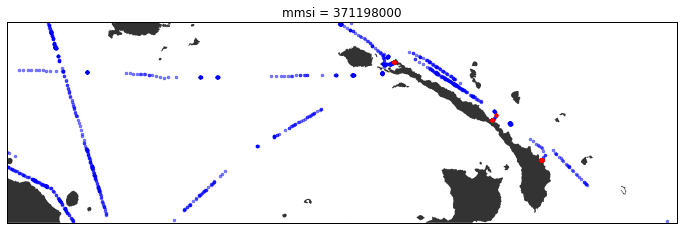

Waiting on bqjob_r115e5aeb6aec94a1_00000154504d65b8_228 ... (0s) Current status: DONE   
Query time: 1.98750805855 seconds.


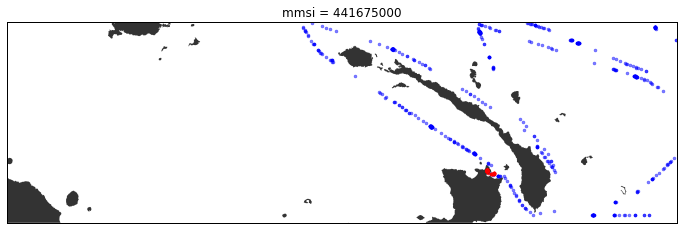

Waiting on bqjob_r7a3a60b4cbb57ad3_00000154504d7585_229 ... (0s) Current status: DONE   
Query time: 1.19464707375 seconds.


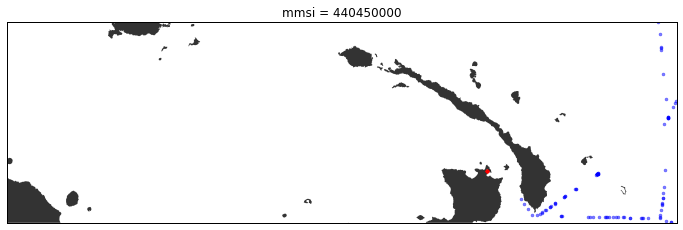

Waiting on bqjob_r67a09547b05b0967_00000154504d81de_230 ... (0s) Current status: DONE   
Query time: 1.19667291641 seconds.


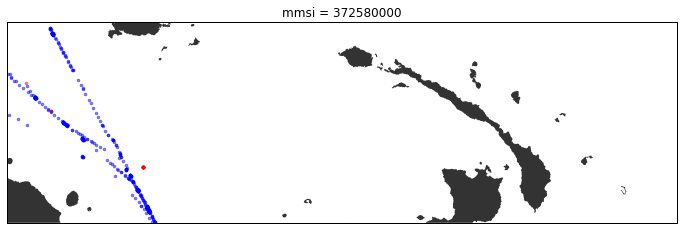

Waiting on bqjob_r89e283b0821db61_00000154504d8e6a_231 ... (0s) Current status: DONE   
Query time: 2.26472806931 seconds.


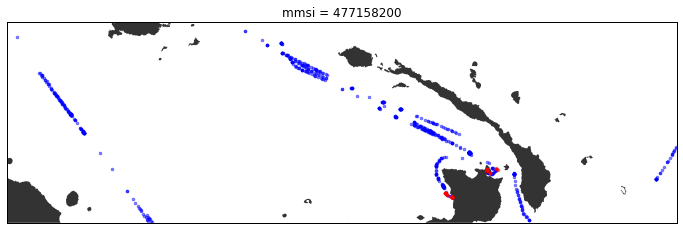

Waiting on bqjob_r1576ea52db0e84e8_00000154504d9f4b_232 ... (0s) Current status: DONE   
Query time: 1.15790319443 seconds.


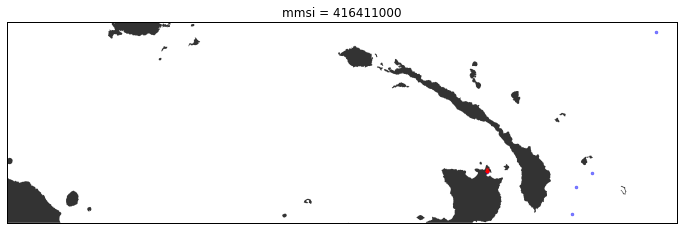

Waiting on bqjob_rc50fe30d5cf57d5_00000154504dab85_233 ... (0s) Current status: DONE   
Query time: 2.14432692528 seconds.


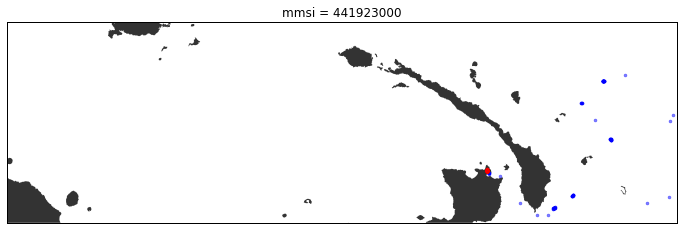

Waiting on bqjob_r1f9ae1010aca9fc0_00000154504dbbac_234 ... (0s) Current status: DONE   
Query time: 2.58797192574 seconds.


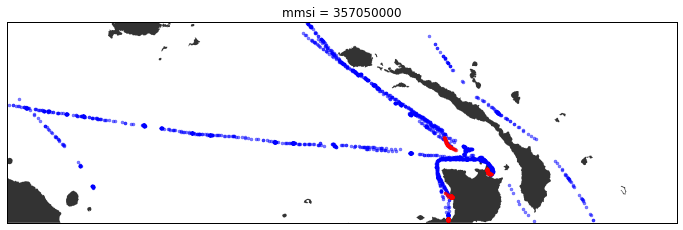

Waiting on bqjob_r6dd24906fe368726_00000154504dcd69_235 ... (0s) Current status: DONE   
Query time: 1.38126397133 seconds.


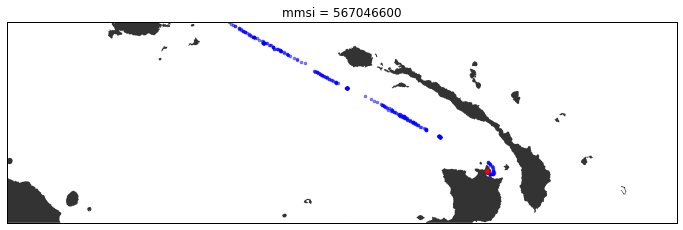

Waiting on bqjob_r63be4e6bdc6fa26f_00000154504ddac6_236 ... (0s) Current status: DONE   
Query time: 0.960352897644 seconds.


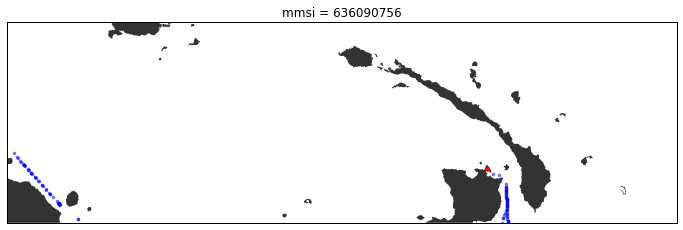

Waiting on bqjob_r73d89de517c5adc2_00000154504de611_237 ... (0s) Current status: DONE   
Query time: 1.23169612885 seconds.


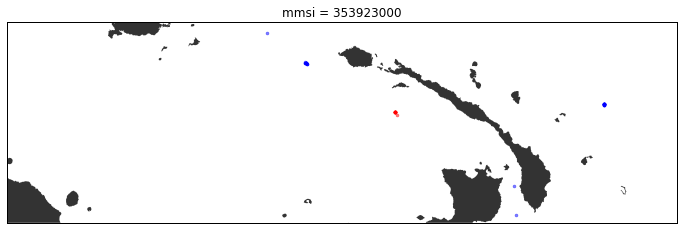

Waiting on bqjob_r79dd32417336ecd_00000154504df261_238 ... (0s) Current status: DONE   
Query time: 1.26950216293 seconds.


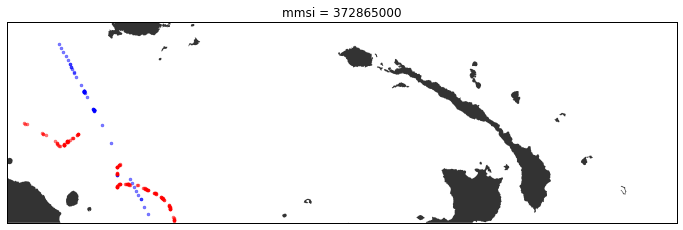

Waiting on bqjob_r59d417845aeb3bad_00000154504dfed0_239 ... (0s) Current status: DONE   
Query time: 2.28079319 seconds.


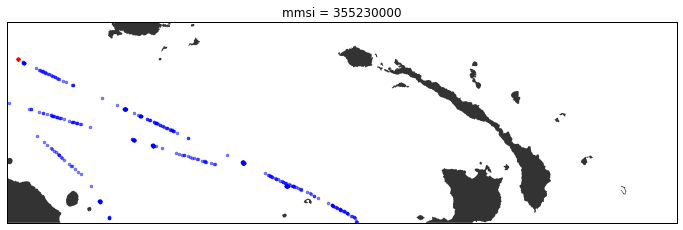

Waiting on bqjob_r3fe2164895ceab73_00000154504e0fa7_240 ... (0s) Current status: DONE   
Query time: 2.36615180969 seconds.


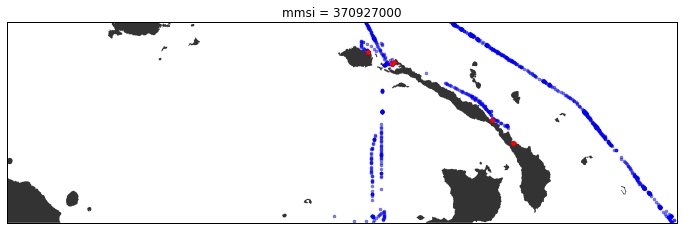

Waiting on bqjob_r798567e0b01f6a6a_00000154504e204a_241 ... (0s) Current status: DONE   
Query time: 0.907292842865 seconds.


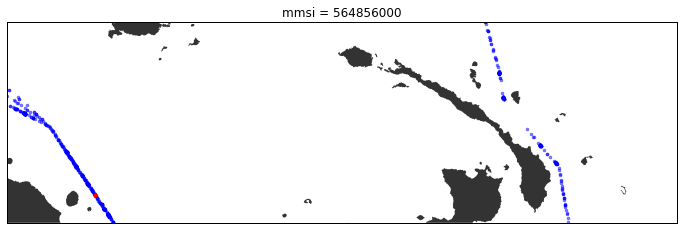

Waiting on bqjob_r119431643041cd2d_00000154504e2b57_242 ... (0s) Current status: DONE   
Query time: 2.58718514442 seconds.


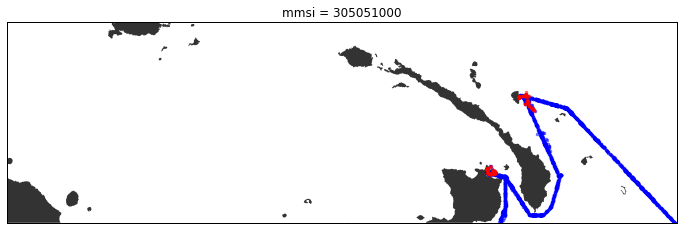

Waiting on bqjob_r154335ef21a9ae8c_00000154504e3ce3_243 ... (0s) Current status: DONE   
Query time: 2.01650691032 seconds.


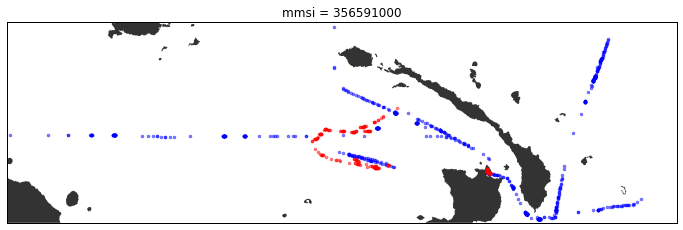

Waiting on bqjob_r223ff635e4050060_00000154504e4cb6_244 ... (0s) Current status: DONE   
Query time: 1.80092787743 seconds.


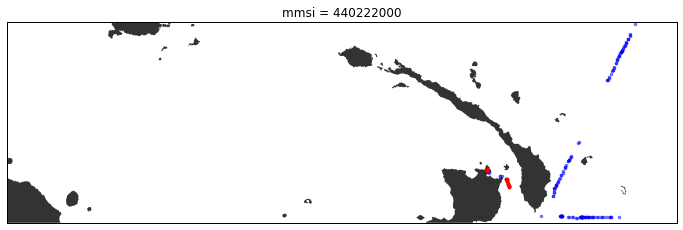

Waiting on bqjob_r7918a7cfd12cfe5c_00000154504e5b0d_245 ... (0s) Current status: DONE   
Query time: 1.90586495399 seconds.


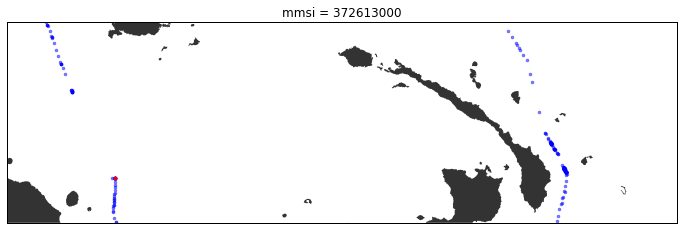

Waiting on bqjob_r52d32b262760eb1_00000154504e6a59_246 ... (0s) Current status: DONE   
Query time: 1.99852800369 seconds.


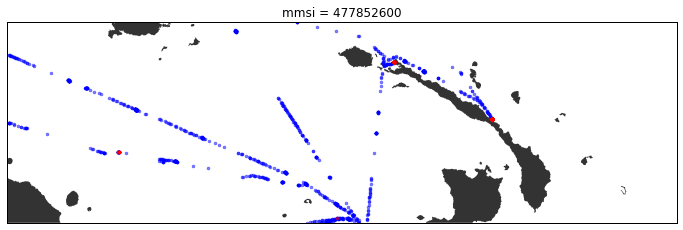

Waiting on bqjob_r2293290f250ed6c4_00000154504e79cb_247 ... (0s) Current status: DONE   
Query time: 1.91281485558 seconds.


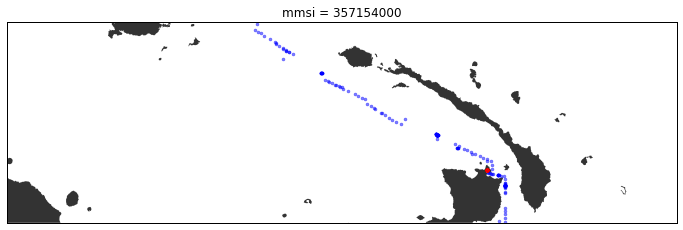

Waiting on bqjob_r320f68812c903237_00000154504e88d5_248 ... (0s) Current status: DONE   
Query time: 1.74553894997 seconds.


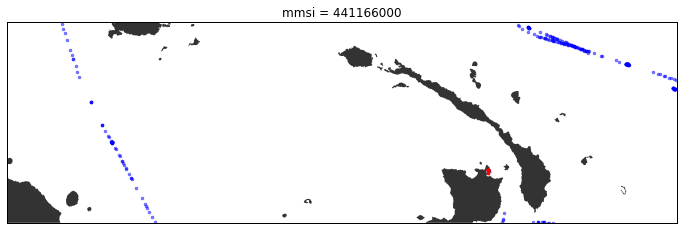

Waiting on bqjob_r72adf9a79aeeebca_00000154504e9769_249 ... (0s) Current status: DONE   
Query time: 1.10248589516 seconds.


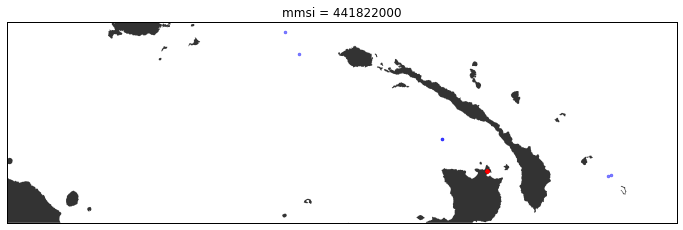

Waiting on bqjob_r1597bc3f3c739631_00000154504ea351_250 ... (0s) Current status: DONE   
Query time: 0.851026058197 seconds.


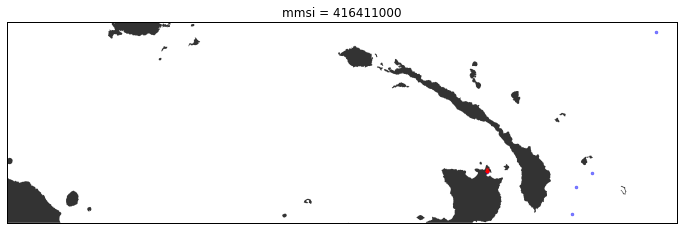

Waiting on bqjob_r2a5550c04659b898_00000154504eae9a_251 ... (0s) Current status: DONE   
Query time: 1.94301605225 seconds.


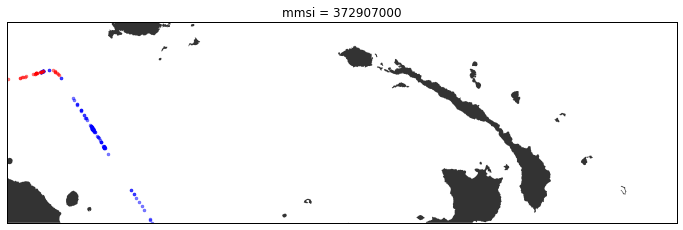

Waiting on bqjob_r56ec84ffea1a494b_00000154504ebe42_252 ... (0s) Current status: DONE   
Query time: 0.842351913452 seconds.


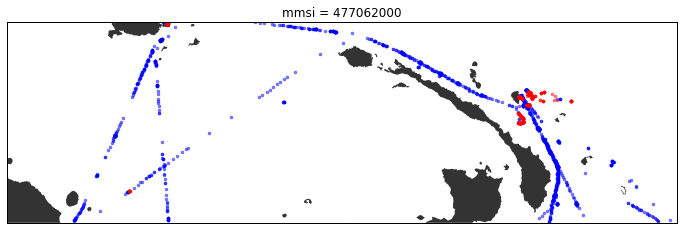

Waiting on bqjob_r11569cb753ed5a83_00000154504ec967_253 ... (0s) Current status: DONE   
Query time: 1.99863290787 seconds.


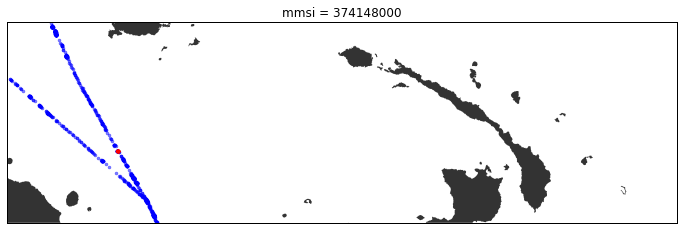

Waiting on bqjob_r67b63cc2b1c35def_00000154504ed925_254 ... (0s) Current status: DONE   
Query time: 0.886265993118 seconds.


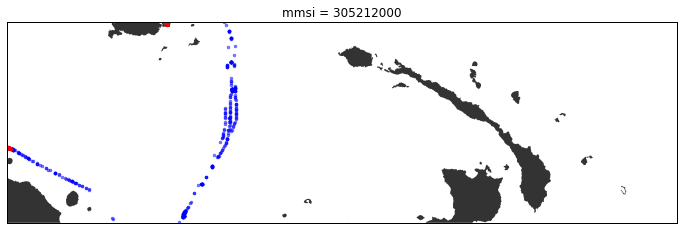

Waiting on bqjob_r2fb1f2555d5f6c8c_00000154504ee473_255 ... (0s) Current status: DONE   
Query time: 2.08501005173 seconds.


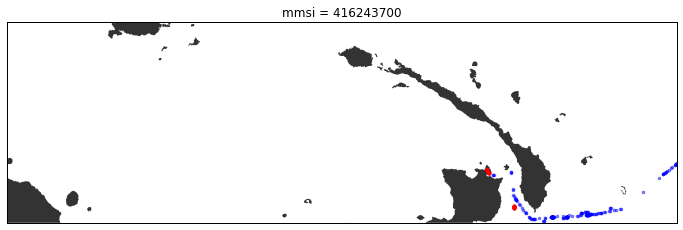

Waiting on bqjob_r348aa80e9a68bfd3_00000154504ef431_256 ... (0s) Current status: DONE   
Query time: 2.07967805862 seconds.


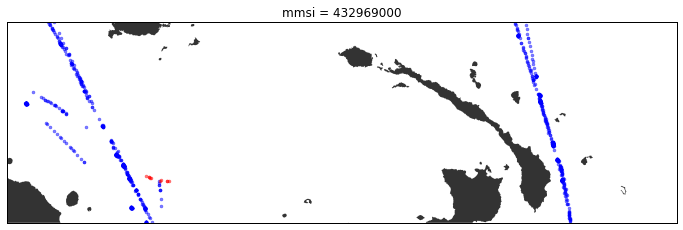

Waiting on bqjob_r3f02a1b6d2be8581_00000154504f042c_257 ... (0s) Current status: DONE   
Query time: 1.07109308243 seconds.


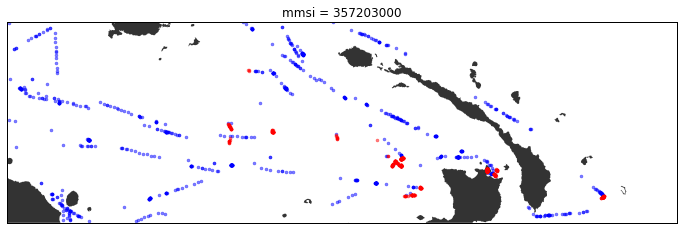

Waiting on bqjob_r79f6446f3d156a1e_00000154504f1056_258 ... (0s) Current status: DONE   
Query time: 2.58299303055 seconds.


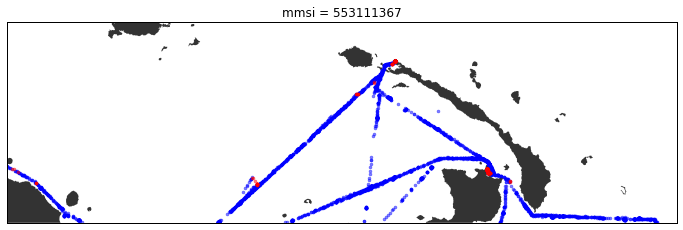

Waiting on bqjob_r5d70b8666dd8698c_00000154504f2277_259 ... (0s) Current status: DONE   
Query time: 1.36081695557 seconds.


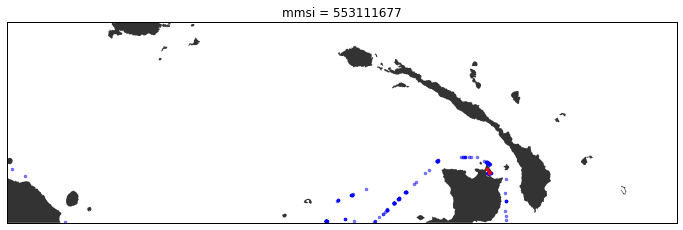

Waiting on bqjob_r36a69d91b9aa1ee6_00000154504f2fdf_260 ... (0s) Current status: DONE   
Query time: 2.20416498184 seconds.


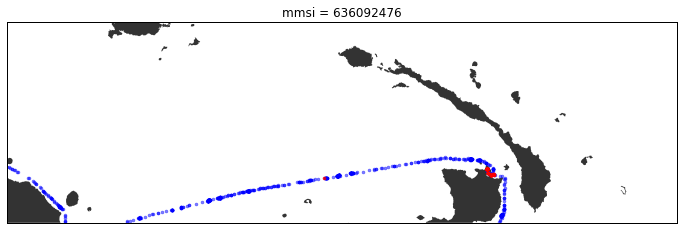

Waiting on bqjob_r636a2e16a8009f20_00000154504f403b_261 ... (0s) Current status: DONE   
Query time: 0.831826925278 seconds.


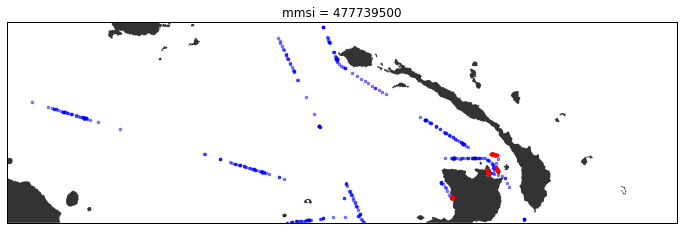

Waiting on bqjob_rf38b03ad15bad2d_00000154504f4b47_262 ... (0s) Current status: DONE   
Query time: 2.06208586693 seconds.


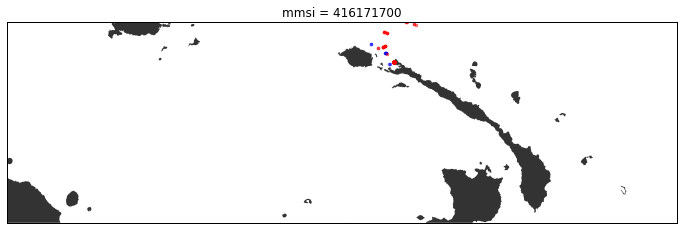

Waiting on bqjob_r1c7d725626798857_00000154504f5b4f_263 ... (0s) Current status: DONE   
Query time: 1.90100717545 seconds.


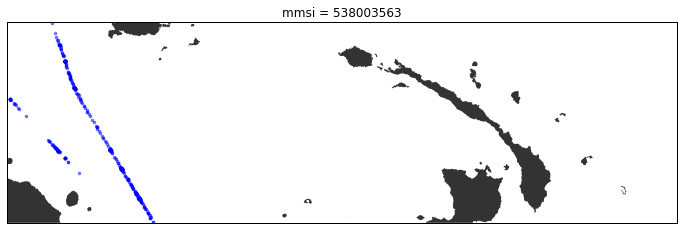

Waiting on bqjob_r149a19e2905bea3b_00000154504f6a98_264 ... (0s) Current status: DONE   
Query time: 1.02412295341 seconds.


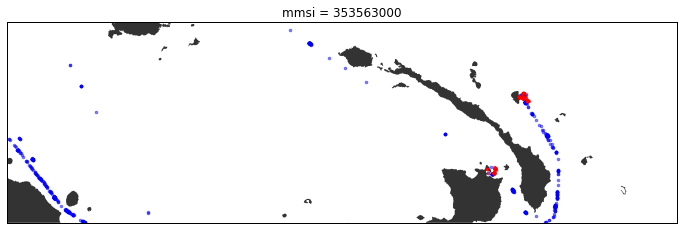

Waiting on bqjob_r1068af1b650aa1f4_00000154504f7628_265 ... (0s) Current status: DONE   
Query time: 2.45643305779 seconds.


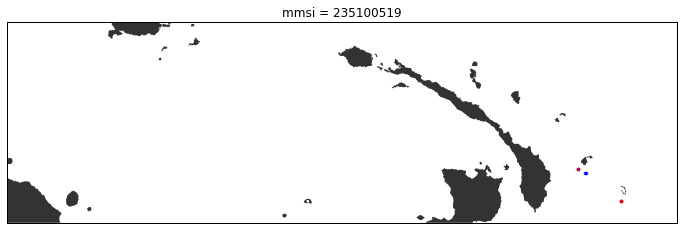

Waiting on bqjob_r715582b36a728b09_00000154504f879f_266 ... (0s) Current status: DONE   
Query time: 1.94872999191 seconds.


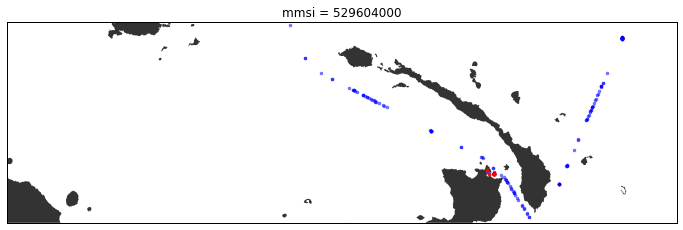

Waiting on bqjob_r29825ad65536affe_00000154504f9727_267 ... (0s) Current status: DONE   
Query time: 2.13508892059 seconds.


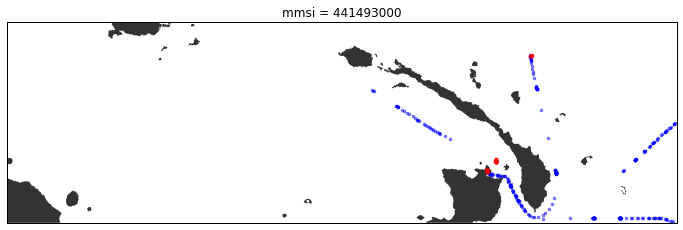

Waiting on bqjob_r49615a4f6186c16_00000154504fa76c_268 ... (0s) Current status: DONE   
Query time: 2.52088689804 seconds.


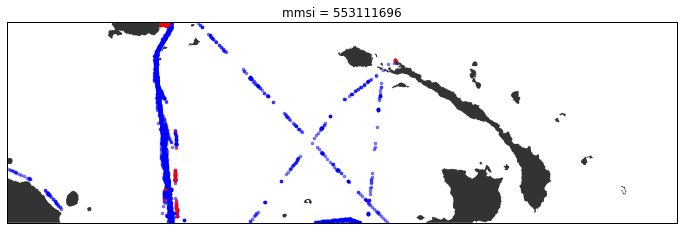

Waiting on bqjob_r3825635ebfb93513_00000154504fb912_269 ... (0s) Current status: DONE   
Query time: 0.699428796768 seconds.


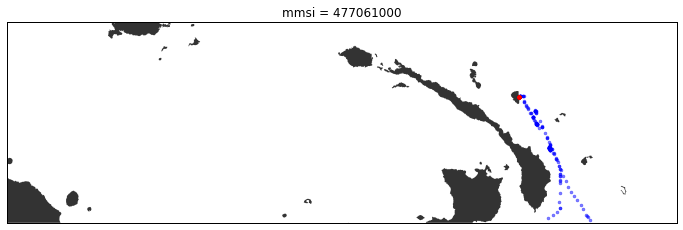

Waiting on bqjob_r7b4a1ef7fc4edadd_00000154504fc38b_270 ... (1s) Current status: DONE   
Query time: 3.92756390572 seconds.


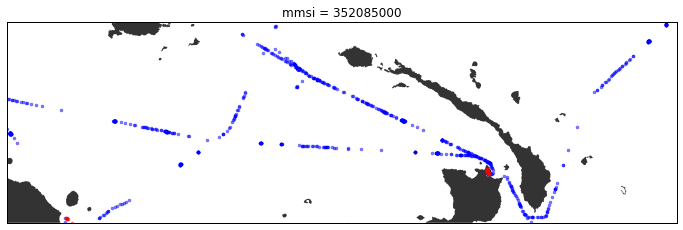

Waiting on bqjob_r63f8339b6525a764_00000154504fdab0_271 ... (0s) Current status: DONE   
Query time: 0.98356795311 seconds.


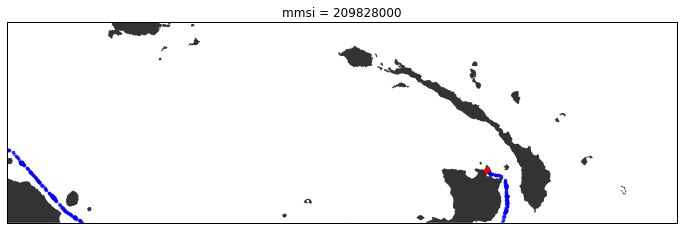

Waiting on bqjob_r6097c41f711c4aca_00000154504fe654_272 ... (0s) Current status: DONE   
Query time: 2.87071084976 seconds.


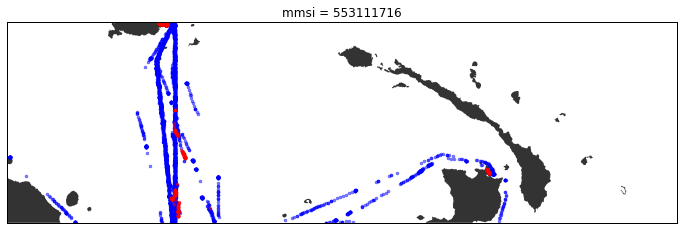

Waiting on bqjob_r1f63dfabc5fa09fc_00000154504ff968_273 ... (0s) Current status: DONE   
Query time: 2.10647511482 seconds.


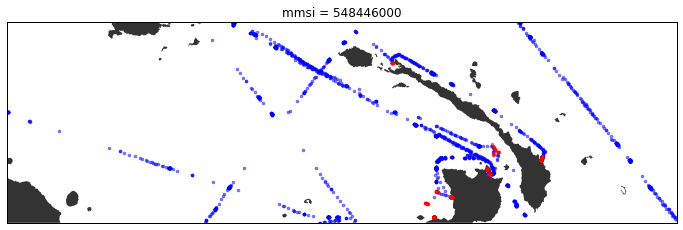

Waiting on bqjob_r440f27d681035acd_0000015450500925_274 ... (0s) Current status: DONE   
Query time: 1.08887290955 seconds.


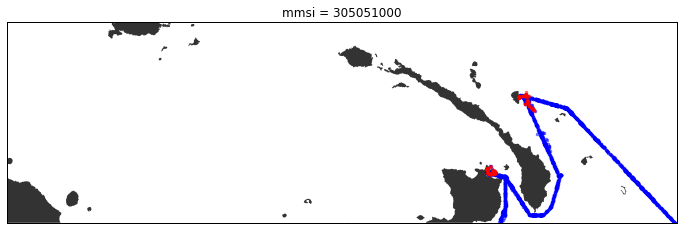

Waiting on bqjob_r2d5edd4cbbb53e73_000001545050151a_275 ... (0s) Current status: DONE   
Query time: 2.08599209785 seconds.


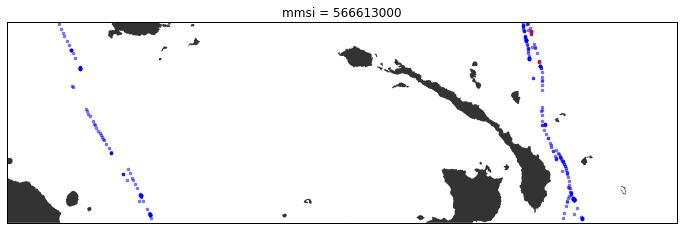

Waiting on bqjob_r5b43fd0553657f06_00000154505025f3_276 ... (0s) Current status: DONE   
Query time: 2.189661026 seconds.


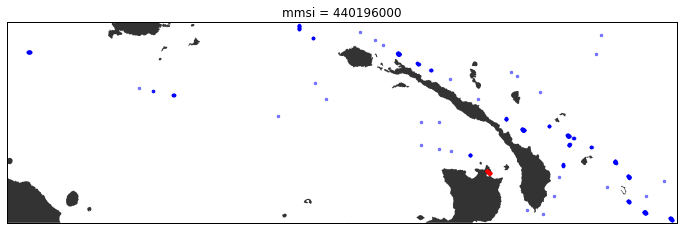

Waiting on bqjob_r7f047b5084f0ca21_0000015450503669_277 ... (0s) Current status: DONE   
Query time: 2.11657595634 seconds.


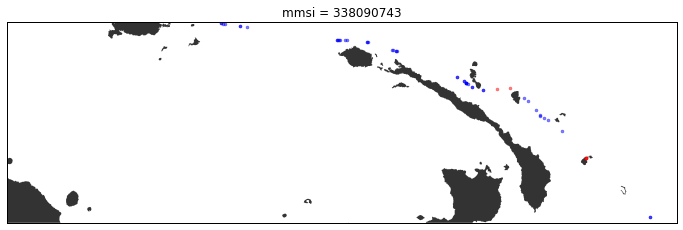

Waiting on bqjob_r5b1950ef340c16b1_000001545050468a_278 ... (0s) Current status: DONE   
Query time: 1.16122889519 seconds.


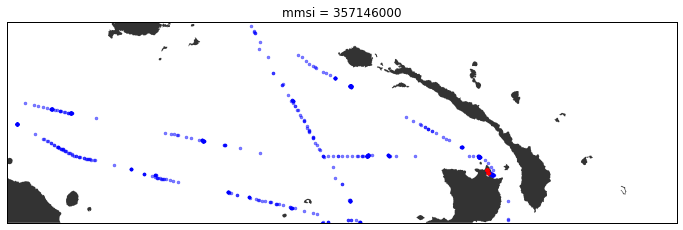

Waiting on bqjob_r362b1390f39358e6_00000154505052cc_279 ... (0s) Current status: DONE   
Query time: 1.98744988441 seconds.


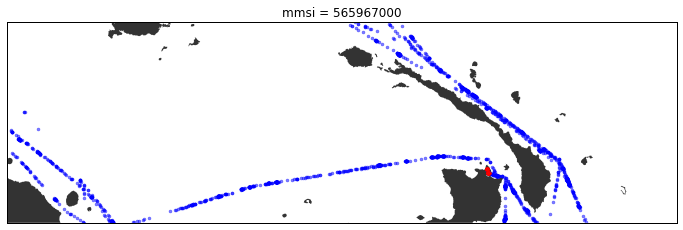

Waiting on bqjob_r255303e8b5eeaa62_000001545050620f_280 ... (0s) Current status: DONE   
Query time: 2.27983212471 seconds.


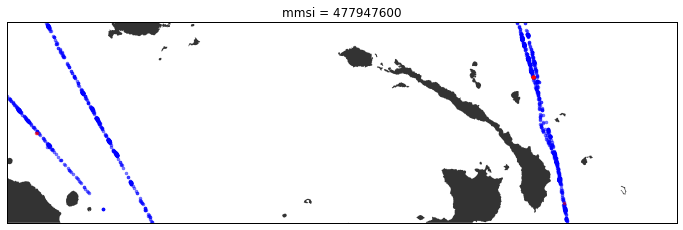

Waiting on bqjob_r32cd37ae3c1862f9_0000015450507345_281 ... (0s) Current status: DONE   
Query time: 0.813545942307 seconds.


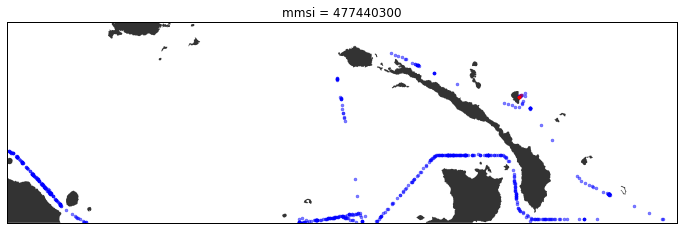

Waiting on bqjob_r2b17c39dd22787b4_0000015450507f0d_282 ... (0s) Current status: DONE   
Query time: 1.04916095734 seconds.


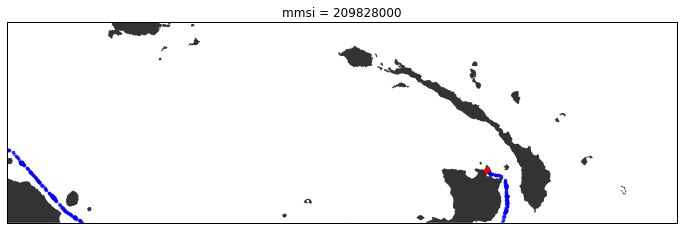

Waiting on bqjob_r224af09fcbe42dd0_0000015450508b2f_283 ... (0s) Current status: DONE   
Query time: 2.1534049511 seconds.


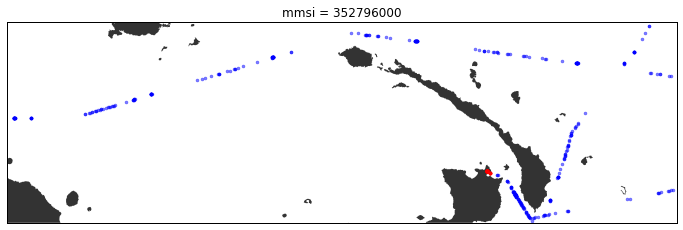

Waiting on bqjob_r6a52108851d0b19e_0000015450509bd1_284 ... (0s) Current status: DONE   
Query time: 1.29314017296 seconds.


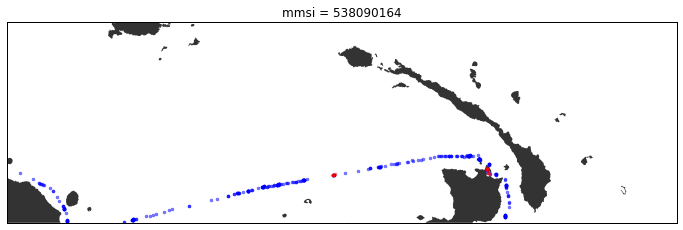

Waiting on bqjob_r38eea12ea3e0e6ac_000001545050a870_285 ... (0s) Current status: DONE   
Query time: 5.48587584496 seconds.


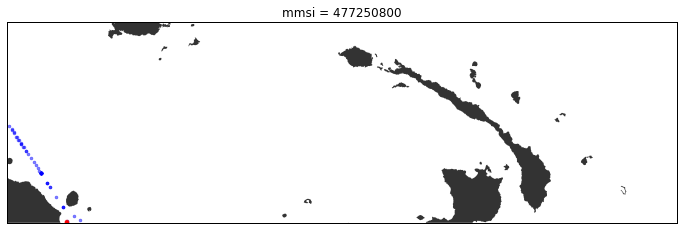

Waiting on bqjob_r66d2ff94c18ebe68_000001545050c586_286 ... (0s) Current status: DONE   
Query time: 0.813732862473 seconds.


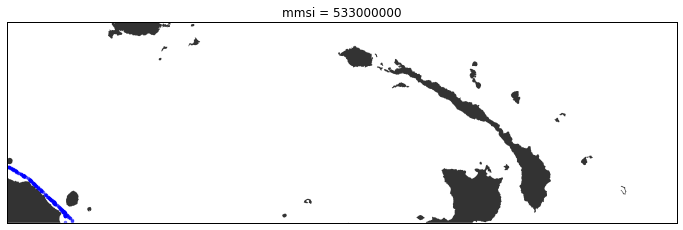

Waiting on bqjob_r5c53c89e73ba86c3_000001545050d07e_287 ... (0s) Current status: DONE   
Query time: 2.07171583176 seconds.


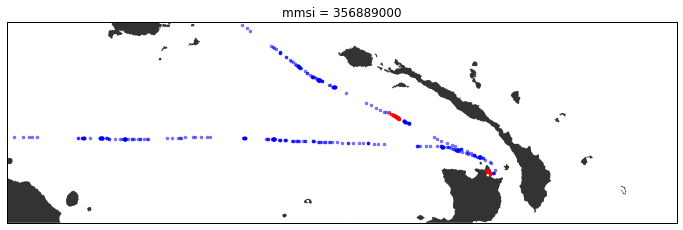

Waiting on bqjob_r5e3844348bcee200_000001545050e014_288 ... (0s) Current status: DONE   
Query time: 1.42185401917 seconds.


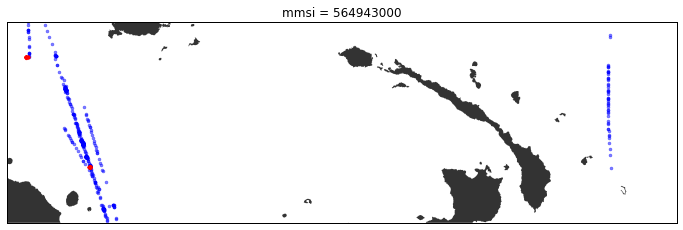

Waiting on bqjob_r6f976e3495d0208a_000001545050ed63_289 ... (0s) Current status: DONE   
Query time: 2.36001205444 seconds.


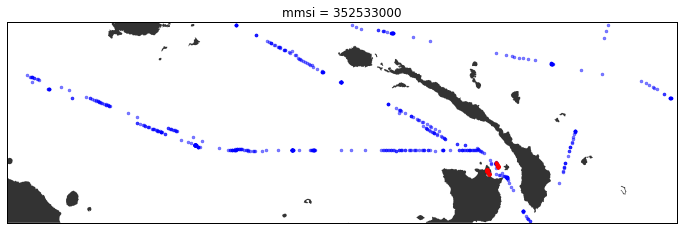

Waiting on bqjob_r628840bf77674bd5_000001545050fe69_290 ... (0s) Current status: DONE   
Query time: 1.84455704689 seconds.


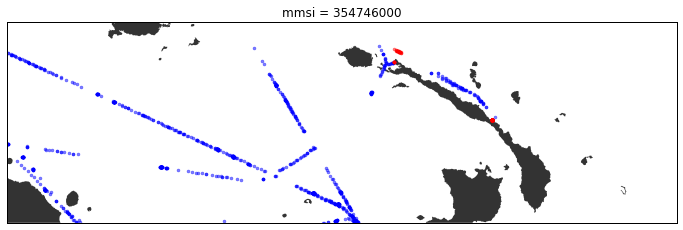

Waiting on bqjob_r65f0ed72831f6d1a_0000015450510de3_291 ... (0s) Current status: DONE   
Query time: 0.923858880997 seconds.


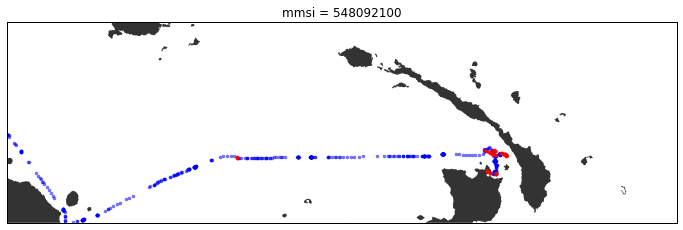

Waiting on bqjob_r63fa2ba82109adc4_0000015450511997_292 ... (0s) Current status: DONE   
Query time: 2.11489701271 seconds.


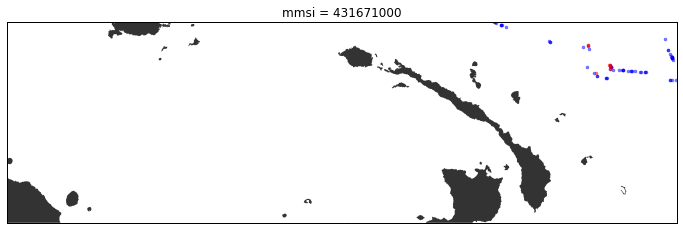

Waiting on bqjob_r3a6febef392a8f92_000001545051296d_293 ... (0s) Current status: DONE   
Query time: 2.04268407822 seconds.


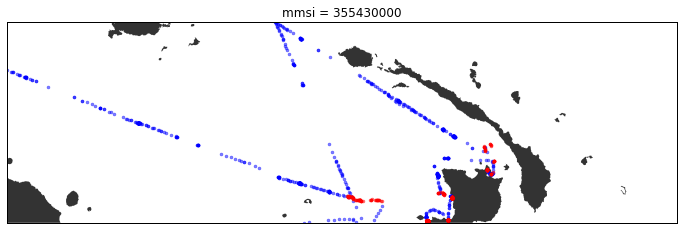

Waiting on bqjob_r266ac1ba292e6cbb_00000154505138f5_294 ... (0s) Current status: DONE   
Query time: 2.98321413994 seconds.


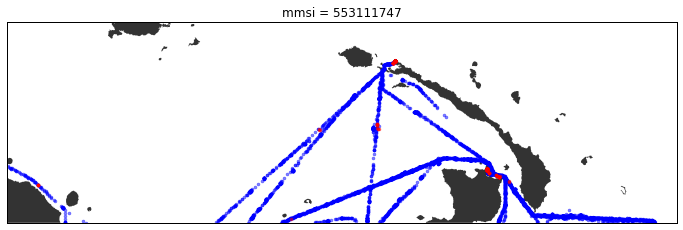

Waiting on bqjob_r44c6c6468b313be5_0000015450514c5c_295 ... (0s) Current status: DONE   
Query time: 2.31627893448 seconds.


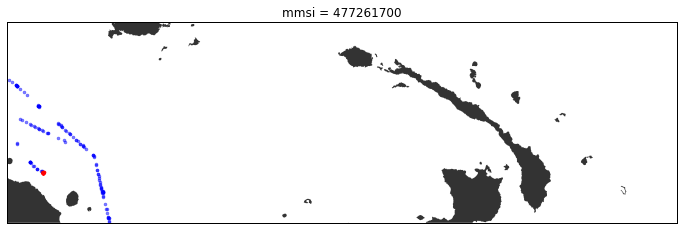

Waiting on bqjob_r2ec2c325e2efe465_0000015450515d66_296 ... (0s) Current status: DONE   
Query time: 2.61754107475 seconds.


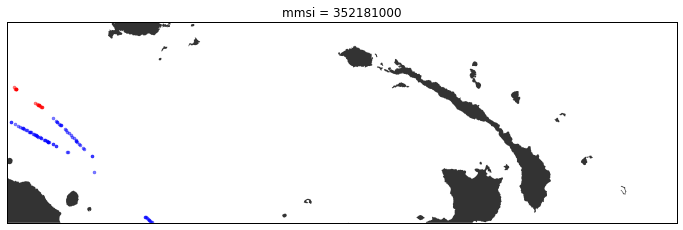

Waiting on bqjob_r48c2676d21a77481_0000015450516fdd_297 ... (0s) Current status: DONE   
Query time: 1.51592302322 seconds.


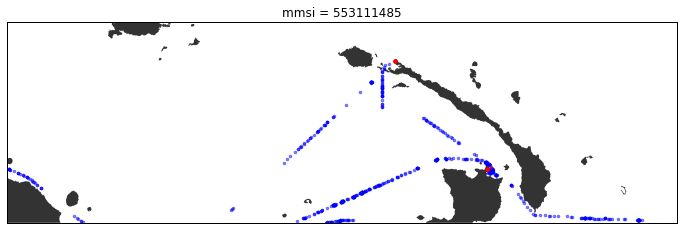

Waiting on bqjob_r7221d83b2fd41a07_0000015450517dc8_298 ... (0s) Current status: DONE   
Query time: 0.900338888168 seconds.


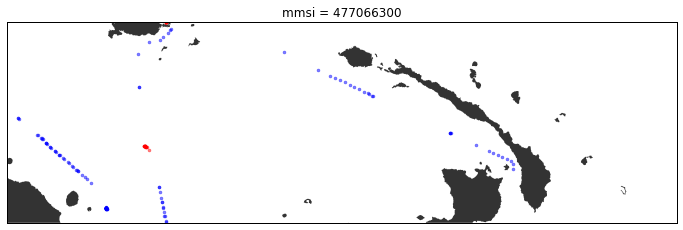

Waiting on bqjob_r6e2d093392e335a9_00000154505188dc_299 ... (0s) Current status: DONE   
Query time: 0.804721832275 seconds.


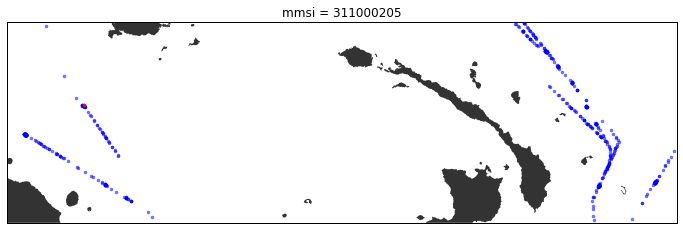

Waiting on bqjob_r5a0c1319fa8c1c36_00000154505193bb_300 ... (0s) Current status: DONE   
Query time: 1.10959100723 seconds.


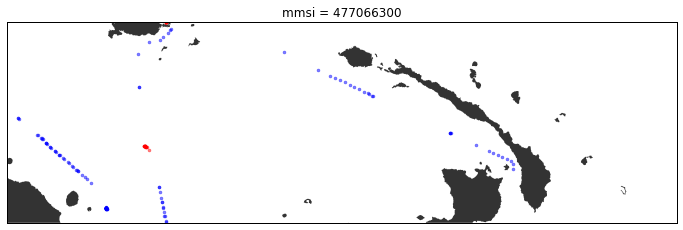

Waiting on bqjob_r74dd636b9b204e10_000001545051a01d_301 ... (0s) Current status: DONE   
Query time: 0.72437286377 seconds.


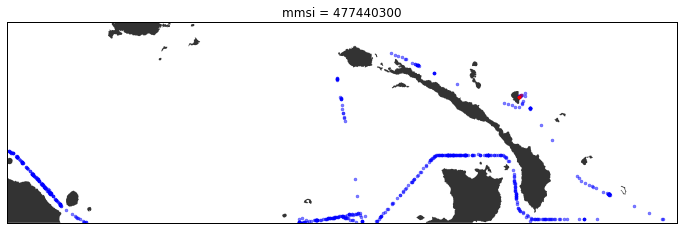

Waiting on bqjob_r55f662f5c62015b8_000001545051aa8a_302 ... (0s) Current status: DONE   
Query time: 1.82704091072 seconds.


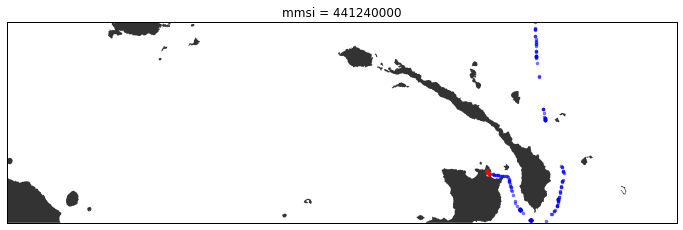

Waiting on bqjob_r6877ebbf2ce2bb0d_000001545051b94e_303 ... (0s) Current status: DONE   
Query time: 2.17491483688 seconds.


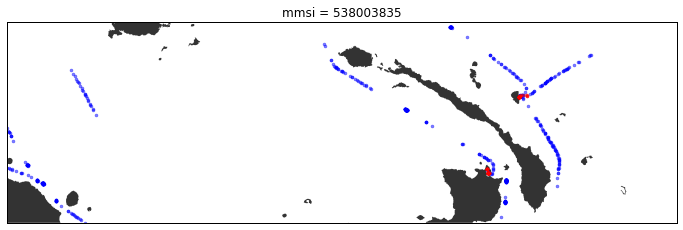

Waiting on bqjob_r7c5bbf975c0aaa5_000001545051c992_304 ... (0s) Current status: DONE   
Query time: 1.06529188156 seconds.


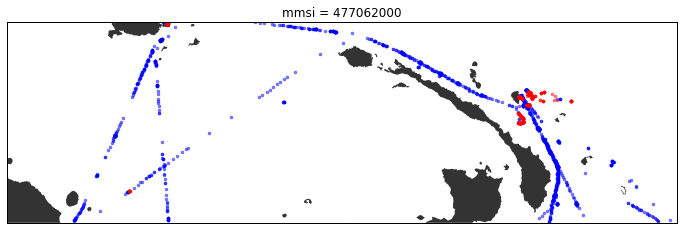

Waiting on bqjob_r60d1ed14ac369f8_000001545051d51f_305 ... (0s) Current status: DONE   
Query time: 1.07441496849 seconds.


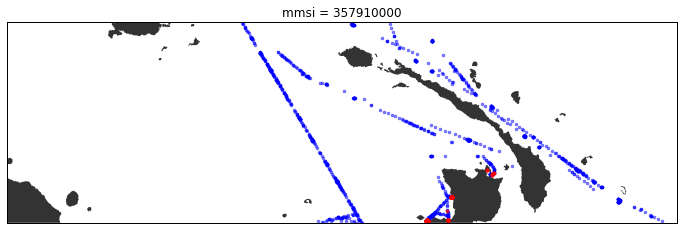

Waiting on bqjob_r5208ee17f9fe61c8_000001545051e0cf_306 ... (0s) Current status: DONE   
Query time: 2.21877288818 seconds.


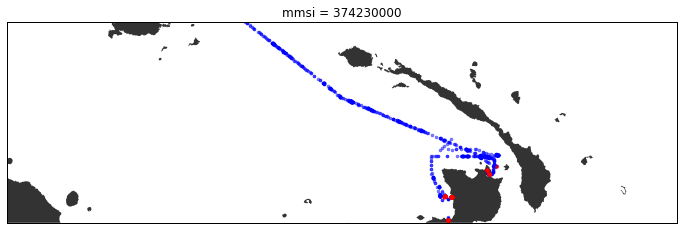

Waiting on bqjob_r423402fe6128c4f3_000001545051f0f1_307 ... (0s) Current status: DONE   
Query time: 2.37049794197 seconds.


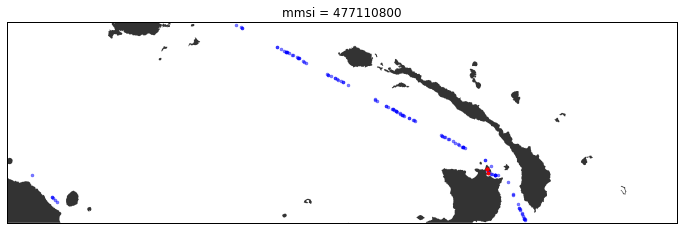

Waiting on bqjob_r223010db9046829c_000001545052017c_308 ... (0s) Current status: DONE   
Query time: 1.29394388199 seconds.


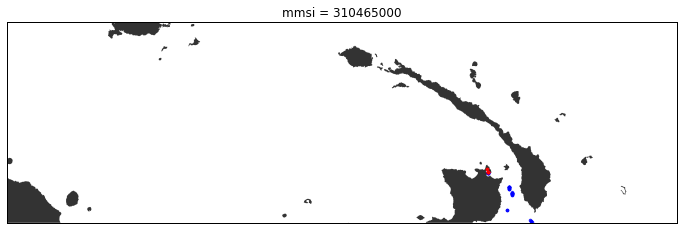

Waiting on bqjob_r353b5bfc90af6263_0000015450520dce_309 ... (0s) Current status: DONE   
Query time: 0.649913072586 seconds.


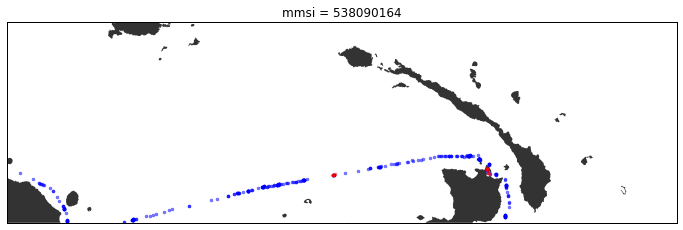

Waiting on bqjob_r404d944b78eaf784_00000154505217b0_310 ... (0s) Current status: DONE   
Query time: 1.84485912323 seconds.


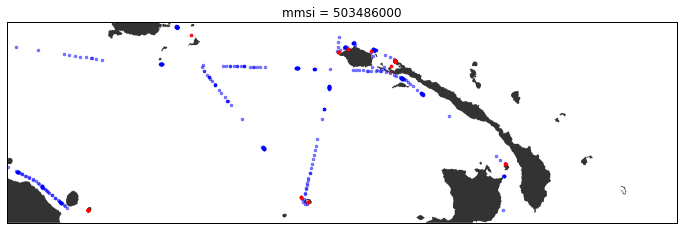

Waiting on bqjob_r55517f2e2ee26741_000001545052265f_311 ... (0s) Current status: DONE   
Query time: 1.8308532238 seconds.


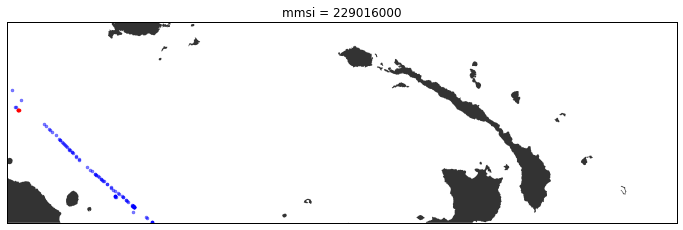

Waiting on bqjob_r580535a76f164435_00000154505234d7_312 ... (0s) Current status: DONE   
Query time: 1.9861600399 seconds.


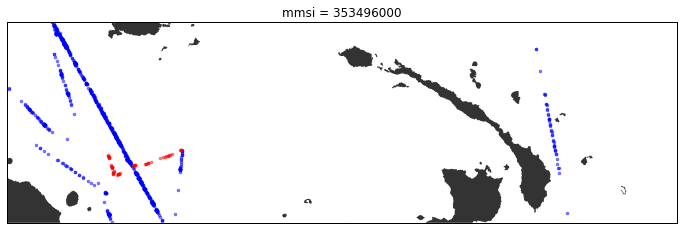

Waiting on bqjob_r52b330d8f9864488_00000154505243ff_313 ... (0s) Current status: DONE   
Query time: 2.04180002213 seconds.


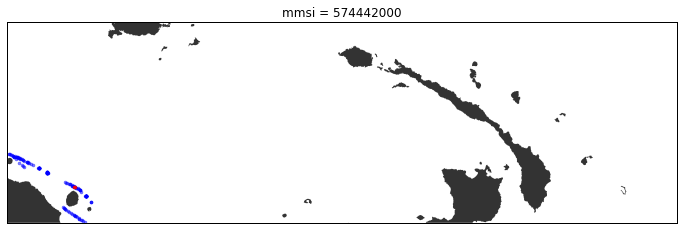

Waiting on bqjob_r437bfee874a27e73_000001545052536a_314 ... (0s) Current status: DONE   
Query time: 1.42631816864 seconds.


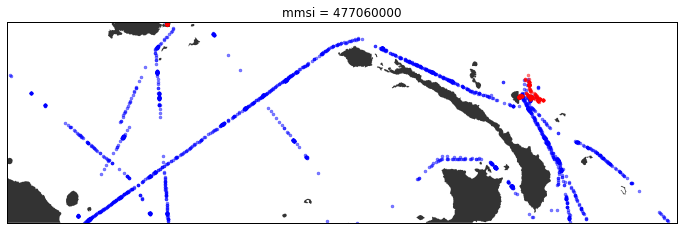

Waiting on bqjob_r650d59a49d624771_000001545052609a_315 ... (0s) Current status: DONE   
Query time: 2.07377099991 seconds.


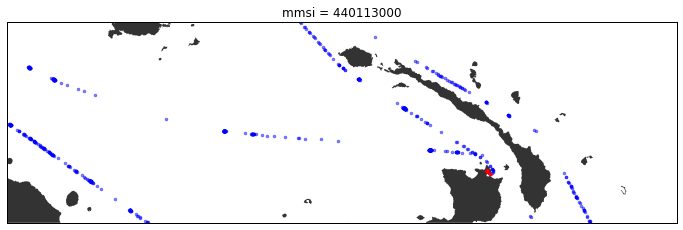

Waiting on bqjob_r34350e8dd589a977_000001545052700c_316 ... (0s) Current status: DONE   
Query time: 2.53234791756 seconds.


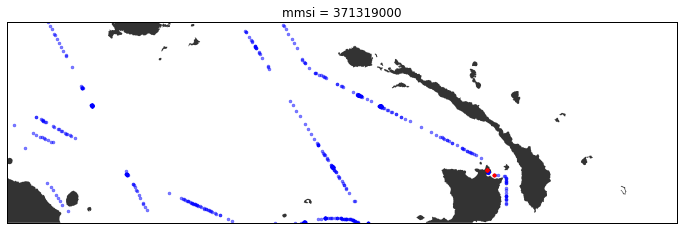

Waiting on bqjob_r2f059f157960f506_0000015450528146_317 ... (0s) Current status: DONE   
Query time: 2.27646994591 seconds.


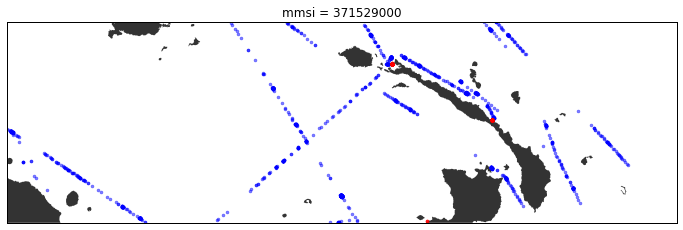

Waiting on bqjob_r3c518c70f73e0b95_00000154505291ae_318 ... (0s) Current status: DONE   
Query time: 2.02362704277 seconds.


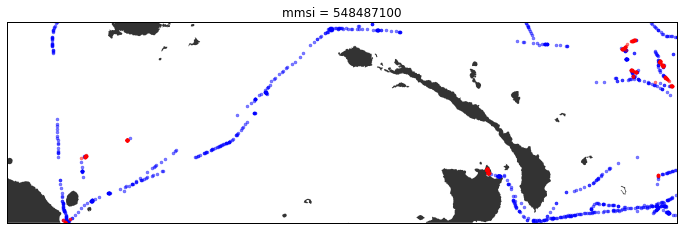

Waiting on bqjob_r4634eb0d704560d7_000001545052a0e6_319 ... (0s) Current status: DONE   
Query time: 2.01743006706 seconds.


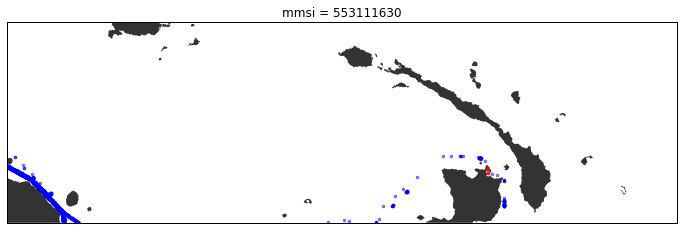

Waiting on bqjob_r5a7b87405f465c0d_000001545052b026_320 ... (0s) Current status: DONE   
Query time: 1.22169399261 seconds.


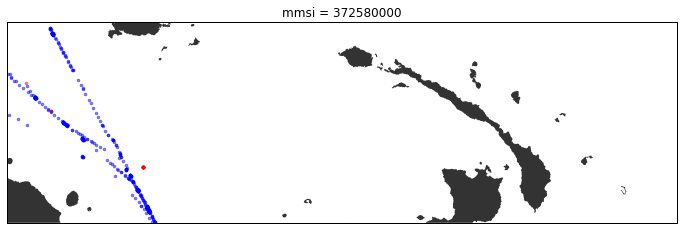

Waiting on bqjob_r3c2099789df91981_000001545052bc50_321 ... (0s) Current status: DONE   
Query time: 2.55651593208 seconds.


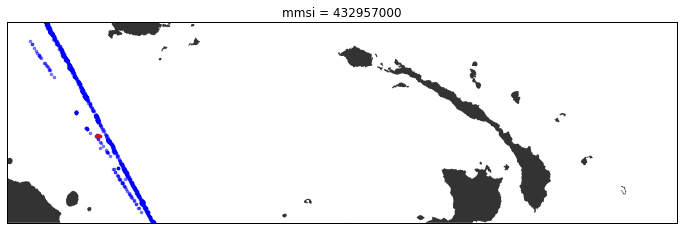

Waiting on bqjob_r40c64273f29f322b_000001545052cdd5_322 ... (0s) Current status: DONE   
Query time: 1.11010289192 seconds.


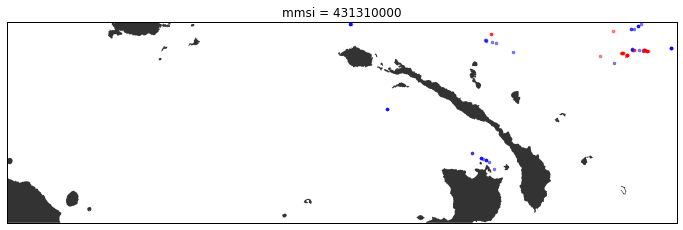

Waiting on bqjob_r5c6fd06d6f365b9a_000001545052d982_323 ... (0s) Current status: DONE   
Query time: 0.716394901276 seconds.


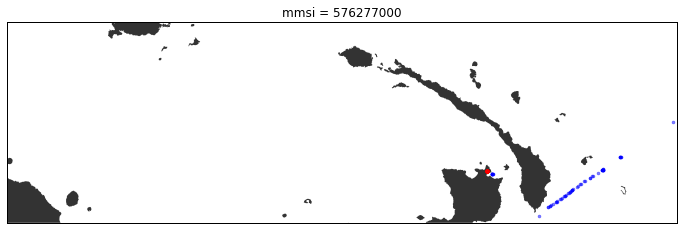

Waiting on bqjob_r406f8af702bbddd6_000001545052e3c7_324 ... (0s) Current status: DONE   
Query time: 2.02302408218 seconds.


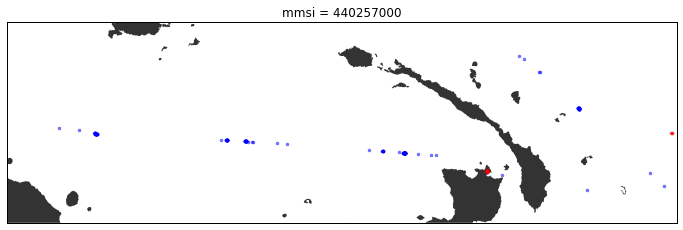

Waiting on bqjob_r2c49d98c157d9cfe_000001545052f300_325 ... (0s) Current status: DONE   
Query time: 2.08012104034 seconds.


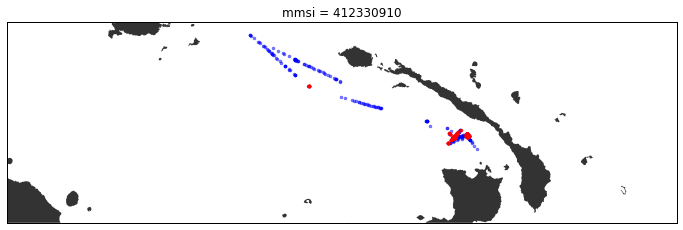

Waiting on bqjob_r14591874ffe2984d_0000015450530270_326 ... (0s) Current status: DONE   
Query time: 2.13267302513 seconds.


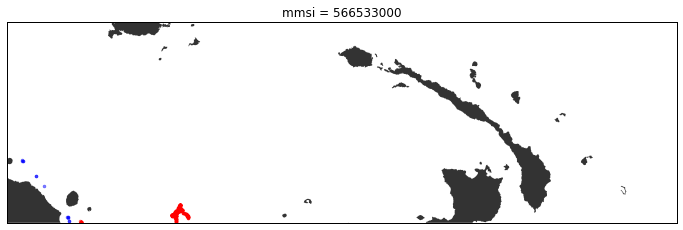

Waiting on bqjob_r2e98d3b82f3b21ae_0000015450531248_327 ... (0s) Current status: DONE   
Query time: 2.82374215126 seconds.


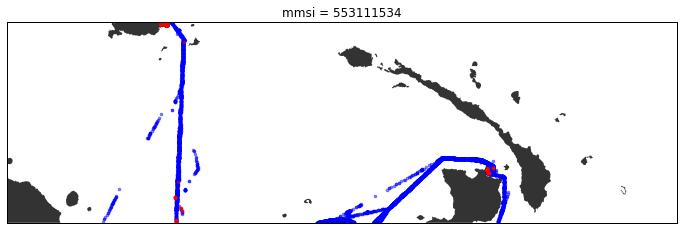

Waiting on bqjob_r61abdcc60bb70b89_000001545053250b_328 ... (0s) Current status: DONE   
Query time: 1.9312479496 seconds.


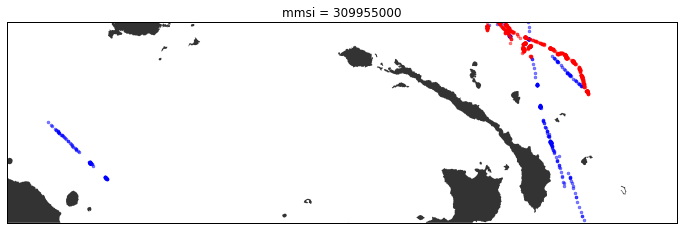

Waiting on bqjob_re537e6743abeef9_00000154505334b3_329 ... (0s) Current status: DONE   
Query time: 2.13739109039 seconds.


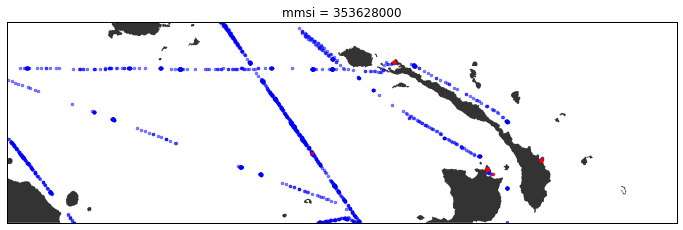

Waiting on bqjob_r179e639257b1b790_000001545053447f_330 ... (0s) Current status: DONE   
Query time: 1.04251194 seconds.


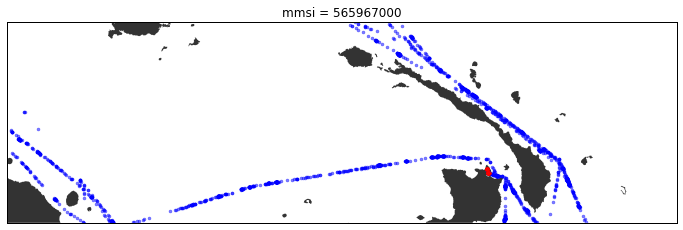

Waiting on bqjob_r7a9643e545b4bbcd_0000015450534fed_331 ... (0s) Current status: DONE   
Query time: 2.2661049366 seconds.


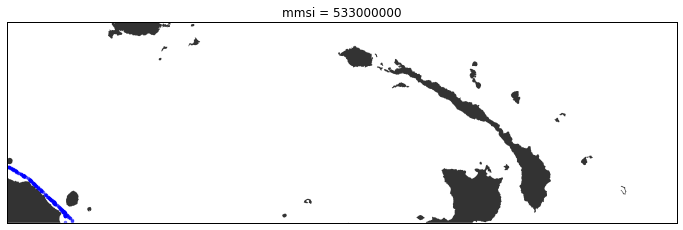

Waiting on bqjob_r2aab7767bd0e345a_0000015450536027_332 ... (0s) Current status: DONE   
Query time: 0.764909029007 seconds.


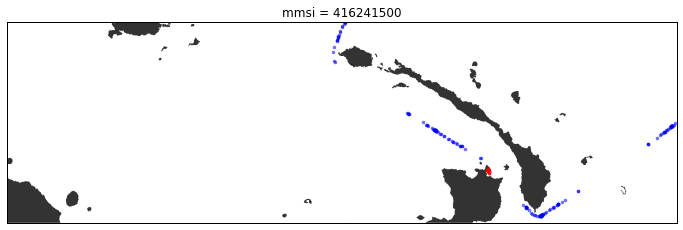

Waiting on bqjob_r4297ae9042f0aebc_0000015450536a7b_333 ... (0s) Current status: DONE   
Query time: 1.22654891014 seconds.


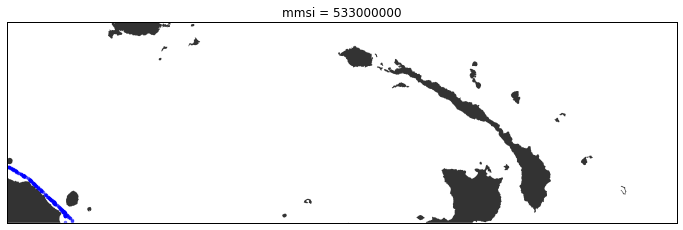

Waiting on bqjob_r1ed82db206a0436c_000001545053768f_334 ... (0s) Current status: DONE   
Query time: 1.38471698761 seconds.


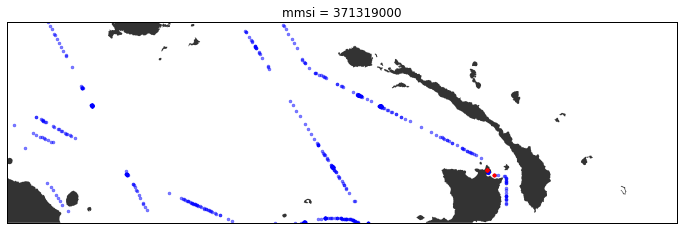

Waiting on bqjob_r32cfd5d583fb8b8a_0000015450538379_335 ... (0s) Current status: DONE   
Query time: 2.11891293526 seconds.


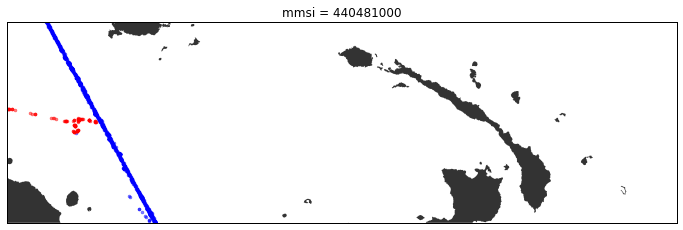

Waiting on bqjob_r4adf8854e516a663_0000015450539307_336 ... (0s) Current status: DONE   
Query time: 1.99916195869 seconds.


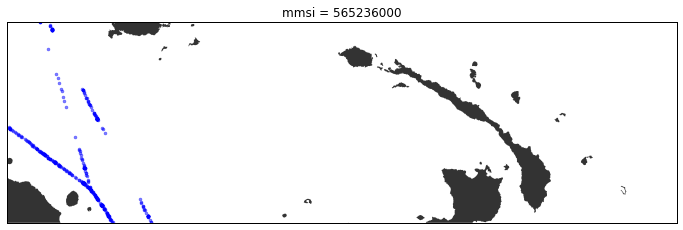

Waiting on bqjob_r72fccdf9b7fc1070_000001545053a237_337 ... (0s) Current status: DONE   
Query time: 1.97534298897 seconds.


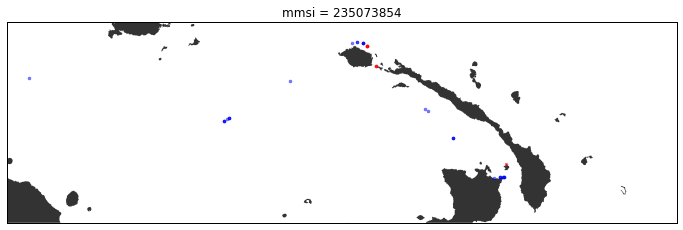

Waiting on bqjob_r1d5975a2d304ca10_000001545053b1e5_338 ... (0s) Current status: DONE   
Query time: 1.77721881866 seconds.


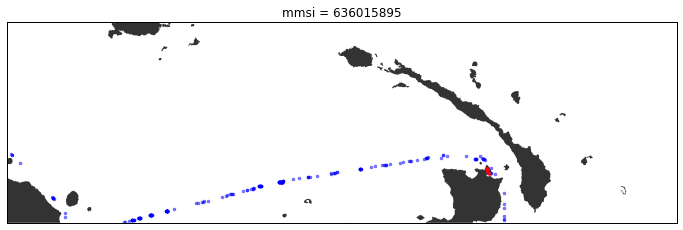

Waiting on bqjob_r53b8c256daf7ab49_000001545053c040_339 ... (0s) Current status: DONE   
Query time: 1.86698102951 seconds.


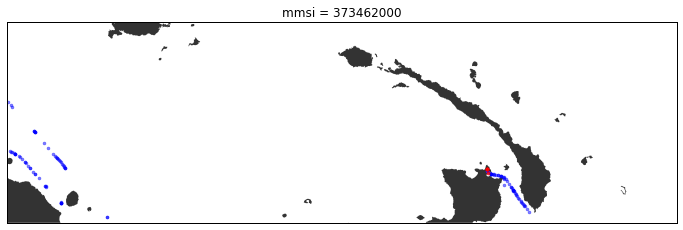

Waiting on bqjob_r1b4c51dfc61630c1_000001545053cf35_340 ... (0s) Current status: DONE   
Query time: 0.837822914124 seconds.


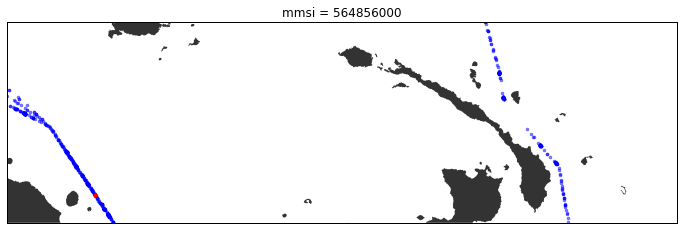

Waiting on bqjob_r1160b3628b00996b_000001545053db19_341 ... (0s) Current status: DONE   
Query time: 2.4033498764 seconds.


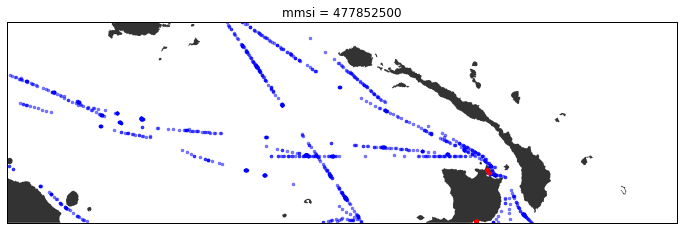

Waiting on bqjob_r43065db37cdc08f0_000001545053ec08_342 ... (0s) Current status: DONE   
Query time: 2.21931004524 seconds.


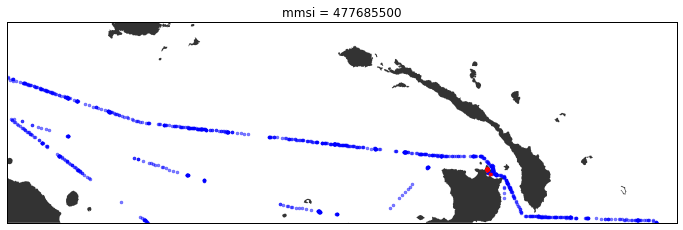

Waiting on bqjob_r2354a83f9995816a_000001545053fc89_343 ... (0s) Current status: DONE   
Query time: 1.81485199928 seconds.


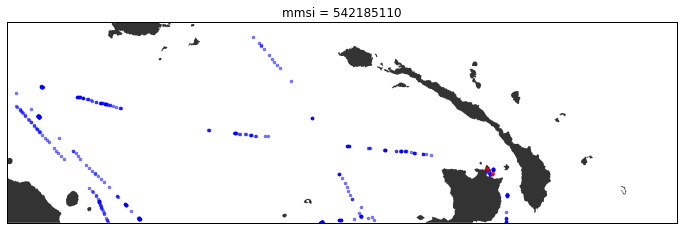

Waiting on bqjob_r138a969c3284ec34_0000015450540b8f_344 ... (0s) Current status: DONE   
Query time: 0.858767986298 seconds.


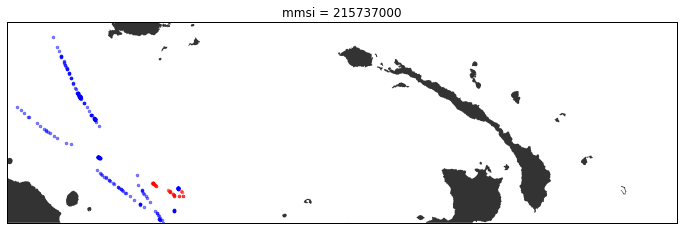

Waiting on bqjob_r4218bd78c5a35fb1_00000154505416d5_345 ... (0s) Current status: DONE   
Query time: 1.92208313942 seconds.


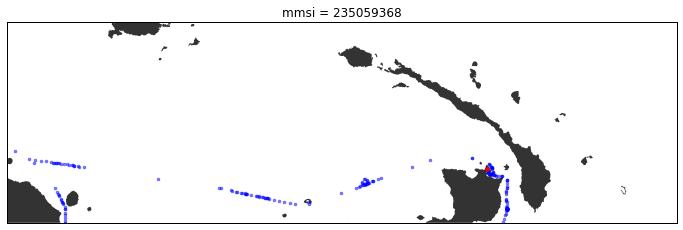

Waiting on bqjob_r7b6098eb41d7926f_000001545054262a_346 ... (0s) Current status: DONE   
Query time: 2.39507889748 seconds.


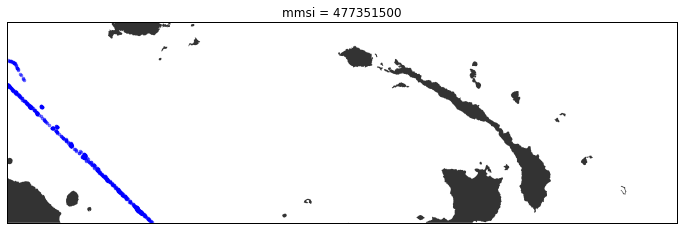

Waiting on bqjob_r27aa2c4f363b4c3b_000001545054379c_347 ... (0s) Current status: DONE   
Query time: 2.42017793655 seconds.


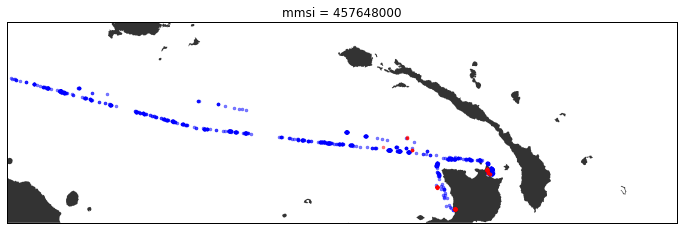

Waiting on bqjob_r1ba9c1d0bf02e81a_0000015450544905_348 ... (0s) Current status: DONE   
Query time: 0.876969814301 seconds.


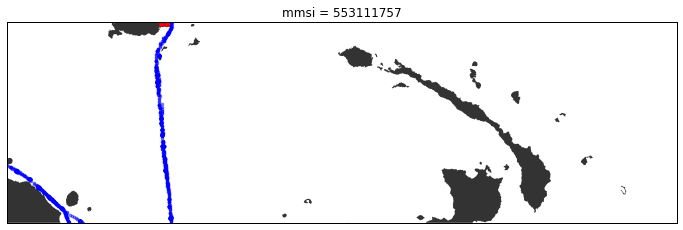

Waiting on bqjob_r2fae93f19c6f891d_000001545054546f_349 ... (0s) Current status: DONE   
Query time: 0.842293024063 seconds.


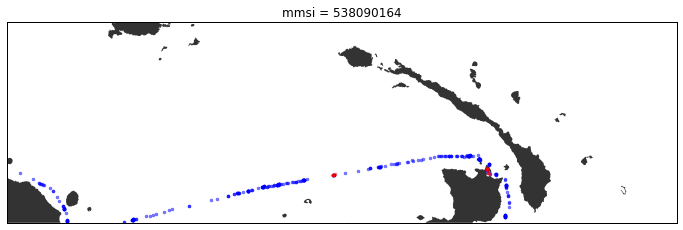

Waiting on bqjob_r15a16057253e184c_0000015450545fdb_350 ... (0s) Current status: DONE   
Query time: 2.02549290657 seconds.


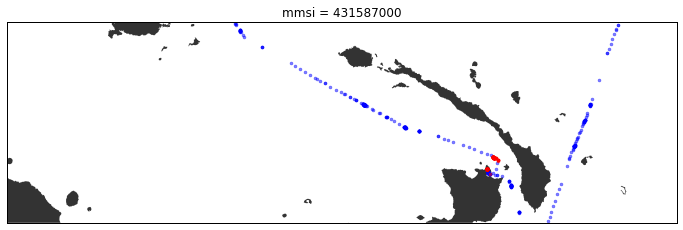

Waiting on bqjob_r17542c539f2bc465_0000015450546f32_351 ... (0s) Current status: DONE   
Query time: 0.999304056168 seconds.


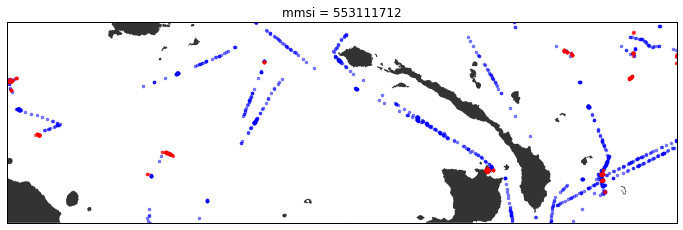

Waiting on bqjob_r2024664c22402_0000015450547a97_352 ... (0s) Current status: DONE   
Query time: 2.16208195686 seconds.


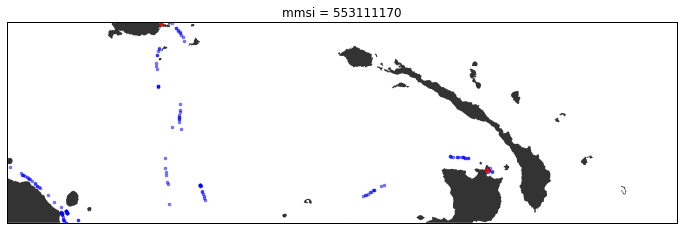

Waiting on bqjob_r73c00eb8af82d4e7_0000015450548aa7_353 ... (0s) Current status: DONE   
Query time: 0.878908872604 seconds.


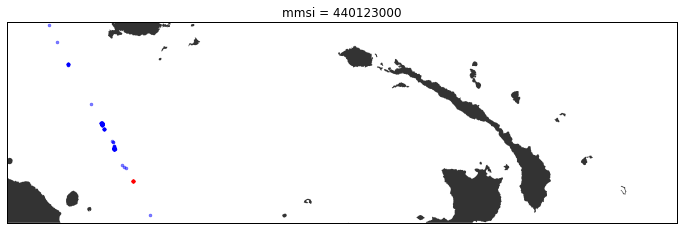

Waiting on bqjob_r2590d814bbbad48b_00000154505495a0_354 ... (0s) Current status: DONE   
Query time: 0.962832927704 seconds.


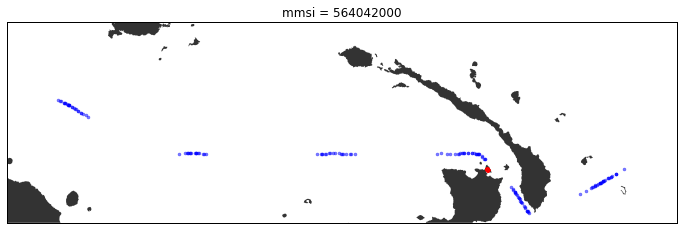

Waiting on bqjob_r4fed62a36ab5e046_000001545054a0ce_355 ... (0s) Current status: DONE   
Query time: 2.04891705513 seconds.


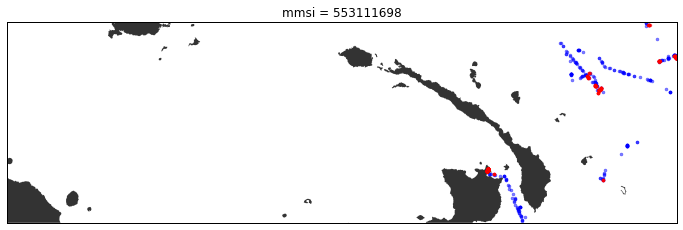

Waiting on bqjob_r73713082f1e080e5_000001545054b032_356 ... (0s) Current status: DONE   
Query time: 1.83063817024 seconds.


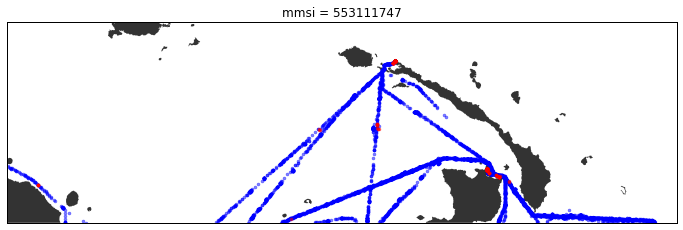

Waiting on bqjob_r7e482b81a5f23547_000001545054bef5_357 ... (0s) Current status: DONE   
Query time: 0.800501823425 seconds.


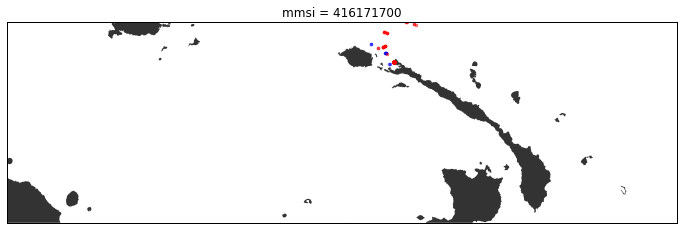

Waiting on bqjob_r25351c8a2763df1a_000001545054c9a3_358 ... (0s) Current status: DONE   
Query time: 1.21215200424 seconds.


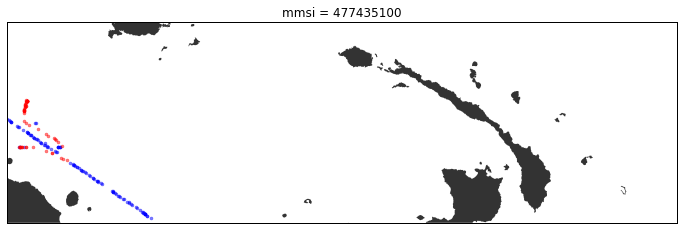

Waiting on bqjob_r7b93b2f6f1736707_000001545054d5bc_359 ... (0s) Current status: DONE   
Query time: 0.919378995895 seconds.


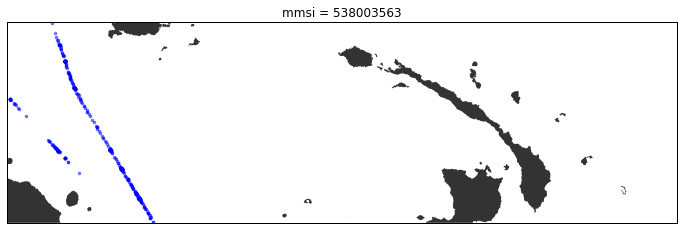

Waiting on bqjob_r1d50f8ded8385bf4_000001545054e0be_360 ... (0s) Current status: DONE   
Query time: 0.796183109283 seconds.


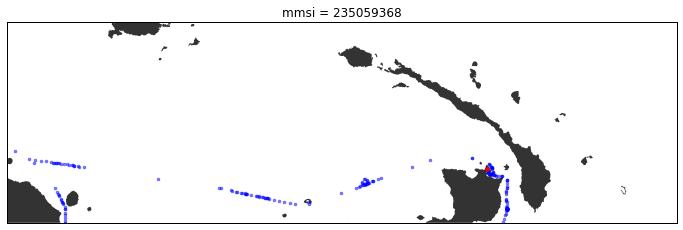

Waiting on bqjob_r2ba25c7f83dff728_000001545054eb5a_361 ... (0s) Current status: DONE   
Query time: 2.16737818718 seconds.


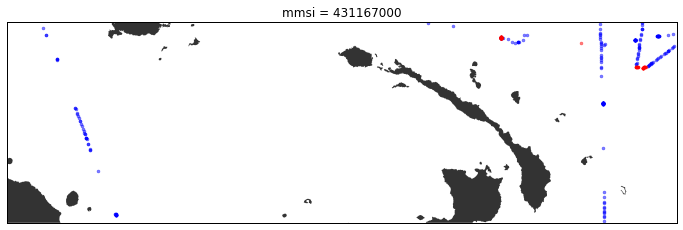

Waiting on bqjob_r7c57dccf3c6460fe_000001545054fb4c_362 ... (0s) Current status: DONE   
Query time: 2.14063096046 seconds.


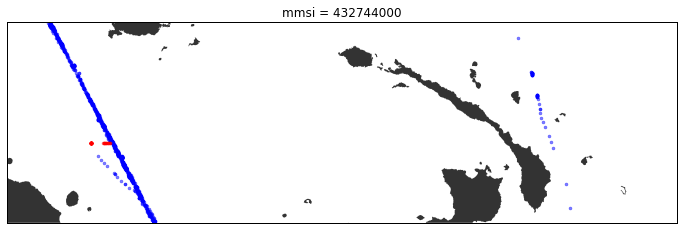

Waiting on bqjob_r4fe510169a0746b6_0000015450550b1c_363 ... (0s) Current status: DONE   
Query time: 2.02715706825 seconds.


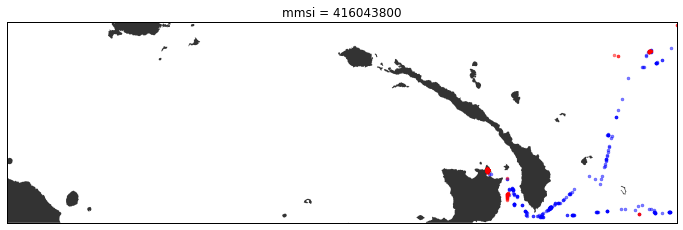

Waiting on bqjob_r20a861e30db368b4_0000015450551a80_364 ... (0s) Current status: DONE   
Query time: 1.06664395332 seconds.


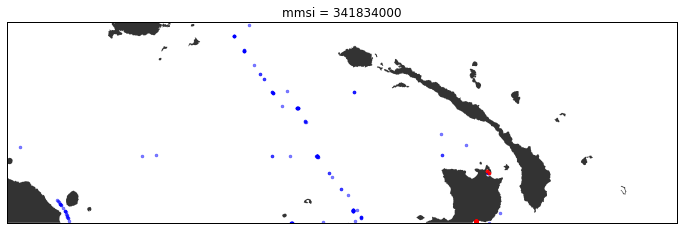

Waiting on bqjob_r2aa33835c8d17fe2_0000015450552616_365 ... (0s) Current status: DONE   
Query time: 1.39151406288 seconds.


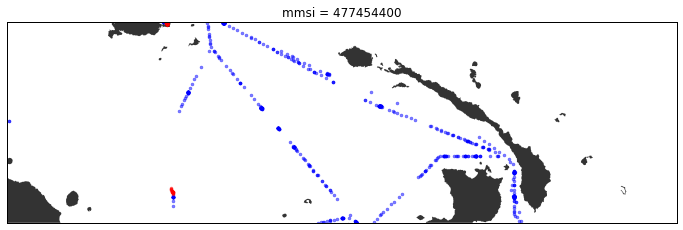

Waiting on bqjob_r4fe85f345b4d7e3d_00000154505532fa_366 ... (0s) Current status: DONE   
Query time: 2.19875478745 seconds.


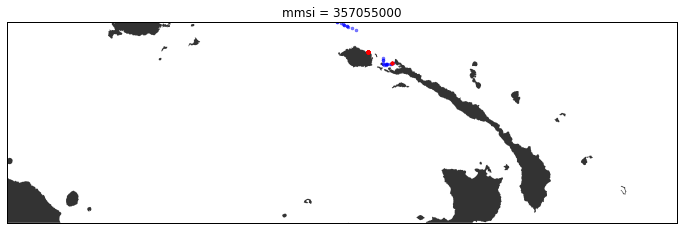

Waiting on bqjob_r484f79e1ca0e63d7_00000154505542fc_367 ... (0s) Current status: DONE   
Query time: 2.08051800728 seconds.


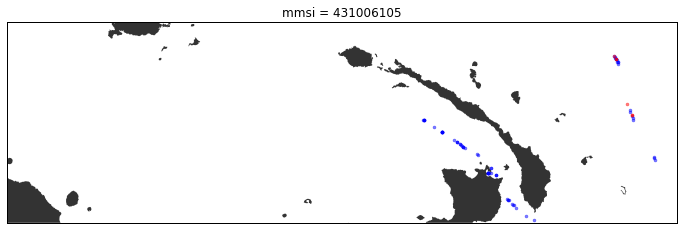

Waiting on bqjob_r1596d5e0df974151_0000015450555281_368 ... (0s) Current status: DONE   
Query time: 1.08997511864 seconds.


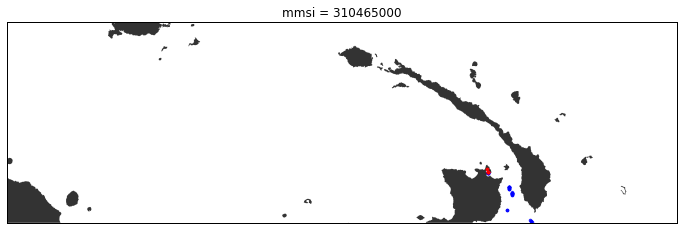

Waiting on bqjob_r19dde34234a0f549_0000015450555e31_369 ... (0s) Current status: DONE   
Query time: 1.42919206619 seconds.


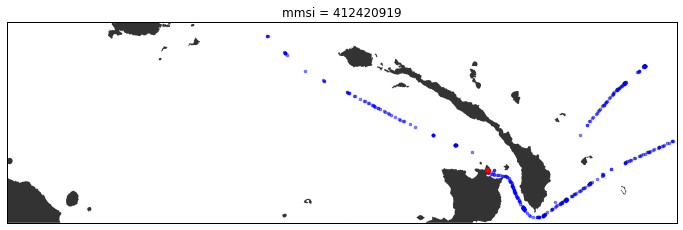

Waiting on bqjob_r39a37334d73e3397_0000015450556b29_370 ... (0s) Current status: DONE   
Query time: 2.11836385727 seconds.


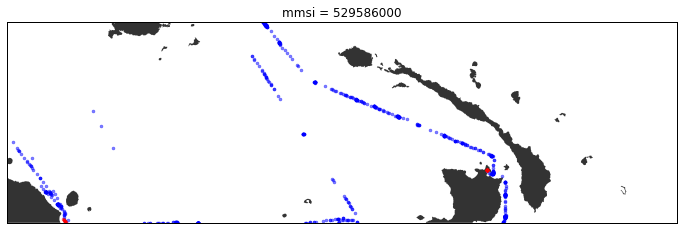

Waiting on bqjob_r2af6d61b34a9ff47_0000015450557af6_371 ... (0s) Current status: DONE   
Query time: 1.4823589325 seconds.


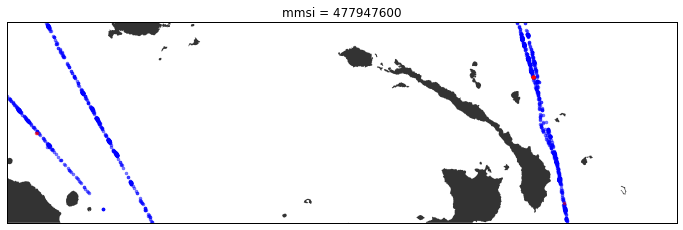

Waiting on bqjob_r1009e72495771824_000001545055884e_372 ... (0s) Current status: DONE   
Query time: 1.1659860611 seconds.


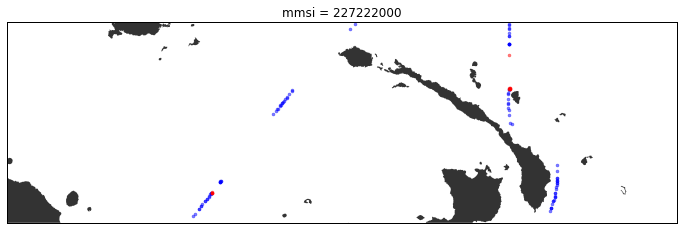

Waiting on bqjob_r5bd5ebd51379a5a4_000001545055944c_373 ... (0s) Current status: DONE   
Query time: 0.817406892776 seconds.


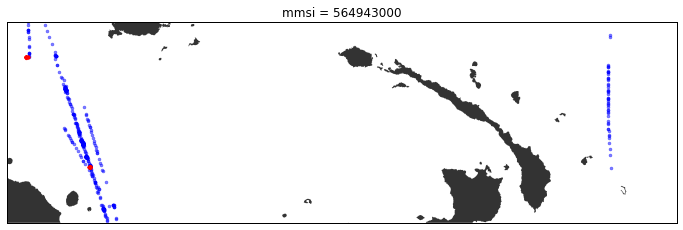

Waiting on bqjob_r252fb2bdd9306278_0000015450559f3a_374 ... (0s) Current status: DONE   
Query time: 2.9896800518 seconds.


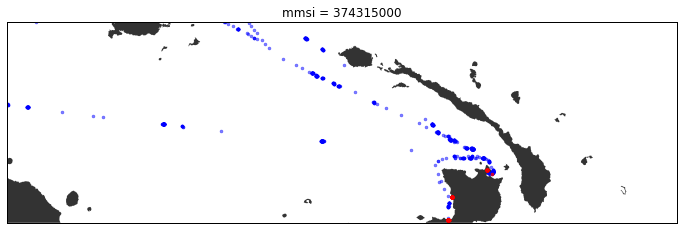

Waiting on bqjob_r789344fad838e49c_000001545055b2e8_375 ... (0s) Current status: DONE   
Query time: 2.18373084068 seconds.


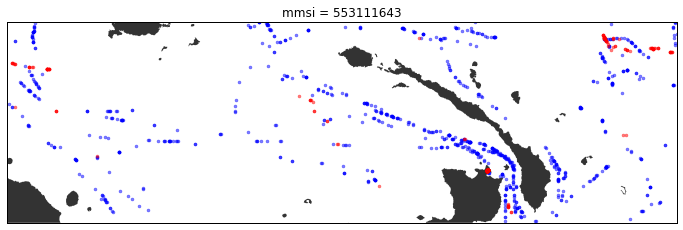

Waiting on bqjob_r2e4e576d3d33fdcb_000001545055c39a_376 ... (0s) Current status: DONE   
Query time: 1.16776394844 seconds.


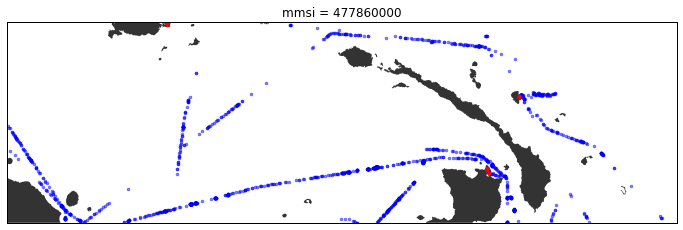

Waiting on bqjob_r1ce3c3a885475044_000001545055d00d_377 ... (0s) Current status: DONE   
Query time: 1.97547316551 seconds.


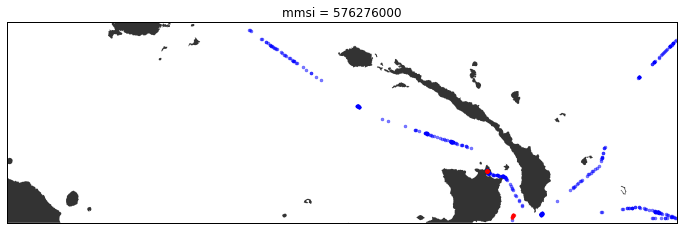

Waiting on bqjob_r4cf4499514d12128_000001545055df99_378 ... (0s) Current status: DONE   
Query time: 1.09989905357 seconds.


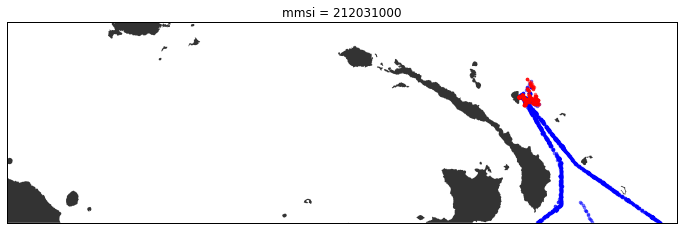

Waiting on bqjob_r50356e59b1323d13_000001545055ebe8_379 ... (0s) Current status: DONE   
Query time: 1.99433994293 seconds.


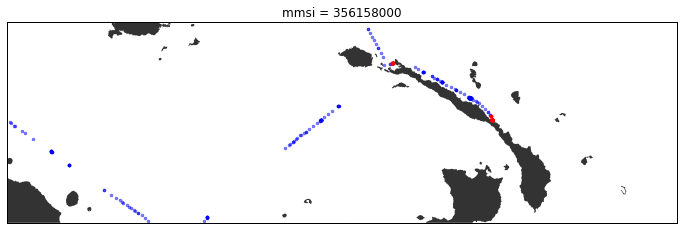

Waiting on bqjob_r7725cec9731d288d_000001545055fb72_380 ... (0s) Current status: DONE   
Query time: 0.947624921799 seconds.


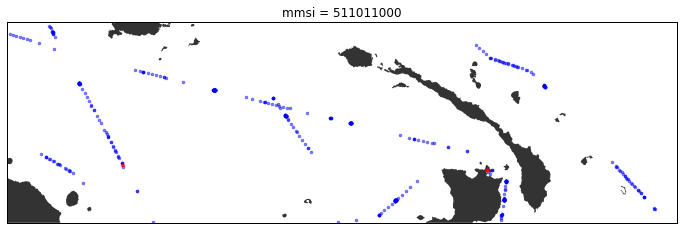

Waiting on bqjob_r5301aa54efb16037_0000015450560704_381 ... (0s) Current status: DONE   
Query time: 3.57826304436 seconds.


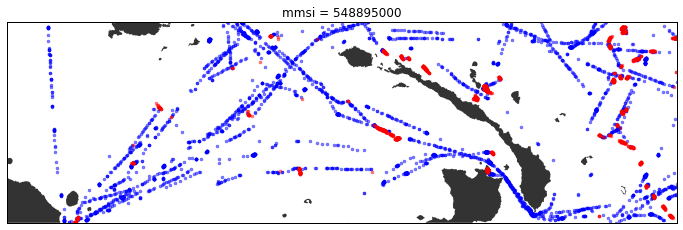

Waiting on bqjob_r3c55bfe7a7dc8220_0000015450561d27_382 ... (0s) Current status: DONE   
Query time: 0.731865167618 seconds.


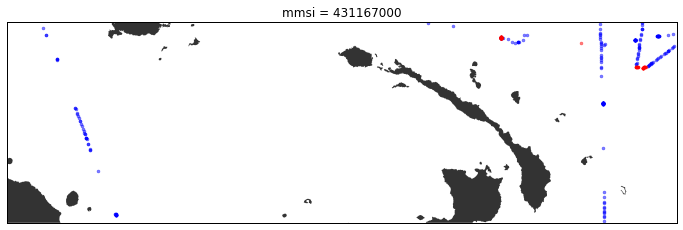

Waiting on bqjob_r1427ef2beb430217_00000154505627a8_383 ... (0s) Current status: DONE   
Query time: 2.08906078339 seconds.


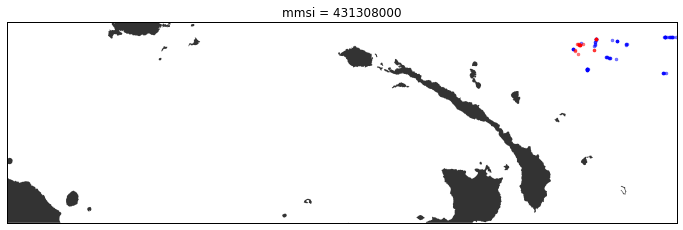

Waiting on bqjob_r43c2a173f680a2e0_00000154505637a0_384 ... (0s) Current status: DONE   
Query time: 1.9052529335 seconds.


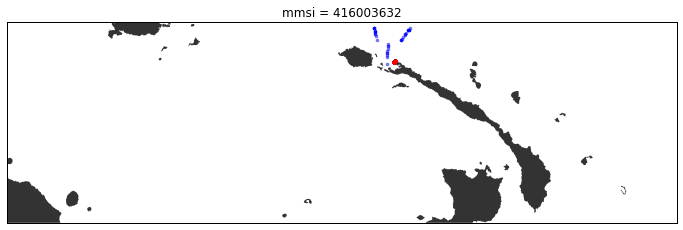

Waiting on bqjob_r542bb6a7414f0713_000001545056476b_385 ... (0s) Current status: DONE   
Query time: 0.820271968842 seconds.


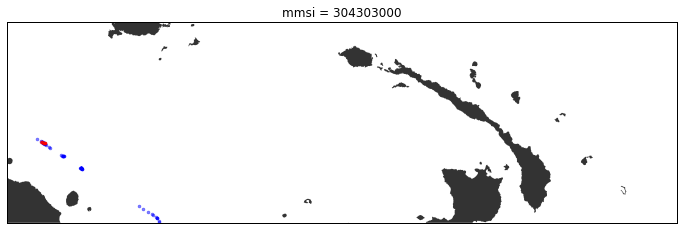

Waiting on bqjob_r69c55f8b1e836393_00000154505652a3_386 ... (0s) Current status: DONE   
Query time: 1.89120817184 seconds.


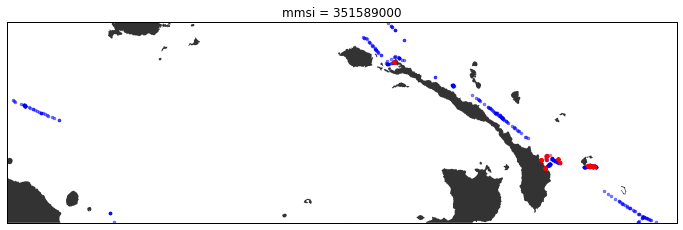

Waiting on bqjob_r600fe16abf5fd2f8_00000154505661ef_387 ... (0s) Current status: DONE   
Query time: 2.63661289215 seconds.


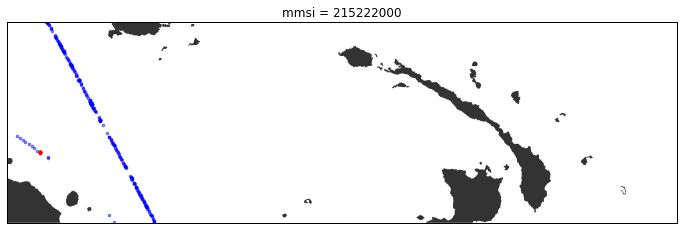

Waiting on bqjob_r19c91dffa3c22c90_0000015450567408_388 ... (0s) Current status: DONE   
Query time: 1.38743019104 seconds.


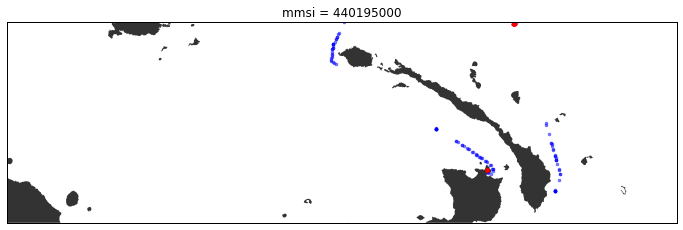

Waiting on bqjob_r4103556fcda56bde_000001545056811f_389 ... (0s) Current status: DONE   
Query time: 2.04455113411 seconds.


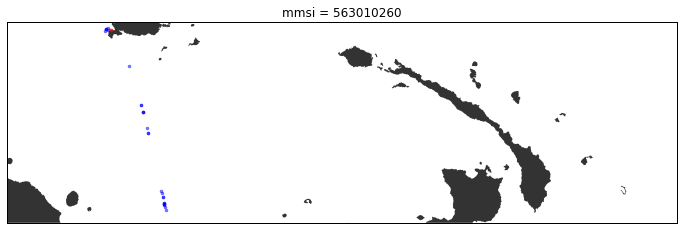

Waiting on bqjob_r65b69196b874e86f_00000154505690fc_390 ... (0s) Current status: DONE   
Query time: 2.05349802971 seconds.


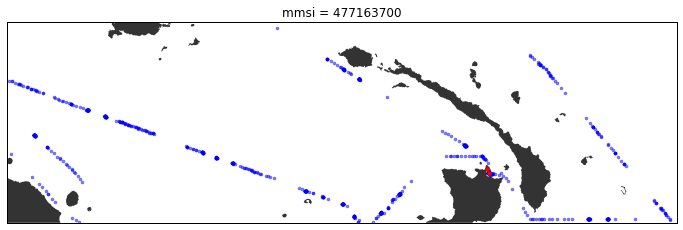

Waiting on bqjob_r601d7069662d2eee_000001545056a106_391 ... (0s) Current status: DONE   
Query time: 1.0507581234 seconds.


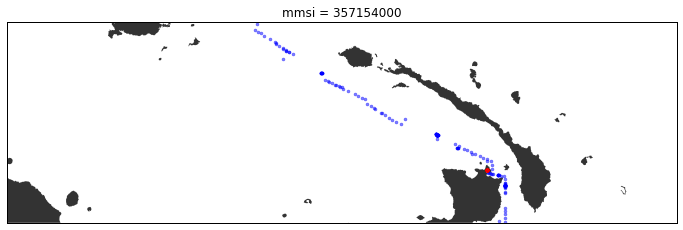

Waiting on bqjob_r3b13825e2e41cbee_000001545056ad53_392 ... (0s) Current status: DONE   
Query time: 2.13912796974 seconds.


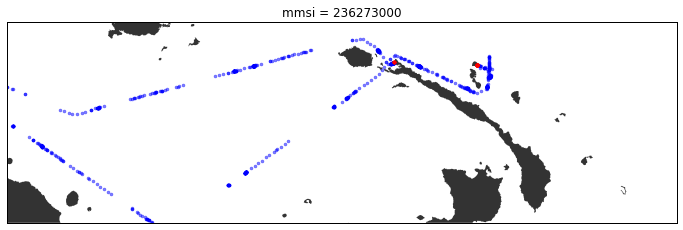

Waiting on bqjob_r379470264201e805_000001545056be10_393 ... (0s) Current status: DONE   
Query time: 1.11982989311 seconds.


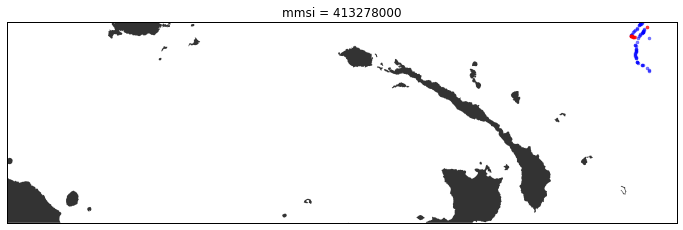

Waiting on bqjob_r3b05c510f3a53b5_000001545056ca3b_394 ... (0s) Current status: DONE   
Query time: 0.887391090393 seconds.


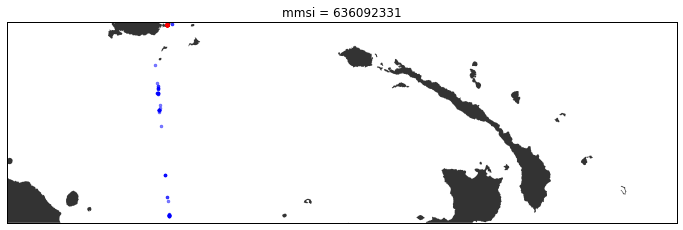

Waiting on bqjob_r5e75a64603f7cc6a_000001545056d598_395 ... (0s) Current status: DONE   
Query time: 1.93066596985 seconds.


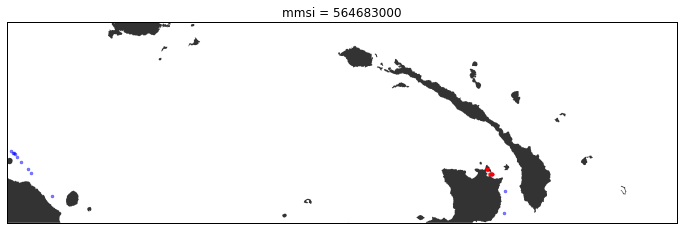

Waiting on bqjob_r5f063a99936038ac_000001545056e529_396 ... (0s) Current status: DONE   
Query time: 2.25765395164 seconds.


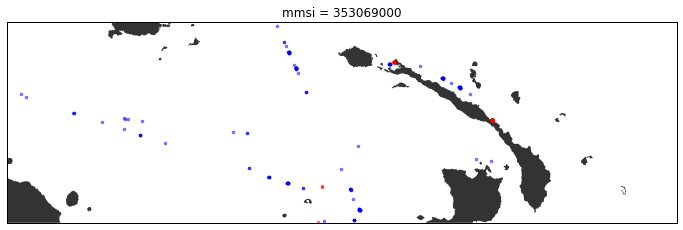

Waiting on bqjob_r45d88b5c9a7a78df_000001545056f5cb_397 ... (0s) Current status: DONE   
Query time: 2.63281178474 seconds.


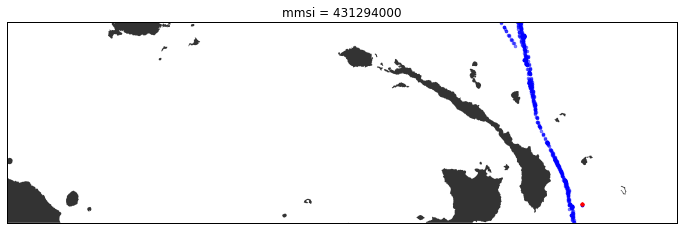

Waiting on bqjob_r238f1d35cc18022a_00000154505707f8_398 ... (0s) Current status: DONE   
Query time: 1.03817677498 seconds.


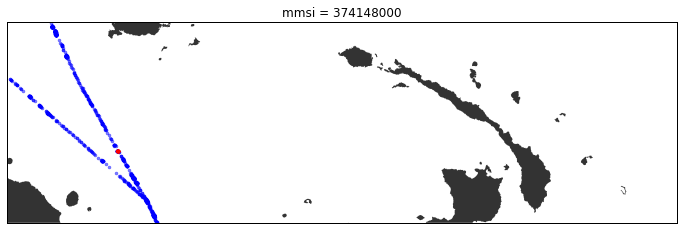

Waiting on bqjob_r1c914a8f80c73f4e_0000015450571444_399 ... (0s) Current status: DONE   
Query time: 0.878859043121 seconds.


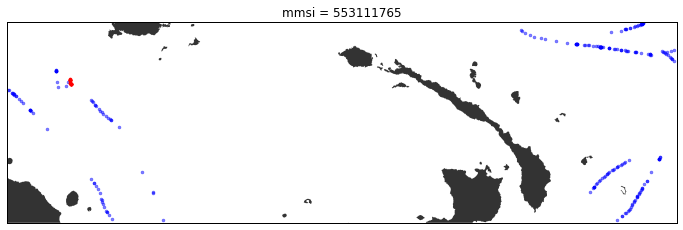

In [26]:
for m in mmsi:

    themmsi = str(m)
    
    q = '''
    select 
    timestamp,
    lat,
    lon,
    speed 
    from
    [scratch_david.Papua_DSM_Test]
    where mmsi = '''+str(m)+'''
    and speed is not null
    order by timestamp
    '''

    orb = Query(q)

    lats_fast = np.array([float(o[1]) for o in orb if float(o[3])>=3])
    lons_fast = np.array([float(o[2]) for o in orb if float(o[3])>=3])

    lats_slow = np.array([float(o[1]) for o in orb if float(o[3])<3])
    lons_slow = np.array([float(o[2]) for o in orb if float(o[3])<3])
    #times_orb = np.array([float(o[0]) for o in orb])
    
  
    fig = plt.figure()

    m = Basemap(llcrnrlon=145, llcrnrlat=-5,
            urcrnrlon=155,urcrnrlat=-2,projection='mill', resolution ='h')

    m.drawmapboundary()
    # m.drawcoastlines(linewidth=.2)
    m.fillcontinents('#333333',lake_color='#333333')
    x_fast,y_fast = m(lons_fast,lats_fast)
    m.plot(x_fast,y_fast,".",alpha = .5)
    x_slow,y_slow = m(lons_slow,lats_slow)
    m.plot(x_slow,y_slow,".",alpha = .5, color = "#FF0000")
    plt.title("mmsi = "+str(themmsi))
    plt.show()
    #plt.savefig(str(mmsi)+".png",bbox_inches='tight',dpi=300,transparent=True,pad_inches=.1, facecolor="#000000")
    #plt.savefig(str(themmsi)+".png",bbox_inches='tight',dpi=300,pad_inches=.1,transparent=True)
    plt.clf()
    #break